# <span style='color:SteelBlue'>P7 - Implémentez un modèle de scoring</span>

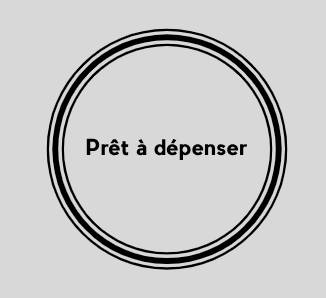

# <span class='bg-primary'>P7_01_01 - EDA - PARTIE 1</span>

Ce notebook traite de l'analyse exploratoire des jeux de données **application_train.csv** et **application_test.csv** mis à notre disposition à partir d'un kernel Kaggle.

## <span style='background:Thistle'>Sommaire du notebook</span> 

In [1]:
from jyquickhelper import add_notebook_menu
add_notebook_menu()

## <span style='background:Thistle'>1. Introduction</span>

*****
**Mission**
*****
**Développer un modèle de scoring de la probabilité de défaut de paiement du client** pour étayer la décision d'accorder ou non un prêt à un client potentiel en s’appuyant sur des sources de données variées (données comportementales, données provenant d'autres institutions financières...).

*****
**Objectifs**
*****
- analyser le jeu de données,
- Construire **un modèle de scoring** qui donnera une prédiction sur la probabilité de faillite d'un client de façon automatique,
- réaliser un **dashboard interactif** permettant aux chargés de clientèles d'expliquer de manière transparente la décision d'octroi ou non de crédit

*****
**Sources**
*****
- [Jeu de données](https://www.kaggle.com/c/home-credit-default-risk/data)

Le **Kernel Kaggle** utilisé pour l'analyse exploratoire ayant l'EDA le plus de commentaires et effectuant une analyse exploratoire complète sur toutes les fichiers csv mis à notre disposition a été livré par **Rishabh Rao** (Student at -Jaipur, Rajasthan, India).
- [Kernel Kaggle Rishabh Rao](https://www.kaggle.com/rishabhrao/home-credit-default-risk-extensive-eda)

Ce travail est complété par l'auteur par une présentation sur le site medium.com :
[Explications](https://medium.com/thecyphy/home-credit-default-risk-part-1-3bfe3c7ddd7a)

Les fonctions python utilisées pour l'EDA sont extraites du [github](https://github.com/rishabhrao1997/Home-Credit-Default-Risk) et stockées dans la librairie *EDA_KERNEL_FONCTIONS.py*.

*****
**Processus EDA** (*extrait du Kernel Kaggle*)
***

Pour l'analyse des données, nous allons suivre les étapes suivantes :
- [x] Pour chaque table, nous allons d'abord vérifier les **statistiques de base** comme :
    - le nombre d'enregistrements dans les tables, 
    - le nombre de caractéristiques, 
    - le nombre de valeurs NaN, etc.
- [x] Ensuite, nous allons **explorer** certaines des **caractéristiques par rapport à la variable cible** pour chaque table.

Nous utiliserons les graphiques suivants :
- [x] Pour les caractéristiques catégorielles, nous utiliserons principalement des diagrammes à barres et des diagrammes circulaires.
- [x] Pour les caractéristiques continues/numériques, nous utiliserons des Box-Plots, des Probability Density Function ([PDF](https://towardsdatascience.com/what-is-a-probability-density-function-d9b4b8bea121) [PDF](https://towardsdatascience.com/probability-distribution-functions-demystified-a6e882759af3)), des Cumulative Density Function [CDF](https://pub.towardsai.net/pdf-cdf-in-machine-learning-5a10f7abeef6) [CDF](https://sandeepdubey001.medium.com/pdf-probability-density-function-and-cdf-cumulative-distribution-function-a6a48945739e) et des Violin-Plots.

Enfin, nous tirerons des observations de chaque graphique et noterons les idées importantes générées par les graphiques.

*Toute la suite est extraite du Kernel Kaggle*

*****
**Processus EDA** 
***

Pour l'analyse des données, nous allons suivre les étapes suivantes :
- [x] Pour chaque table, nous allons d'abord vérifier les **statistiques de base** comme :
    - le nombre d'enregistrements dans les tables, 
    - le nombre de caractéristiques, 
    - le nombre de valeurs NaN, etc.
- [x] Ensuite, nous allons **explorer** certaines des **caractéristiques par rapport à la variable cible** pour chaque table.

Nous utiliserons les graphiques suivants :
- [x] Pour les caractéristiques catégorielles, nous utiliserons principalement des diagrammes à barres et des diagrammes circulaires.
- [x] Pour les caractéristiques continues/numériques, nous utiliserons des Box-Plots, des Probability Density Function ([PDF](https://towardsdatascience.com/what-is-a-probability-density-function-d9b4b8bea121) [PDF](https://towardsdatascience.com/probability-distribution-functions-demystified-a6e882759af3)), des Cumulative Density Function [CDF](https://pub.towardsai.net/pdf-cdf-in-machine-learning-5a10f7abeef6) [CDF](https://sandeepdubey001.medium.com/pdf-probability-density-function-and-cdf-cumulative-distribution-function-a6a48945739e) et des Violin-Plots.

Enfin, nous tirerons des observations de chaque graphique et noterons les idées importantes générées par les graphiques.

***
***Note 1 :*** 
***
- Pour les variables catégorielles, nous allons tracer des Bar Plots et des Pie Plots. L'utilisation des diagrammes en bâtons et en secteurs sera basée sur le nombre de catégories uniques présentes dans une caractéristique. Si une caractéristique a trop de catégories, les afficher sur des Pie Plots peut être encombrant, et les Bar Plots font un meilleur travail pour montrer chaque catégorie. De plus, le diagramme en bâtons sera préféré lorsque les proportions de toutes les catégories sont plus ou moins les mêmes afin d'identifier les petites différences.
- Nous allons suivre la stratégie mentionnée ci-dessous pour tracer les caractéristiques catégorielles dans l'ensemble du cahier :
    - Tout d'abord, nous tracerons la distribution de chaque catégorie dans l'ensemble des données, dans le premier sous-graphe.
    - Ensuite, dans le deuxième sous-graphe, nous tracerons le pourcentage de défaillants de chaque catégorie, c'est-à-dire avec la cible = 1.
    - Par exemple, si une caractéristique contient le sexe, c'est-à-dire Homme et Femme, alors pour le premier sous-graphe, nous tracerons le nombre d'occurrences de chacun de Homme et Femme dans notre ensemble de données. Dans le deuxième sous-graphe, nous tracerons le nombre ou le pourcentage d'hommes par défaut parmi les hommes présents dans l'ensemble de données. Nous ferons de même pour les femmes. Nous procédons ainsi parce qu'il y aura quelques catégories qui seront dominantes par rapport à d'autres, et leurs caractéristiques par défaut ne seront pas identifiables si nous regardons seulement les comptes.
    
***
***Note 2 :*** 
***

Pour l'analyse des variables continues, nous utiliserons quatre types de graphiques selon les besoins : Distplot, CDF, Box-plots et Violin Plots.

- **DistPlots** : Le distplot sera utilisé lorsque nous voudrons voir les PDF de la variable continue. Ces PDF nous aideront à analyser où se trouvent la plupart de nos données.
- **CDF** : Les CDF peuvent être utilisées comme une extension des PDF pour voir quel pourcentage de points se trouve sous une certaine valeur seuil. Cela nous donne une bonne estimation de la distribution de la majorité des données.
- **Box-Plots** : Les diagrammes en boîte sont utiles lorsque nous voulons analyser toute la gamme de valeurs de notre variable continue. Ils montrent les 25ème, 50ème et 75ème percentiles dans un seul graphique. De plus, il donne également des idées sur la présence de valeurs aberrantes dans un ensemble de valeurs donné.
- **Graphiques en violon** : Les Violin-Plots ont tendance à combiner les caractéristiques des Distplots et des Box-Plots. Ils imitent verticalement le box-plot et montrent les quantiles, l'étendue des valeurs, et horizontalement ils montrent le PDF de la variable continue.

In [2]:
# Chargement des librairies
import datetime
import sys
import time
from datetime import datetime
import warnings
import jyquickhelper
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import outils_data
import eda_kernel_fonctions
# import phik
# Plotly
import plotly
# import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Warnings
warnings.filterwarnings('ignore')
plotly.offline.init_notebook_mode(connected=True)

%matplotlib inline
# Chargement à chaud des librairies personnelles
%load_ext autoreload
%autoreload 2
# Valide code pep8
%load_ext pycodestyle_magic
%pycodestyle_on
# %pycodestyle_off

# Versions
print('Version des librairies utilisées :')
print('jyquickhelper         : ' + jyquickhelper.__version__)
print('Python                : ' + sys.version)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Outils dataframe      : ' + outils_data.__version__)
print('EDA KERNEL KAGGLE     : ' + eda_kernel_fonctions.__version__)
now = datetime.now().isoformat()
print('Lancé le           : ' + now)

Version des librairies utilisées :
jyquickhelper         : 0.4.220
Python                : 3.8.8 (default, Feb 24 2021, 15:54:32) [MSC v.1928 64 bit (AMD64)]
NumPy                 : 1.19.5
Pandas                : 1.2.4
Outils dataframe      : 0.0.4
EDA KERNEL KAGGLE     : 0.0.0
Lancé le           : 2021-07-14T20:53:31.739034


In [3]:
dico_pd_option = {
    'display.max_rows': 400,
    'display.max_column': 200,
    'display.width': 300,
    'display.precision': 4,
    'display.max_colwidth': 1000,
    'mode.chained_assignment': None
    #     # pandas DataFrame column and row display limits
    #     'max_columns': None,
    #     'max_rows': None,
    #     'display.max_colwidth': 800
}
for cle, val in dico_pd_option.items():
    pd.set_option(cle, val)

## <span style='background:Thistle'>2. Jeux de données</span>

### <span style='background:PowderBlue'>2.1. Vue d'ensemble</span>

In [4]:
# Répertoire de stockages des fichiers mis à notre disposition
path = 'data/'

**Liste des fichiers .csv**

In [5]:
outils_data.lister_fichiers_repertoire(path)

'10 fichiers présents dans ce répertoire :'

Nom_fichier,Size_en_MB
application_test.csv,25.3400
application_train.csv,158.4400
bureau.csv,162.1400
bureau_balance.csv,358.1900
credit_card_balance.csv,404.9100
HomeCredit_columns_description-SAV.csv,0.0400
HomeCredit_columns_description.csv,0.0400
installments_payments.csv,689.6200
POS_CASH_balance.csv,374.5100
previous_application.csv,386.2100


**Relation entre les différents fichiers**

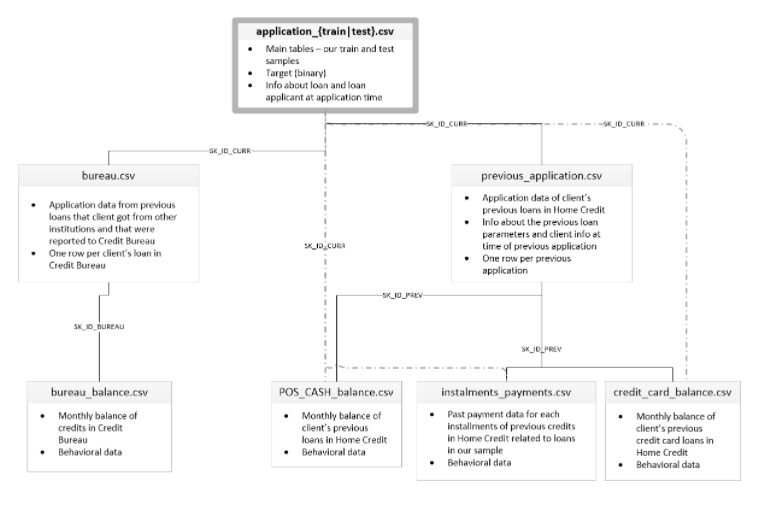

**Description des fichiers**

| Fichier | Description |
| --- | --- |
| <p style='text-align: justify;'>**application_train.csv** <br> **application_test.csv**</p> | <ul style='text-align: justify;'><li>Il s'agit du tableau principal, divisé en deux fichiers pour Train (avec TARGET) et Test (sans TARGET).</li> <li>Données statiques pour toutes les applications.</li><li>Une ligne représente un prêt dans notre échantillon de données.</li></ul> |
|  <p style='text-align: justify;'>**bureau.csv** |  <ul style='text-align: justify;'><li>Tous les crédits précédents du client fournis par d'autres institutions financières qui ont été rapportés au Credit Bureau (pour les clients qui ont un prêt dans notre échantillon). </li> <li> Pour chaque prêt de notre échantillon, il y a autant de lignes que le nombre de crédits que le client avait dans le Credit Bureau avant la date de la demande.</li> |
| <p style='text-align: justify;'>**bureau_balance.csv** | <ul style='text-align: justify;'><li>Soldes mensuels des crédits précédents dans Credit Bureau. </li> <li> Ce tableau a une ligne pour chaque mois d'historique de chaque crédit précédent rapporté au Credit Bureau - c'est-à-dire que le tableau a (#prêts dans l'échantillon * # de crédits précédents relatifs * # de mois où nous avons un historique observable pour les crédits précédents) des lignes.</li></ul> |
| <p style='text-align: justify;'>**POS_CASH_balance.csv** | <ul style='text-align: justify;'><li>Instantanés des soldes mensuels des prêts POS (point of sales) et cash précédents que le demandeur a eu avec Home Credit. </li> <li> Ce tableau comporte une ligne pour chaque mois de l'historique de chaque crédit précédent au Home Credit (crédit à la consommation et prêts au comptant) lié aux prêts de notre échantillon - c'est-à-dire que le tableau comporte (# de prêts dans l'échantillon * # de crédits précédents relatifs * # de mois dans lesquels nous avons un historique observable pour les crédits précédents) lignes.</li></ul> |
| <p style='text-align: justify;'>**credit_card_balance.csv** | <ul style='text-align: justify;'><li>Instantanés des soldes mensuels des cartes de crédit précédentes que le demandeur possède chez Home Credit. </li> <li>  Ce tableau comporte une ligne pour chaque mois de l'historique de chaque crédit précédent dans le Home Credit (crédit à la consommation et prêts de trésorerie) lié aux prêts de notre échantillon - c'est-à-dire que le tableau comporte (#prêts dans l'échantillon * # de cartes de crédit précédentes relatives * # de mois où nous avons un historique observable pour la carte de crédit précédente) lignes.</li></ul>|
| <p style='text-align: justify;'>**previous_application.csv** | <ul style='text-align: justify;'><li>Toutes les demandes précédentes de prêts pour le crédit immobilier des clients qui ont des prêts dans notre échantillon. </li> <li> Il y a une ligne pour chaque demande antérieure liée aux prêts dans notre échantillon de données.</li></ul> |
| <p style='text-align: justify;'>**installments_payments.csv** | <ul style='text-align: justify;'><li>Historique des remboursements pour les crédits précédemment déboursés dans Home Credit liés aux prêts de notre échantillon. </li> <li>  Il y a a) une ligne pour chaque paiement qui a été effectué plus b) une ligne pour chaque paiement manqué. Une ligne équivaut à un paiement d'un versement OU à un versement correspondant à un paiement d'un crédit précédent de Home Credit lié aux prêts de notre échantillon.</li></ul> |
| <p style='text-align: justify;'>**HomeCredit_columns_description.csv** | <ul style='text-align: justify;'><li>Ce fichier contient les descriptions des colonnes des différents fichiers de données.</li></ul> |

**Chargement des fichiers**

In [5]:
application_train, application_test, bureau, bureau_balance, cc_balance, \
    installments_payments, POS_CASH_balance, previous_application, \
    HomeCredit_columns_description = \
    eda_kernel_fonctions.load_all_tables(path)

Chargement des jeux de donnees...
--------------------------------------------------------------------
Fichier application_train.csv chargé -> dataframe : application_train
Fichier application_test.csv chargé -> dataframe : application_test
Fichier bureau.csv chargé -> dataframe : bureau
Fichier bureau_balance.csv chargé -> dataframe : bureau_balance
Fichier credit_card_balance.csv chargé -> dataframe : cc_balance
Fichier installments_payments.csv chargé -> dataframe : installments_payments
Fichier POS_CASH_balance.csv chargé -> dataframe : POS_CASH_balance
Fichier HomeCredit_columns_description.csv chargé -> dataframe : HomeCredit_columns_description
Fichier previous_application.csv chargé -> dataframe : previous_application
--------------------------------------------------------------------
Chargement des 9 jeux de donnees termineéen 0:00:32.558973 secondes


**Vue d'ensemble**

In [7]:
# Vue d'ensemble des 9 jeux de données
dataframes = [application_train, application_test, bureau, bureau_balance,
              cc_balance, installments_payments, POS_CASH_balance,
              previous_application, HomeCredit_columns_description]
noms = ['application_train', 'application_test', 'bureau', 'bureau_balance',
        'cc_balance', 'installments_payments', 'POS_CASH_balance',
        'previous_application', 'HomeCredit_columns_description']
outils_data.resume_datasets(dataframes, noms)

Les données se décomposent en 9 fichier(s).


Jeu de données,Nb lignes,Nb variables,Nb nan,% nan,Nb var avec nan,Var avec nan
application_train,307511,122,9152465,24.3959,67,"AMT_ANNUITY, AMT_GOODS_PRICE, NAME_TYPE_SUITE, OWN_CAR_AGE, OCCUPATION_TYPE, CNT_FAM_MEMBERS, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, NONLIVINGAPARTMENTS_AVG, NONLIVINGAREA_AVG, APARTMENTS_MODE, BASEMENTAREA_MODE, YEARS_BEGINEXPLUATATION_MODE, YEARS_BUILD_MODE, COMMONAREA_MODE, ELEVATORS_MODE, ENTRANCES_MODE, FLOORSMAX_MODE, FLOORSMIN_MODE, LANDAREA_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, NONLIVINGAPARTMENTS_MODE, NONLIVINGAREA_MODE, APARTMENTS_MEDI, BASEMENTAREA_MEDI, YEARS_BEGINEXPLUATATION_MEDI, YEARS_BUILD_MEDI, COMMONAREA_MEDI, ELEVATORS_MEDI, ENTRANCES_MEDI, FLOORSMAX_MEDI, FLOORSMIN_MEDI, LANDAREA_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI, NONLIVINGAPARTMENTS_MEDI, NONLIVINGAREA_MEDI, FONDKAPREMONT_MODE, HOUSETYPE_MODE, TOTALAREA_MODE, WALLSMATERIAL_MODE, EMERGENCYSTATE_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR"
application_test,48744,121,1404419,23.8117,64,"AMT_ANNUITY, NAME_TYPE_SUITE, OWN_CAR_AGE, OCCUPATION_TYPE, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, NONLIVINGAPARTMENTS_AVG, NONLIVINGAREA_AVG, APARTMENTS_MODE, BASEMENTAREA_MODE, YEARS_BEGINEXPLUATATION_MODE, YEARS_BUILD_MODE, COMMONAREA_MODE, ELEVATORS_MODE, ENTRANCES_MODE, FLOORSMAX_MODE, FLOORSMIN_MODE, LANDAREA_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, NONLIVINGAPARTMENTS_MODE, NONLIVINGAREA_MODE, APARTMENTS_MEDI, BASEMENTAREA_MEDI, YEARS_BEGINEXPLUATATION_MEDI, YEARS_BUILD_MEDI, COMMONAREA_MEDI, ELEVATORS_MEDI, ENTRANCES_MEDI, FLOORSMAX_MEDI, FLOORSMIN_MEDI, LANDAREA_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI, NONLIVINGAPARTMENTS_MEDI, NONLIVINGAREA_MEDI, FONDKAPREMONT_MODE, HOUSETYPE_MODE, TOTALAREA_MODE, WALLSMATERIAL_MODE, EMERGENCYSTATE_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR"
bureau,1716428,17,3939947,13.5026,7,"DAYS_CREDIT_ENDDATE, DAYS_ENDDATE_FACT, AMT_CREDIT_MAX_OVERDUE, AMT_CREDIT_SUM, AMT_CREDIT_SUM_DEBT, AMT_CREDIT_SUM_LIMIT, AMT_ANNUITY"
bureau_balance,27299925,3,0,0.0000,0,
cc_balance,3840312,23,5877356,6.6541,9,"AMT_DRAWINGS_ATM_CURRENT, AMT_DRAWINGS_OTHER_CURRENT, AMT_DRAWINGS_POS_CURRENT, AMT_INST_MIN_REGULARITY, AMT_PAYMENT_CURRENT, CNT_DRAWINGS_ATM_CURRENT, CNT_DRAWINGS_OTHER_CURRENT, CNT_DRAWINGS_POS_CURRENT, CNT_INSTALMENT_MATURE_CUM"
installments_payments,13605401,8,5810,0.0053,2,"DAYS_ENTRY_PAYMENT, AMT_PAYMENT"
POS_CASH_balance,10001358,8,52158,0.0652,2,"CNT_INSTALMENT, CNT_INSTALMENT_FUTURE"
previous_application,1670214,37,11109336,17.9769,16,"AMT_ANNUITY, AMT_CREDIT, AMT_DOWN_PAYMENT, AMT_GOODS_PRICE, RATE_DOWN_PAYMENT, RATE_INTEREST_PRIMARY, RATE_INTEREST_PRIVILEGED, NAME_TYPE_SUITE, CNT_PAYMENT, PRODUCT_COMBINATION, DAYS_FIRST_DRAWING, DAYS_FIRST_DUE, DAYS_LAST_DUE_1ST_VERSION, DAYS_LAST_DUE, DAYS_TERMINATION, NFLAG_INSURED_ON_APPROVAL"
HomeCredit_columns_description,219,4,422,48.1735,4,"Table, Row, Description, Special"


### <span style='background:PowderBlue'>2.2. Fichier application_train.csv</span>

#### <span style='background:Moccasin'>2.2.1. Description/statistiques</span>

<span style='background:PaleGreen'>**Description**</span>

- Le fichier application_train.csv est constituée de données statiques relatives aux emprunteurs avec des étiquettes. 
- Chaque ligne représente une demande de prêt.

<span style='background:PaleGreen'>**Compréhension des variables**</span>

In [75]:
df_var_appli_train = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'application_{train|test}.csv']
df_var_appli_train.style.hide_index()

Table,Row,Description,Special
application_{train|test}.csv,SK_ID_CURR,ID du prêt dans notre échantillon,nan
application_{train|test}.csv,TARGET,Variable cible (1 - client ayant des difficultés de paiement : il/elle a eu un retard de paiement de plus de X jours sur au moins une des Y premières échéances du prêt dans notre échantillon OU 0 - tous les autres cas.),nan
application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification si le prêt est cash ou revolving,nan
application_{train|test}.csv,CODE_GENDER,Sexe du client,nan
application_{train|test}.csv,FLAG_OWN_CAR,Indicateur si le client possède une voiture,nan
application_{train|test}.csv,FLAG_OWN_REALTY,Indicateur si le client possède une maison ou un appartement,nan
application_{train|test}.csv,CNT_CHILDREN,Nombre d'enfants du client,nan
application_{train|test}.csv,AMT_INCOME_TOTAL,Revenu du client,nan
application_{train|test}.csv,AMT_CREDIT,Montant du crédit du prêt,nan
application_{train|test}.csv,AMT_ANNUITY,Annuité de prêt,nan


<span style='background:PaleGreen'>**Statistiques**</span>

In [8]:
eda_kernel_fonctions.afficher_stats_basic(application_train)

-------------------------------------------------------------------------------
Le jeu de données contient 307511 lignes et 122 variables.
-------------------------------------------------------------------------------
Numbre de valeurs dupliquées dans application_train: 0
-------------------------------------------------------------------------------
Contenu des 3 premières lignes :


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.0188,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.0830,0.2629,0.1394,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.0035,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.3113,0.6222,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.0100,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.5559,0.7296,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OWN_CAR_AGE                     float64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64


,Nombre par type de variable,% des types de variable
float64,65,53.2800
int64,41,33.6100
object,16,13.1100


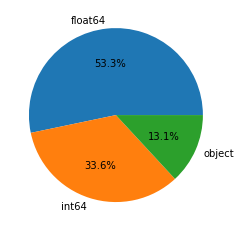

In [16]:
# Types des variables
outils_data.get_types_variables(application_train, True, True, True)

In [12]:
# Résumé des variables
desc_appli_train = outils_data.description_variables(application_train)
desc_appli_train

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
type,int64,int64,object,object,object,object,int64,float64,float64,float64,float64,object,object,object,object,object,float64,int64,int64,float64,int64,float64,int64,int64,int64,int64,int64,int64,object,float64,int64,int64,object,int64,int64,int64,int64,int64,int64,int64,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,object,object,float64,object,object,float64,float64,float64,float64,float64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,278.0,1292.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,202929.0,0.0,0.0,0.0,0.0,0.0,0.0,96391.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,173378.0,660.0,60965.0,156061.0,179943.0,150007.0,204488.0,214865.0,163891.0,154828.0,153020.0,208642.0,182590.0,210199.0,154350.0,213514.0,169682.0,156061.0,179943.0,150007.0,204488.0,214865.0,163891.0,154828.0,153020.0,208642.0,182590.0,210199.0,154350.0,213514.0,169682.0,156061.0,179943.0,150007.0,204488.0,214865.0,163891.0,154828.0,153020.0,208642.0,182590.0,210199.0,154350.0,213514.0,169682.0,210295.0,154297.0,148431.0,156341.0,145755.0,1021.0,1021.0,1021.0,1021.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,41519.0,41519.0,41519.0,41519.0,41519.0,41519.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0007,0.0034,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5409,0.0,0.0,0.0,0.0,0.0,

**Bilan** :
***
- Le fichier application_train.csv contient environ **307000 enregistrements** et **122 variables**. 
- Ces variables contiennent les **statistiques personnelles d'un demandeur particulier**, telles que son âge, ses revenus, le type de prêt, les statistiques de son appartement, etc.
- Il y a **307000 SK_ID_CURR uniques** qui représentent des demandes de prêt uniques.
- Le champ **TARGET** représente le **statut de défaut de paiement du prêt** :
    - 0 pour non défaillant,
    - et 1 pour défaillant.

<span style='background:PaleGreen'>**Valeurs manquantes**</span>

Valeurs manquantes :9152465 NaN pour 37516342 données (24.4 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
COMMONAREA_MEDI,214865,69.8700
COMMONAREA_AVG,214865,69.8700
COMMONAREA_MODE,214865,69.8700
NONLIVINGAPARTMENTS_MEDI,213514,69.4300
NONLIVINGAPARTMENTS_MODE,213514,69.4300
NONLIVINGAPARTMENTS_AVG,213514,69.4300
FONDKAPREMONT_MODE,210295,68.3900
LIVINGAPARTMENTS_MODE,210199,68.3500
LIVINGAPARTMENTS_MEDI,210199,68.3500
LIVINGAPARTMENTS_AVG,210199,68.3500


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


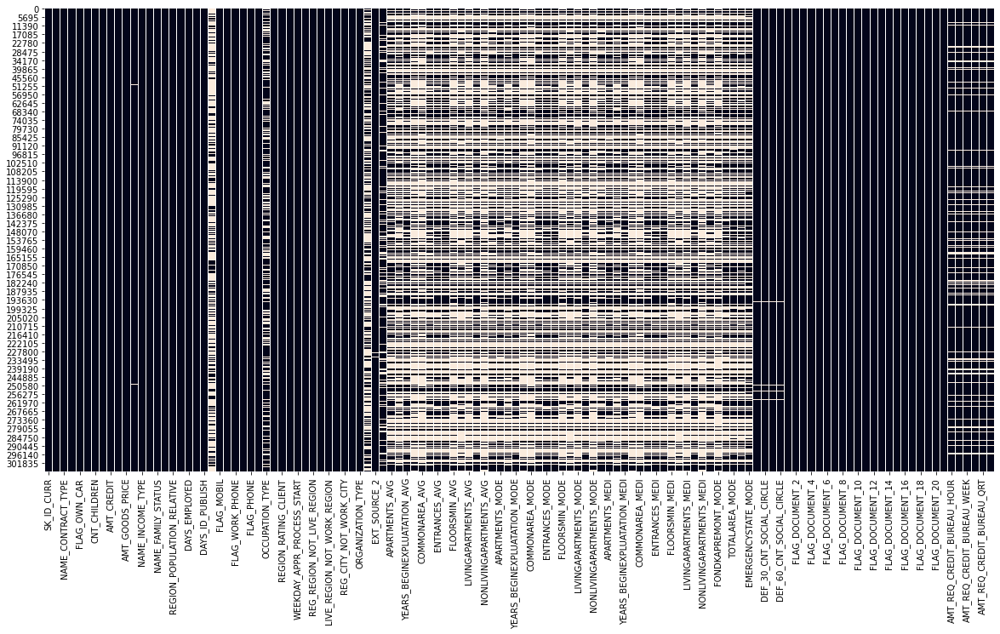

In [14]:
# Valeurs manquantes du dataframe
outils_data.get_missing_values(application_train, True, True)

Nombre de variables avec valeurs manquantes : 67


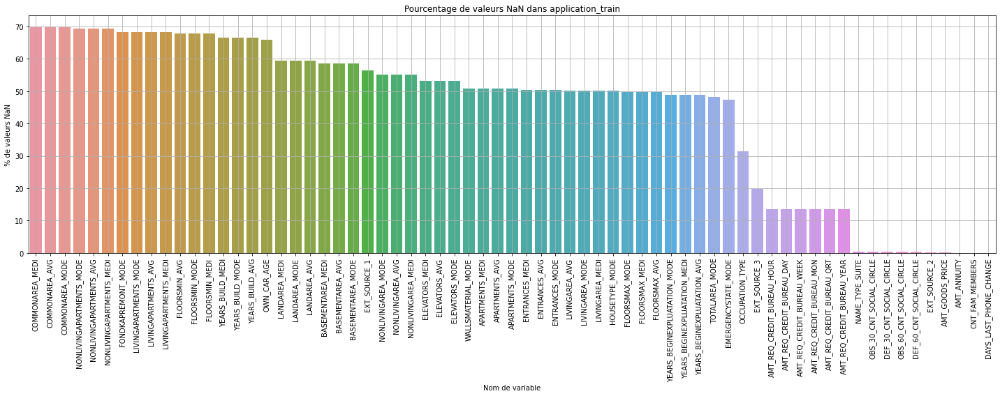

In [18]:
# Réprésentation visuelle des valeurs manquantes
df_nan = eda_kernel_fonctions.nan_df_create(application_train)
eda_kernel_fonctions.plot_nan_percent(df_nan, 'application_train',
                                      grid=True)

**Bilan** :
***
- On peut voir sur le graphique ci-dessus que 67 variables sur 122 contiennent des valeurs manquantes. 
- S'il n'y avait qu'une ou deux colonnes contenant des valeurs manquantes, nous aurions pu nous en sortir en éliminant simplement ces variables, mais pour un si grand nombre de colonnes, nous ne pouvons pas les éliminer telles quelles, car la perte d'information pourrait être très élevée.
- Nous voyons que certaines variables comme celles relatives à "COMMONAREA", "NONLIVINGAPARTMENT", etc. ont près de 70% de valeurs manquantes. Nous devrions trouver des techniques pour gérer ces nombreuses valeurs manquantes et voir ce qui fonctionne le mieux pour nos données.
- Une autre chose à noter ici est que la plupart des variables qui ont plus de 50% de valeurs manquantes sont liées aux statistiques sur les appartements de l'emprunteur. Il est très probable que ces valeurs n'aient pas été enregistrées lors de la saisie des données et qu'elles soient facultatives.

#### <span style='background:Moccasin'>2.2.2. Analyse exploratoire univariée</span>

<span style='background:PaleGreen'>**Distribution de la TARGET**</span>

- Variable cible :
    - 1 : demandeur ayant des difficultés de paiement : il/elle a eu un retard de paiement de plus de X jours sur au moins une des Y premières échéances du prêt dans notre échantillon
    - 0 : tous les autres cas.)
- En résumé :
    - **0** : non-défaillant,
    - **1** : défaillant.

In [36]:
target_distribution = application_train.TARGET.value_counts()
labels = ['Non-Defaulter', 'Defaulter']
colors = ["#82E0AA", "#EC7063"]

fig = go.Figure(data=[go.Pie(values=target_distribution, labels=labels,
                             textinfo='percent', pull=[0, 0.04],
                             marker=dict(colors=colors))],
                layout=go.Layout(title='Distribution de la TARGET'))

fig.show()

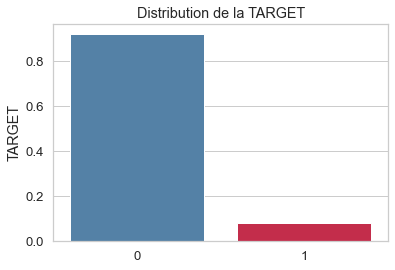

In [49]:
# Distribution de la Target
sns.barplot(x=[0, 1],
            y=application_train['TARGET'].value_counts(normalize=True),
            palette=['SteelBlue', 'crimson'])
plt.title('Distribution de la TARGET')
plt.show()

**Bilan** :
***
- D'après la **distribution de la variable cible** une chose que nous pouvons rapidement remarquer est le **déséquilibre des données**. 
- Il n'y a que 8,07% du total des prêts qui ont été mis en défaut. Cela signifie que les **défaillants** constituent la **classe minoritaire**.
- D'un autre côté, il y a 91,9% de prêts qui n'ont pas été en défaut. Ainsi, les **Non-Défaillants** seront notre **classe majoritaire**.
- Les défaillants se sont vus attribuer une variable cible de 1 et les non-défaillants une variable cible de 0.
- Pour les ensembles de données déséquilibrés, lors de la construction du **modèle**, nous ne pouvons **pas alimenter les données telles quelles à certains algorithmes**, qui sont **sensibles au déséquilibre**.
- Il en va de même pour les mesures de performance. Pour un tel jeu de données, la **précision** n'est généralement **pas la bonne mesure**, car elle est généralement **biaisée en faveur de la classe majoritaire**. Nous pouvons **utiliser d'autres métriques** telles que le **score ROC-AUC**, la **perte logarithmique**, le **score F1**, **la matrice de confusion** pour une meilleure évaluation du modèle.
- Une autre chose importante à noter ici est qu'il y a très peu de personnes qui font réellement défaut, et elles ont tendance à montrer une sorte de comportement différent. Ainsi, dans de tels cas de détection de fraude, de défaut de paiement et de détection d'anomalie, nous devons également nous concentrer sur les **valeurs aberrantes**, et nous ne pouvons **pas les supprimer**, car elles pourraient être le **facteur de différenciation entre les personnes en défaut de paiement et celles qui ne le sont pas**.

***
<span style='background:Plum'>**Distribution des variables catégorielles**</span>
***

In [7]:
# Liste des variables qualitatives
cols_cat = \
    application_train.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

<span style='background:PaleGreen'>**Variable NAME_CONTRACT_TYPE**</span>

- Cette variable contient des informations sur le type de prêt pour le demandeur donné :
    - prêt cash,
    - ou prêt revolving. 
- Selon la documentation fournie par Home Credit, il existe deux types de prêts, à savoir les prêts renouvelables et les prêts en espèces.

In [24]:
# Let us first see the unique categories of 'NAME_CONTRACT_TYPE'
eda_kernel_fonctions.print_unique_categories(application_train,
                                             'NAME_CONTRACT_TYPE')

# Plotting the Pie Plot for the column
eda_kernel_fonctions.plot_categorical_variables_pie(application_train,
                                                    'NAME_CONTRACT_TYPE',
                                                    hole=0.5)
# Note : en survol sur la répartition des défaillants seuls : 
# c'est le pourcentage des défaillants par catégorie sur le nombre total
# de cette catégorie.

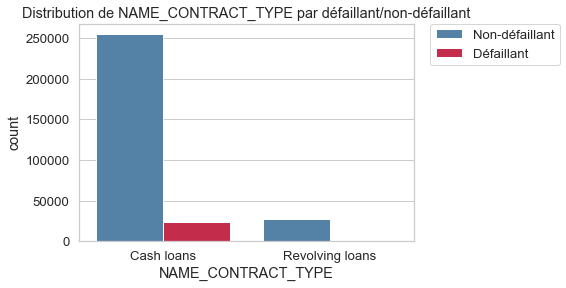

In [62]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'NAME_CONTRACT_TYPE')

**Bilan** :
***
A partir du graphique ci-dessus, nous pouvons tirer les observations et conclusions suivantes :
- A partir du premier sous-graphe, c'est-à-dire la distribution globale : 
    - On peut voir que la plupart des prêts que les demandeurs prennent sont des prêts cash. 
    - Seulement 9,52% des personnes ont contracté des prêts revolving.
- Dans le deuxième sous-graphe, c'est-à-dire le pourcentage de défaillants :
    - Nous voyons qu'il y a un plus grand pourcentage de personnes qui ont fait défaut de paiement avec des prêts cash (8,35%) par rapport aux personnes qui ont fait défaut de paiement  avec des prêts revolving (5,48%).

<span style='background:PaleGreen'>**Variable CODE_GENDER**</span>

- Cette variable contient des informations sur le sexe du client/demandeur :
    - **F** pour **Féminin**,
    - **M** pour **Masculin**. 

In [13]:
# Let us first see the unique categories of 'CODE_GENDER'
eda_kernel_fonctions.print_unique_categories(application_train,
                                             'CODE_GENDER',
                                             show_counts=True)

# Plotting the Pie Plot for the Column
eda_kernel_fonctions.plot_categorical_variables_pie(application_train,
                                                    'CODE_GENDER',
                                                    hole=0.5)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'CODE_GENDER' sont :
['M' 'F' 'XNA']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64
-------------------------------------------------------------------------------


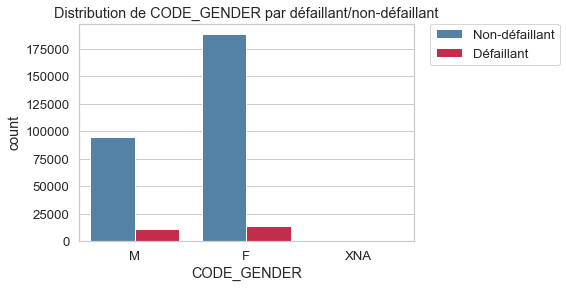

In [63]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'CODE_GENDER')

**Bilan** :
***
La distribution de la variable CODE_GENDER semble intéressante. 

Voici quelques points de discussion :

- 1. Le premier point à observer est qu'il y a 4 lignes dans la table application_train qui ont des genres 'XNA', ce qui n'a pas beaucoup de sens, et peut être compté comme des valeurs NaN. Puisqu'elles ne sont que 4 et qu'elles appartiennent à la catégorie des non-défaillants. Nous pouvons donc éliminer ces lignes sans trop d'hésitation.
- 2. Dans le sous-graphe 1, nous voyons que pour l'ensemble de données donné, il y a plus de candidats féminins (65,8%) que de candidats masculins (34,2%).
- 3. Cependant, contrairement au nombre de candidats féminins, le deuxième graphique montre que les candidats masculins ont tendance à être plus souvent défaillants (10,14%) que les candidats féminins (7%).

Ainsi, on peut dire que les hommes ont plus tendance à ne pas rembourser leurs dettes que les femmes, selon l'ensemble des données.

<span style='background:PaleGreen'>**Variable FLAG_EMP_PHONE**</span>

Cette variable est une variable booléenne, qui indique si le demandeur a fourni son numéro de téléphone professionnel ou non :
- **1** pour **Oui**, 
- et **0** signifie **Non**.

In [16]:
# Let us first see the unique categories of 'FLAG_EMP_PHONE'
eda_kernel_fonctions.print_unique_categories(application_train,
                                             'FLAG_EMP_PHONE')

# Plotting the Pie Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_pie(application_train,
                                   column_name='FLAG_EMP_PHONE',
                                   hole=0.5)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'FLAG_EMP_PHONE' sont :
[1 0]
-------------------------------------------------------------------------------


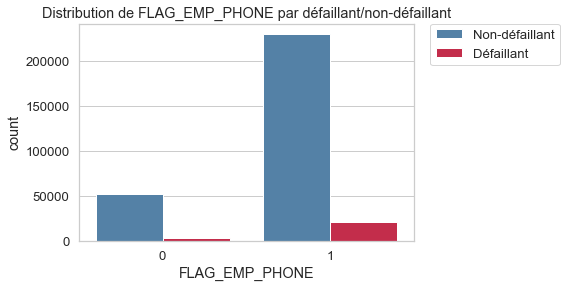

In [64]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_EMP_PHONE')

**Bilan** :
***
Cette variable contient deux catégories, à savoir si le demandeur a fourni ou non son numéro de téléphone professionnel lors du processus d'inscription/demande.

- Dans le premier sous-graphe, nous constatons que la plupart des demandeurs fournissent leur numéro de téléphone professionnel (82%) et que seulement 18% ne l'ont pas fourni.
- On peut également constater que la tendance des personnes en défaillance de paiement qui fournissent leur numéro de téléphone professionnel est plus importante que ceux qui ne sont pas défaillant. Cette caractéristique pourrait être attribuée au fait que les personnes en défaut de paiement fournissent leur numéro de téléphone professionnel afin de ne pas être dérangées sur leur téléphone personnel.

<span style='background:PaleGreen'>**Variable REGION_RATING_CLIENT_W_CITY**</span>

- Notre évaluation de la région où vit le demandeur en tenant compte de la ville (1 ou 2 ou 3).
- Cette variable correspond à la note attribuée par le Crédit immobilier à la région de chaque demandeur sur la base des enquêtes qu'il a pu réaliser. Cette notation tient également compte de la ville dans laquelle vit le demandeur.
- La prise en compte de la ville est importante, car même si certaines régions ont une bonne note dans une ville particulière, mais que cette ville n'a pas une note élevée, le demandeur se verra attribuer une note moyenne et non une note élevée.
- Les notes sont comprises entre 1 et 3.

In [78]:
# Let us first see the unique categories of 'REGION_RATING_CLIENT_W_CITY'
eda_kernel_fonctions.print_unique_categories(application_train,
                                             'REGION_RATING_CLIENT_W_CITY')

# Plotting the Pie Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_pie(application_train,
                                   column_name='REGION_RATING_CLIENT_W_CITY')

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'REGION_RATING_CLIENT_W_CITY' sont :
[2 1 3]
-------------------------------------------------------------------------------


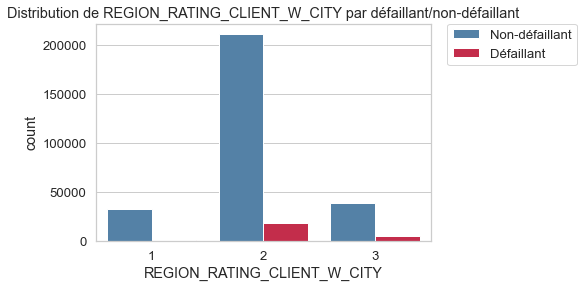

In [65]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'REGION_RATING_CLIENT_W_CITY')

**Bilan** :
***
Les graphiques ci-dessus nous permettent de tirer les conclusions suivantes :

- Dans le premier sous-graphe, nous constatons que :
    - la plupart des demandeur (74,6 %) ont un indice de région de 2. Il s'agit de la valeur moyenne qui correspond à la plupart des demandeurs.
    - très peu de demandeurs ont un classement régional de 1 (seulement 11,1%) et certains ont un classement de 3 (14,3%).
- Parmi les défaillants, on constate que :
    - la plupart d'entre eux ont un classement régional de 3 (11,4% cf survol sur le schéma, pourcentage parmi les notes de chaque catégorie), ce qui est comparativement plus élevé que les deux autres classements, c'est-à-dire que les demandeurs ayant un classement de 1 ont un pourcentage de défaillance de seulement 4,84% (cf survol) et ceux ayant un classement de 2 ont un pourcentage de 7,92% (cf survol).
    
Cela montre que la note 3 pourrait être un attribut important pour prendre une décision sur les caractéristiques de défaillance.

<span style='background:PaleGreen'>**Variable NAME_EDUCATION_TYPE**</span>

Cette variable décrit/énumére le niveau d'éducation le plus élevée obtenu par le demandeur.

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_EDUCATION_TYPE' sont :
['Secondary / secondary special' 'Higher education' 'Incomplete higher'
 'Lower secondary' 'Academic degree']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Secondary / secondary special    218391
Higher education                  74863
Incomplete higher                 10277
Lower secondary                    3816
Academic degree                     164
Name: NAME_EDUCATION_TYPE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_EDUCATION_TYPE = 5


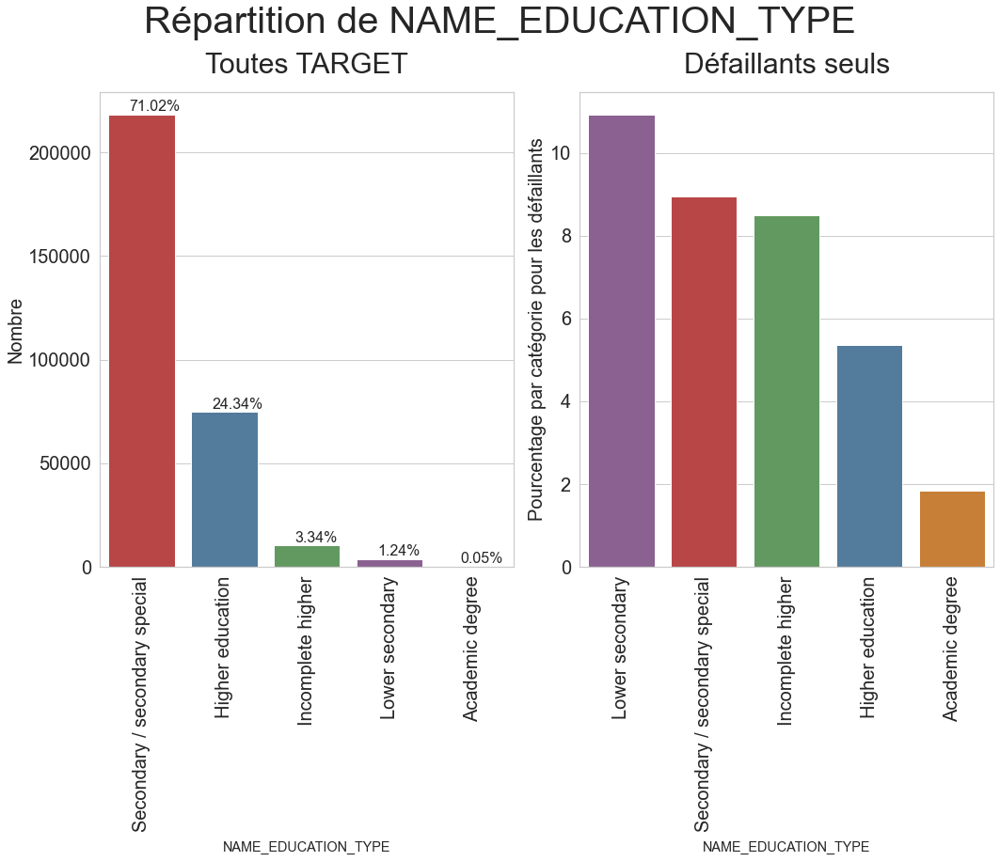

In [6]:
# Let us first see the unique categories of 'NAME_EDUCATION_TYPE'
eda_kernel_fonctions.print_unique_categories(application_train,
                                             'NAME_EDUCATION_TYPE',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='NAME_EDUCATION_TYPE',
                                   figsize=(15, 13), rotation=90,
                                   horizontal_adjust=0.25,
                                   fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20'],
                                   palette2=['#905998', '#cb3335',
                                             '#59a257', '#477ca8',
                                             '#df7f20'])

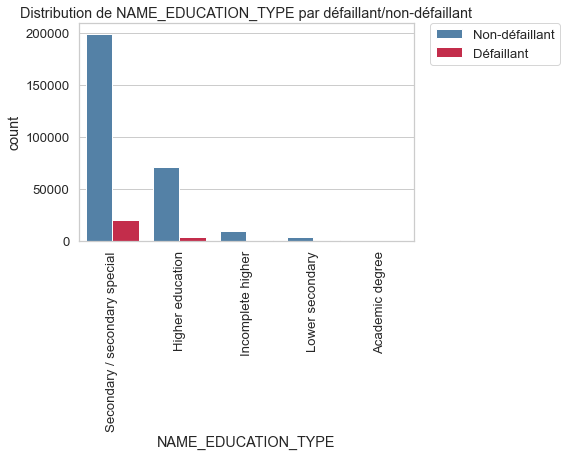

In [68]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'NAME_EDUCATION_TYPE',
                                              rotation=90)

**Bilan** :
***
En regardant les graphiques ci-dessus, nous pouvons conclure ce qui suit :

- Environ 71% des personnes n'ont fait que des études secondaires ou des études secondaires spéciales et 24,34% des demandeurs ont fait des études supérieures. Cela suggère que la plupart des demandeurs/emprunteurs n'ont pas un niveau d'éducation élevé.
- Le deuxième graphique montre que :
    - les personnes qui ont fait leurs études jusqu'au premier cycle du secondaire seulement, ont les taux de défaillance les plus élevés, les études dans le cycle secondaire et le dans le cycle supérieur incomplet ayant des tendances similaires.
    - Le groupe des personnes ayant fait des études supérieures a une tendance à la défaillance comparativement plus faible, ce qui est aussi logique.
    - De même, les personnes titulaires d'un diplôme universitaire présentent le taux de défaillance le plus faible. Cependant, le groupe des titulaires d'un diplôme universitaire est très peu nombreux, ce qui peut ne pas être très utile.

<span style='background:PaleGreen'>**Variable OCCUPATION_TYPE**</span>

- Cette variable indique la catégorie socio-professionnelle du demandeur. 
- Il peut s'agir d'une variable très importante qui pourrait décrire les variables de défaillance d'un demandeur. 

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'OCCUPATION_TYPE' sont :
['Laborers' 'Core staff' 'Accountants' 'Managers' nan 'Drivers'
 'Sales staff' 'Cleaning staff' 'Cooking staff' 'Private service staff'
 'Medicine staff' 'Security staff' 'High skill tech staff'
 'Waiters/barmen staff' 'Low-skill Laborers' 'Realty agents' 'Secretaries'
 'IT staff' 'HR staff']
-------------------------------------------------------------------------------
Nombre de catégories uniques pour OCCUPATION_TYPE = 19


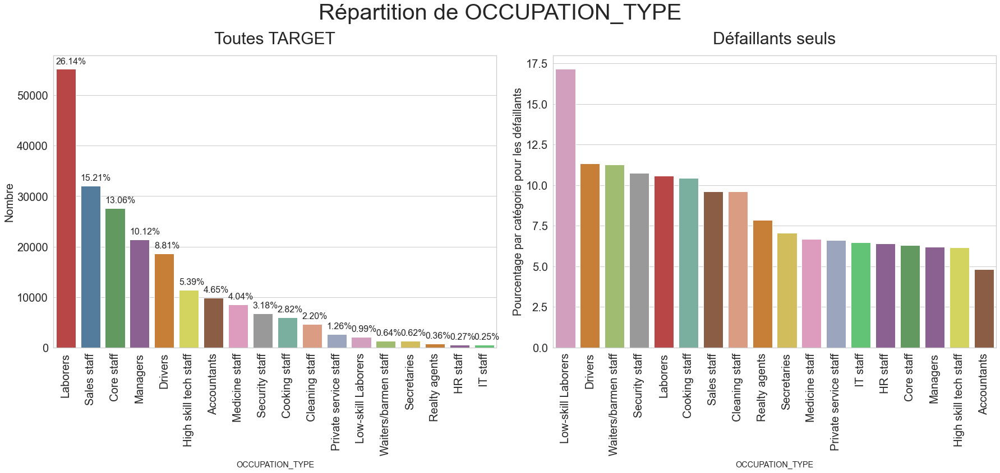

In [9]:
# Let us first see the unique categories of 'OCCUPATION_TYPE'
eda_kernel_fonctions.print_unique_categories(application_train,
                                             'OCCUPATION_TYPE')

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='OCCUPATION_TYPE',
                                   figsize=(25, 12), rotation=90,
                                   fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be',
                                             '#999999', '#72b6a1',
                                             '#e99675', '#95a3c3',
                                             '#db96c0', '#a2c865',
                                             '#e5c949', '#df7f20',
                                             '#905998', '#52d26c'],
                                   palette2=['#db96c0', '#df7f20',
                                             '#a2c865', '#999999',
                                             '#cb3335', '#72b6a1',
                                             '#965a38', '#e99675',
                                             '#df7f20', '#e5c949',
                                             '#e890be', '#95a3c3',
                                             '#52d26c', '#905998',
                                             '#59a257', '#905998',
                                             '#e6e64c', '#965a38'])

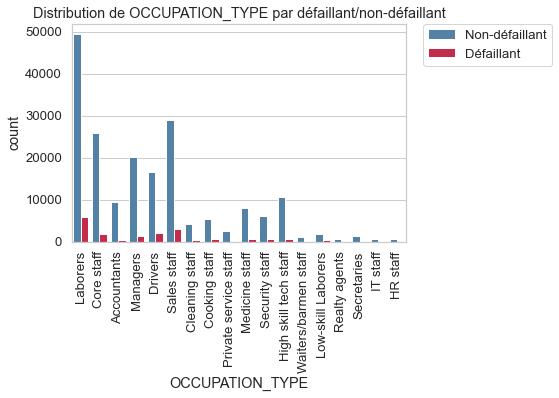

In [69]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'OCCUPATION_TYPE',
                                              rotation=90)

**Bilan** :
***
À partir des graphiques sur la catégorie socio-professionnelle, nous pouvons tirer les observations suivantes :

 - Parmi les demandeurs, la catégorie socio-professionnelle la plus courante est celle des ouvriers, qui représente près de 26 % des demandes. - La deuxième profession la plus fréquente est celle des responsables de vente, suivie par le personnel administratif publique et exécutif et les managers.
- Le taux de défaillance des travailleurs peu qualifiés est le plus élevé de tous les catégories (~17,5 %). Viennent ensuite les chauffeurs, les serveurs, le personnel de sécurité, les ouvriers, le personnel de cuisine, etc. Tous ces emplois sont des emplois de bas niveau. Cela montre que les personnes occupant des emplois de bas niveau ont tendance à avoir un taux de défaillance plus élevé.
- Le taux de défaillance le plus faible se trouve parmi les comptables, le personnel administratif et exécutif publique, les gestionnaires, le personnel technique hautement qualifié, le personnel des RH, etc. qui sont des emplois de niveau moyen à élevé.
- On peut donc conclure que les travailleurs des emplois de bas niveau ont tendance à avoir un taux de défaillance plus élevé que ceux des emplois de niveau moyen à élevé.

<span style='background:PaleGreen'>**Variable ORGANIZATION_TYPE**</span>

- Tout comme la catégorie socio-professionnelle, le secteur d'activité auquel le demandeur appartient pourrait également être une caractéristique importante pour prédire le risque de défaillance de ce demandeur.

Nombre de catégorie de la variable ORGANIZATION_TYPE = 58


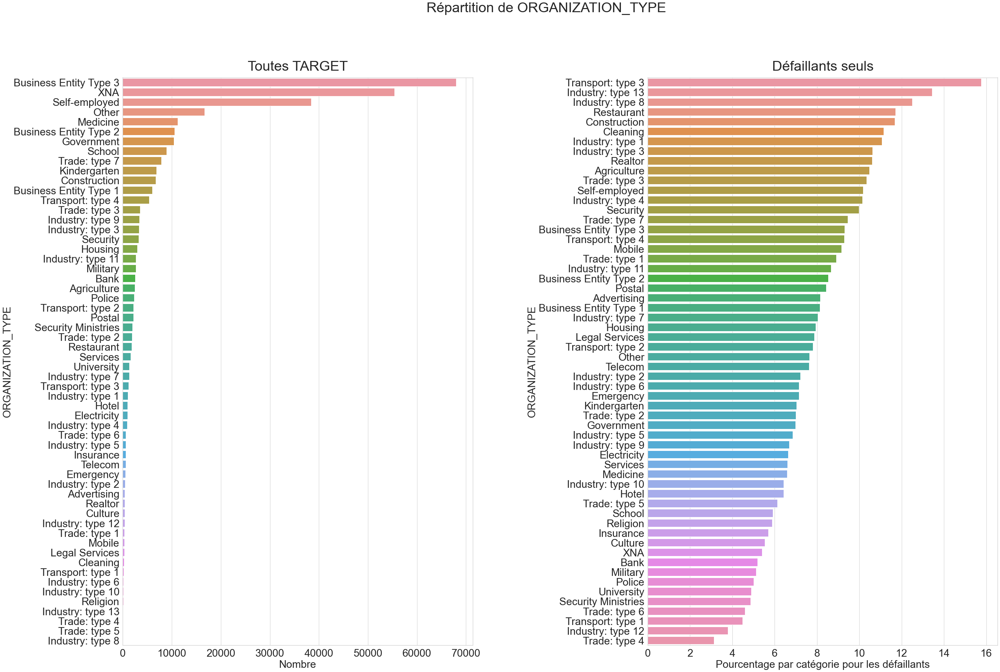

In [27]:
print(f"Nombre de catégorie de la variable ORGANIZATION_TYPE = \
{len(application_train.ORGANIZATION_TYPE.unique())}")

plt.figure(figsize=(45, 30))
sns.set(style='whitegrid', font_scale=1.2)
plt.subplots_adjust(wspace=0.5)

plt.subplot(1, 2, 1)
count_organization = application_train.ORGANIZATION_TYPE.value_counts() \
    .sort_values(ascending=False)
sns.barplot(x=count_organization, y=count_organization.index)
plt.title('Toutes TARGET', pad=20, fontsize=40)
plt.xlabel('Nombre', fontsize=30)
plt.ylabel('ORGANIZATION_TYPE', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.subplot(1, 2, 2)
percentage_default_per_organization = \
    application_train[application_train.TARGET == 1].ORGANIZATION_TYPE. \
    value_counts() * 100 / count_organization
percentage_default_per_organization = \
    percentage_default_per_organization.dropna(). \
    sort_values(ascending=False)
sns.barplot(x=percentage_default_per_organization,
            y=percentage_default_per_organization.index)
plt.title('Défaillants seuls', pad=20, fontsize=40)
plt.xlabel('Pourcentage par catégorie pour les défaillants', fontsize=30)
plt.ylabel('ORGANIZATION_TYPE', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.suptitle(f'Répartition de ORGANIZATION_TYPE', fontsize=40)
plt.show()

**Bilan** :
***
Le demandeur appartient à un grand nombre de types d'organisations, 58 pour être précis. 

Les graphiques ci-dessus donnent les observations suivantes :

- 1. Le premier graphique montre que la plupart des demandeurs travaillent dans des organisations de type "entité commercialy Type3", "XNA" ou "Travailleurs indépendants". Le type d'organisation "XNA" pourrait probablement désigner une organisation non classée en TYPE.
- 2. Dans le deuxième graphique, nous remarquons que les candidats appartenant à "Transport : type 3" ont la plus forte tendance à la défaillance par rapport aux autres. Ils sont suivis par les organisations de type : "Industrie : type 13", "Industrie : type 8", "Restaurant", "Construction"...
- Les organisations qui affichent les taux de défaillance les plus bas sont "Commerce : type 4", "Industrie : type 12"...

Ces numéros de type pourraient également en dire plus sur l'organisation, cependant, nous n'avons pas d'informations à ce sujet, donc nous nous en tiendrons à la dénomination qui nous a été fournie.

<span style='background:PaleGreen'>**Variables REG_CITY_NOT_LIVE_CITY - REG_CITY_NOT_WORK_CITY - LIVE_CITY_NOT_WORK_CITY**</span>

- **REG_CITY_NOT_LIVE_CITY** et **REG_CITY_NOT_WORK_CITY** : ces variables comprennent des indicateurs informant si l'adresse permanente du demandeur correspond ou non à son adresse de contact pour la demande de prêt ou à son adresse professionnelle au niveau de la région.
    - **1** pour des **adresses différentes**,
    - **0** pour des **adresses identiques**.    
- **LIVE_CITY_NOT_WORK_CITY** : cette variable indique si l'adresse permanente du demandeur correspond ou non à son adresse de contact donnée pour la demande de prêt au niveau de la ville.
    - **1** pour des **adresses différentes**,
    - **0** pour des **adresses identiques**.    

Nombre de catégories uniques pour REG_CITY_NOT_LIVE_CITY = 2


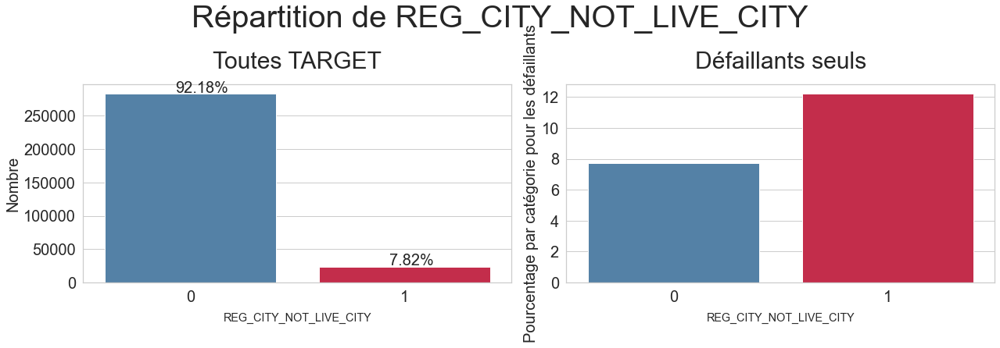

-------------------------------------------------------------------------------
Nombre de catégories uniques pour REG_CITY_NOT_WORK_CITY = 2


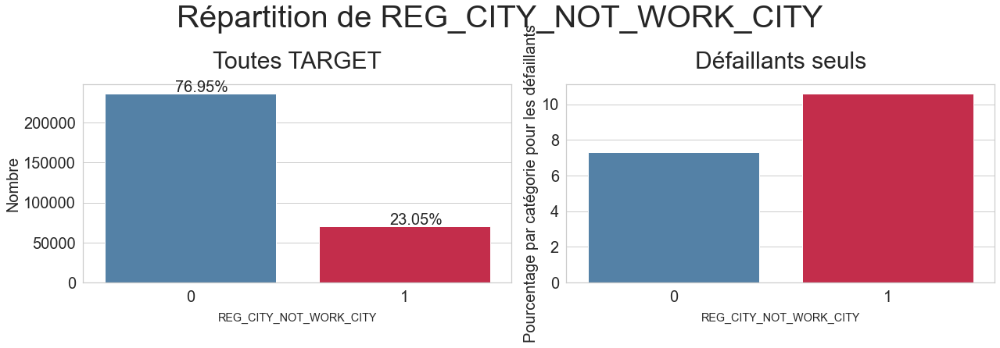

-------------------------------------------------------------------------------
Nombre de catégories uniques pour LIVE_CITY_NOT_WORK_CITY = 2


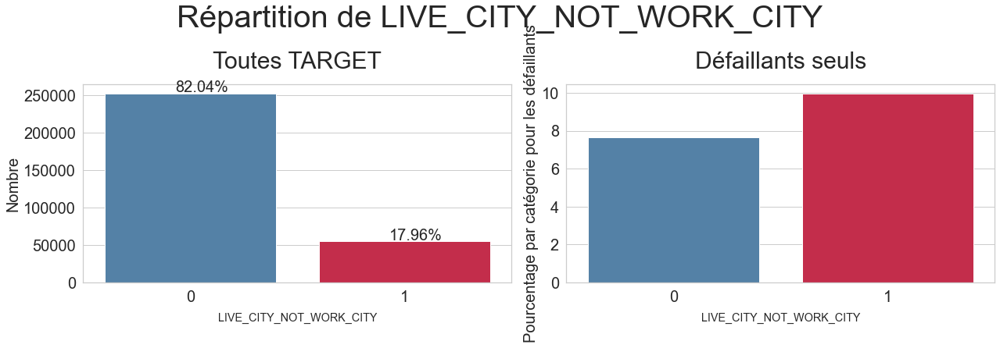

In [17]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='REG_CITY_NOT_LIVE_CITY',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])
print('-'*79)
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='REG_CITY_NOT_WORK_CITY',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])
print('-'*79)
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='LIVE_CITY_NOT_WORK_CITY',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

**Bilan** :
***
Les trois graphiques ci-dessus permettent de tirer les conclusions suivantes :

- 1.Parmi tous les demandeurs, il n'y a qu'une minorité de demandeurs dont les adresses ne correspondent pas.
    - Seulement 7,52% des personnes ont une adresse permanente différente de leur adresse de contact au niveau régional.
    - Environ 23,05% de personnes ont une adresse permanente différente de leur adresse professionnelle au niveau régional. Ce chiffre plus élevé s'explique par le fait qu'il est possible qu'elles travaillent dans une région différente de celle de leur adresse permanente.
    - Environ 17,96 % des personnes ont une adresse permanente différente de leur adresse de contact au niveau de la ville.
- 2. Si nous examinons les caractéristiques de défaillance, nous constatons que la tendance à la défaillance est maximale chez les personnes dont l'adresse permanente et l'adresse de contact sont différentes au niveau de la région, suivie de l'adresse permanente et de l'adresse de travail différentes et enfin de l'adresse permanente et de l'adresse de contact différentes au niveau de la ville.

Dans tous les cas, on constate que la tendance au défaut de paiement des personnes ayant des adresses différentes est plus élevée que celle des personnes ayant la même adresse. Cela signifie que quelque part, cette différence d'adresse peut suggérer un risque de défaillance.

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_3**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_3 = 2


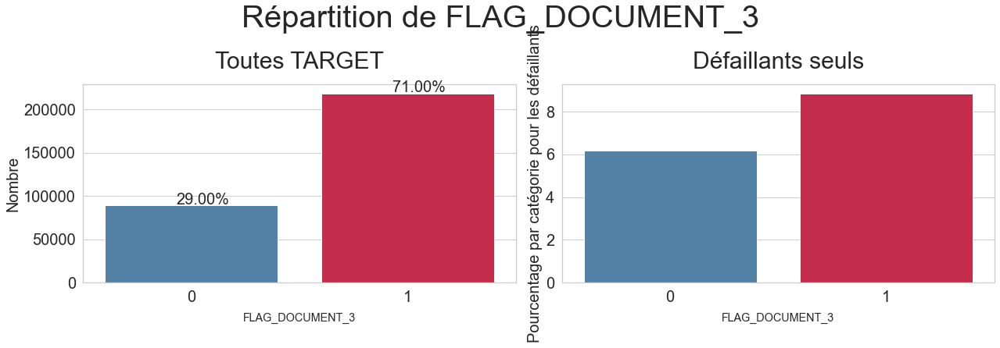

In [18]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_3',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [255]:
application_train[['FLAG_DOCUMENT_3', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_3  TARGET
1                0         199028
0                0          83658
1                1          19312
0                1           5513
dtype: int64

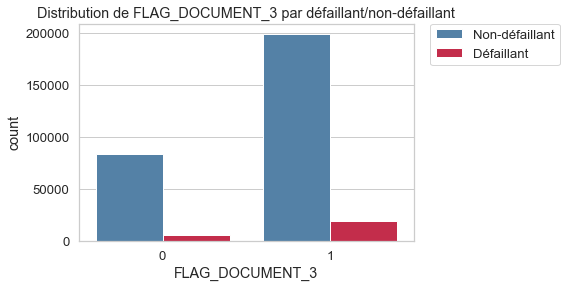

In [70]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_3')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la plupart des demandeurs n'ont pas fourni ce document (~71%) et que seulement 29% l'ont fait.
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni. Cela signifie que les demandeurs qui ont fourni le Document_3 ont tendance à manquer à leurs engagements plus que ceux qui ne l'ont pas fait.
- Il pourrait peut-être s'agir d'un certificat BPL ou autre, mais nous n'avons pas reçu cette information et nous ne pouvons donc rien dire sur le type de ce document.

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_2**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

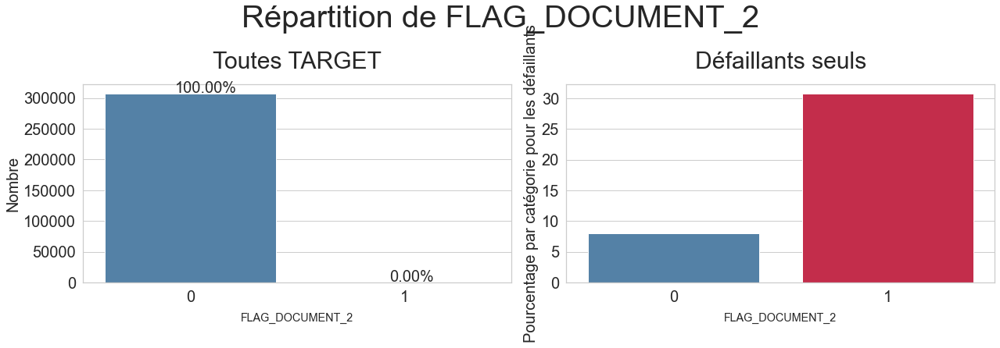

In [251]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_2',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [254]:
application_train[['FLAG_DOCUMENT_2', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_2  TARGET
0                0         282677
                 1          24821
1                0              9
                 1              4
dtype: int64

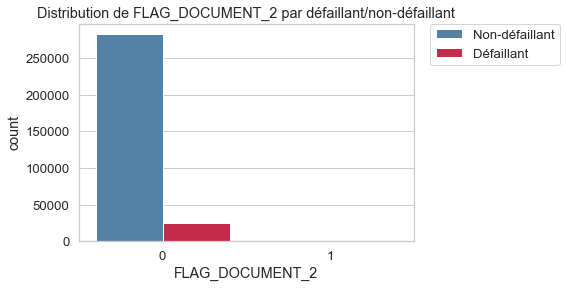

In [71]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_2')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (~100%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni. Cela signifie que les demandeurs qui n'ont pas fourni le Document_2 ont tendance à manquer à leurs engagements plus que ceux qui ne l'ont pas fait.

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_4**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

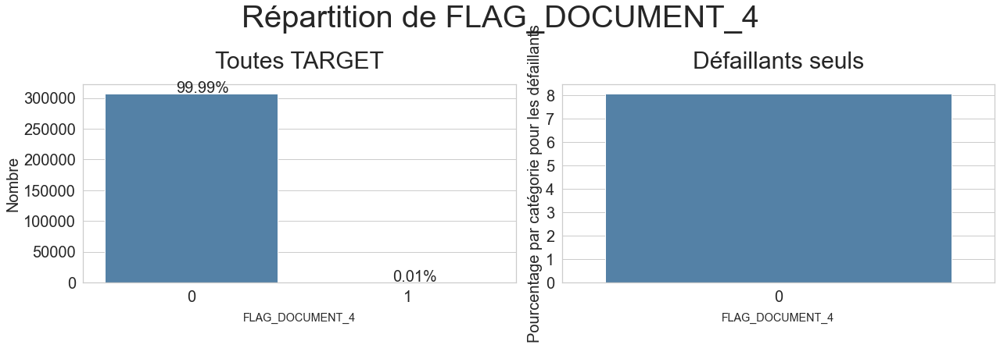

In [256]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_4',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [258]:
application_train[['FLAG_DOCUMENT_4', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_4  TARGET
0                0         282661
                 1          24825
1                0             25
dtype: int64

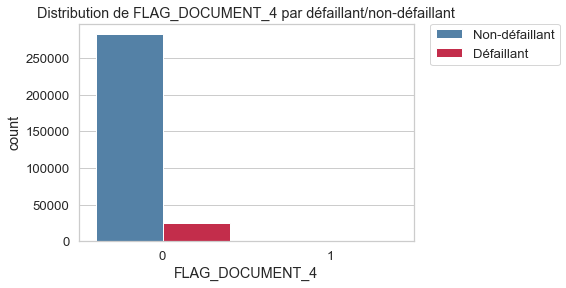

In [72]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_4')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (~100%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui n'ont pas fourni ce document ont un taux de défaillance moins élevé que ceux qui l'ont fourni.

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_5**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

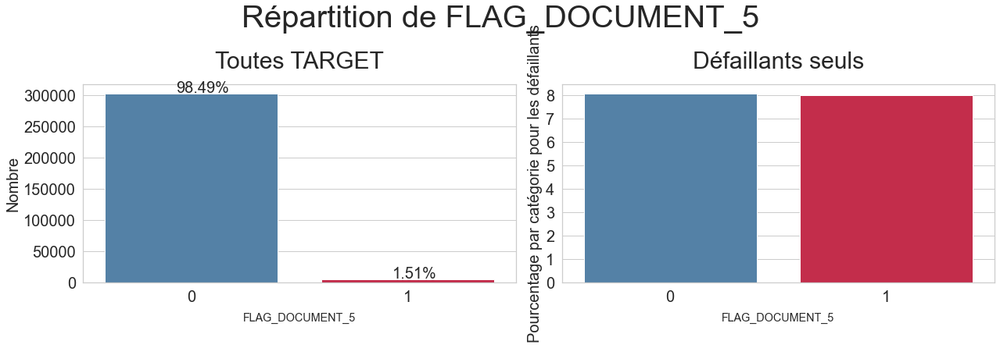

In [259]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_5',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [260]:
application_train[['FLAG_DOCUMENT_5', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_5  TARGET
0                0         278410
                 1          24453
1                0           4276
                 1            372
dtype: int64

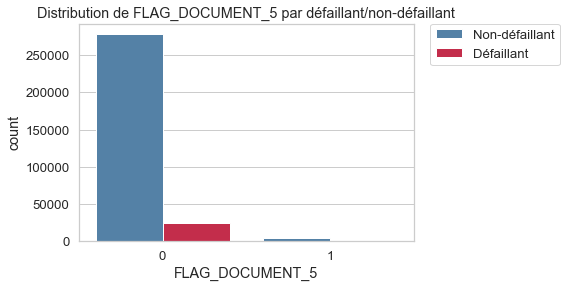

In [73]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_5')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (~98.5%).
- Dans le deuxième sous-graphe, nous constatons qu'il n'y a pas de différence entre ceux qui ont fourni ce document et ceux qui ne l'ont pas fourni.

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_6**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

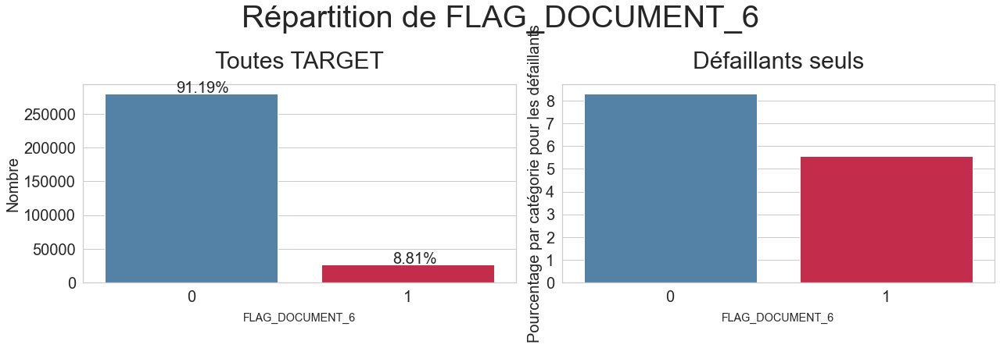

In [261]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_6',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [262]:
application_train[['FLAG_DOCUMENT_6', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_6  TARGET
0                0         257115
1                0          25571
0                1          23318
1                1           1507
dtype: int64

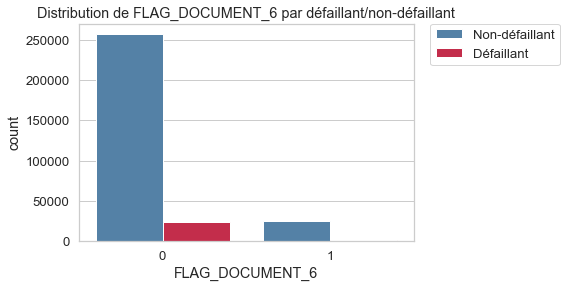

In [74]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_6')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (~91%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_7**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

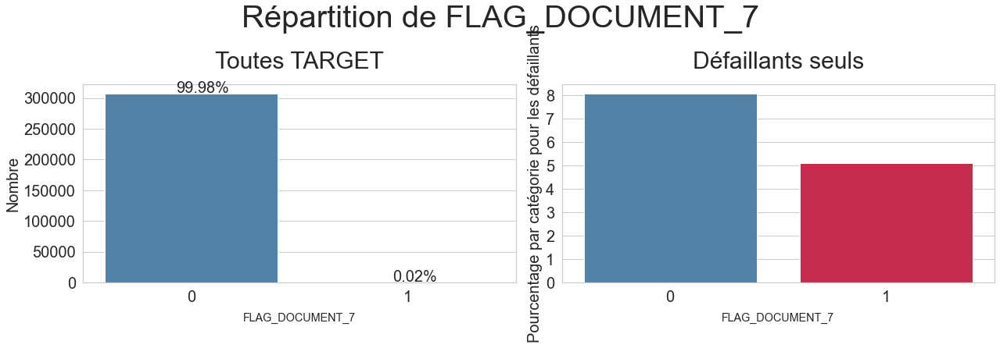

In [265]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_7',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [264]:
application_train[['FLAG_DOCUMENT_7', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_7  TARGET
0                0         282630
                 1          24822
1                0             56
                 1              3
dtype: int64

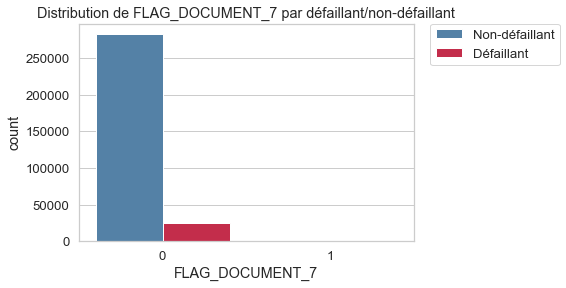

In [75]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_7')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_8**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

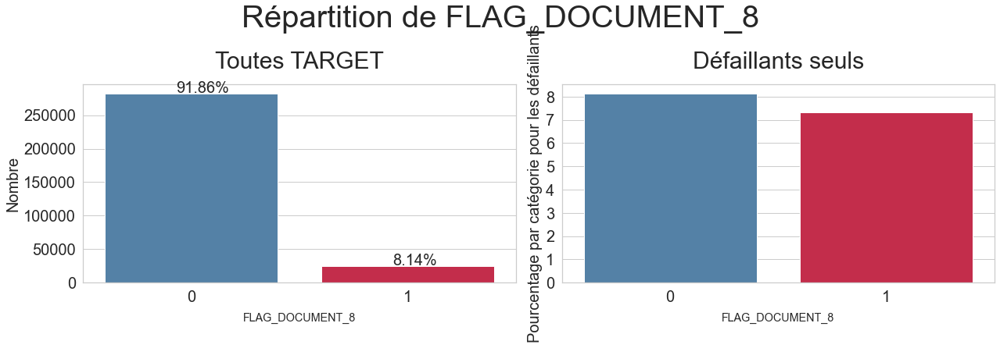

In [266]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_8',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [267]:
application_train[['FLAG_DOCUMENT_8', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_8  TARGET
0                0         259498
1                0          23188
0                1          22989
1                1           1836
dtype: int64

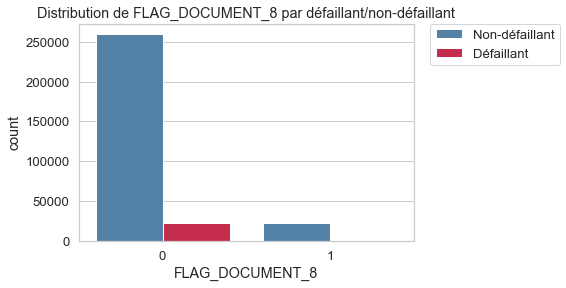

In [76]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_8')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (~92%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance légèrement plus élevé que ceux qui ne l'ont pas fourni.

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_9**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

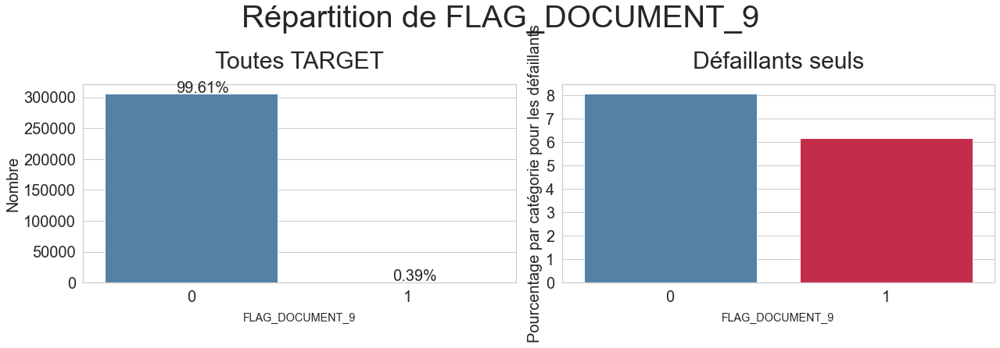

In [268]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_9',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [264]:
application_train[['FLAG_DOCUMENT_7', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_7  TARGET
0                0         282630
                 1          24822
1                0             56
                 1              3
dtype: int64

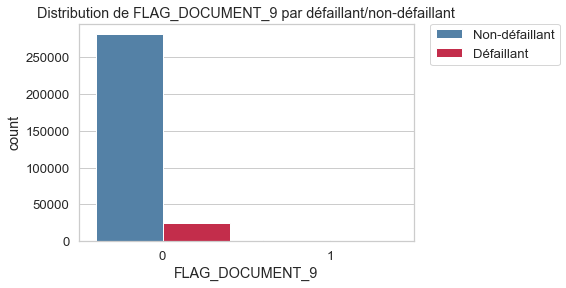

In [77]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_9')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_10**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

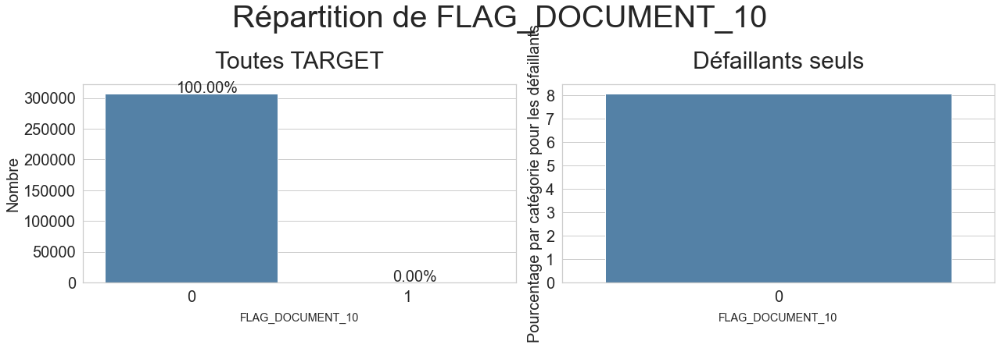

In [269]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_10',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [270]:
application_train[['FLAG_DOCUMENT_10', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_10  TARGET
0                 0         282679
                  1          24825
1                 0              7
dtype: int64

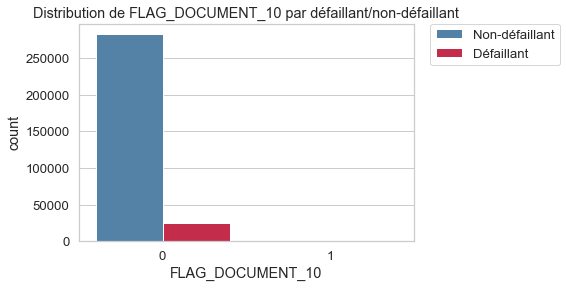

In [78]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_10')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (~100%).

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_11**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

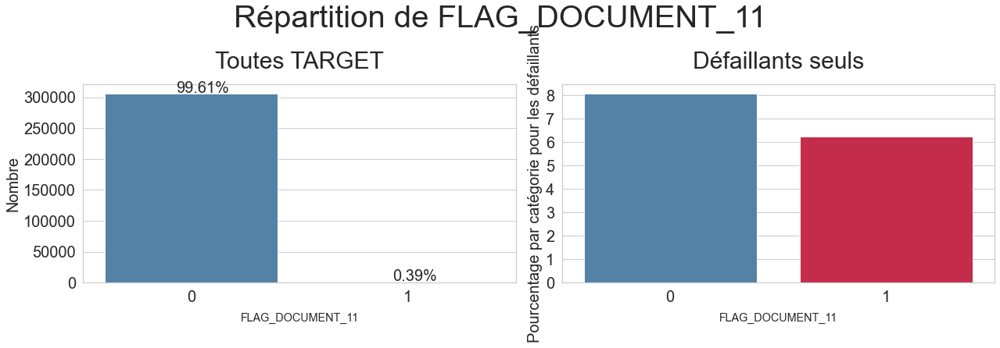

In [271]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_11',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [272]:
application_train[['FLAG_DOCUMENT_11', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_11  TARGET
0                 0         281558
                  1          24750
1                 0           1128
                  1             75
dtype: int64

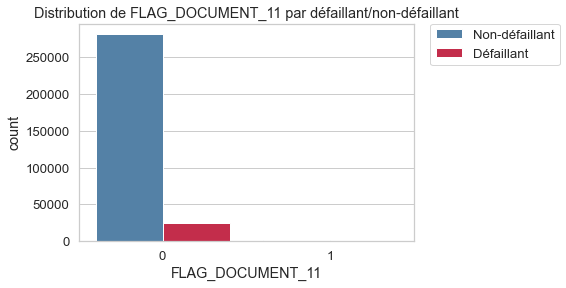

In [79]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_11')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_12**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

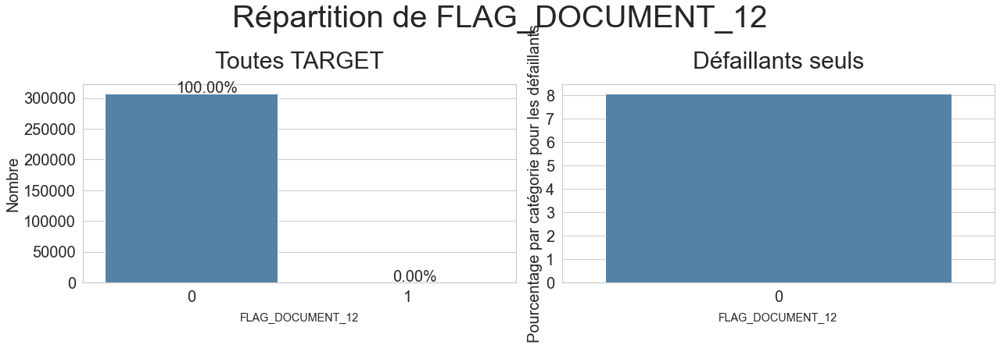

In [273]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_12',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [274]:
application_train[['FLAG_DOCUMENT_12', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_12  TARGET
0                 0         282684
                  1          24825
1                 0              2
dtype: int64

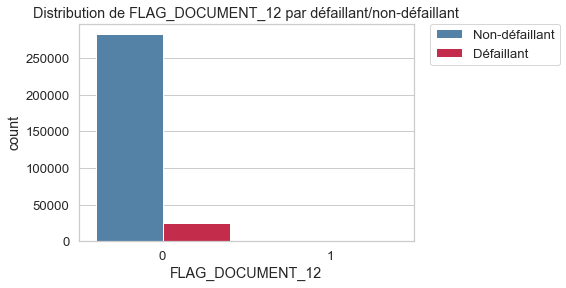

In [80]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_12')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (~100%).

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_13**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

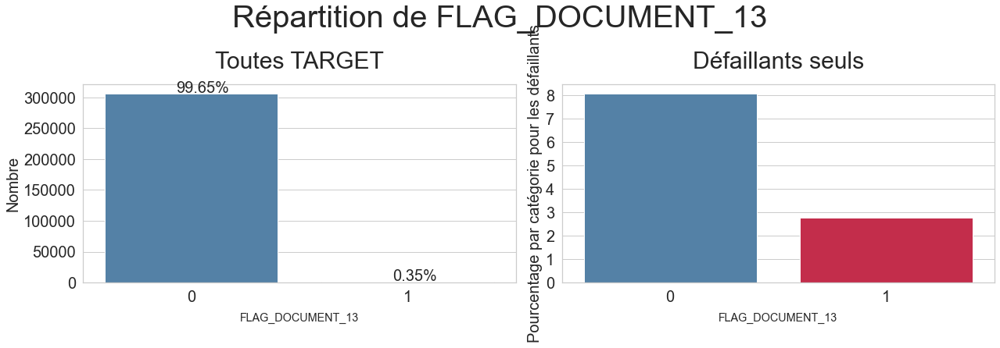

In [275]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_13',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [276]:
application_train[['FLAG_DOCUMENT_13', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_13  TARGET
0                 0         281632
                  1          24795
1                 0           1054
                  1             30
dtype: int64

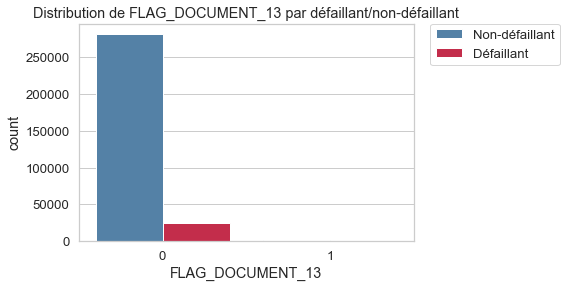

In [81]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_13')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_14**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

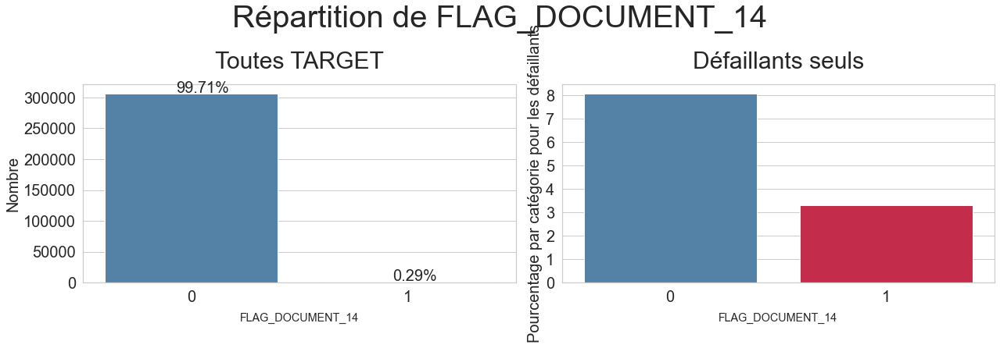

In [277]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_14',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [278]:
application_train[['FLAG_DOCUMENT_14', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_14  TARGET
0                 0         281813
                  1          24795
1                 0            873
                  1             30
dtype: int64

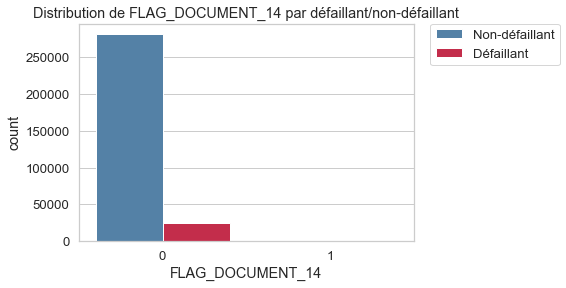

In [83]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_14')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_15**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

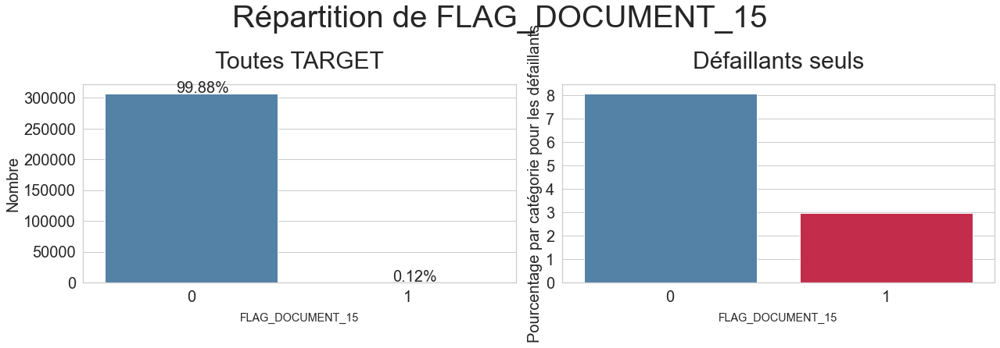

In [279]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_15',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [280]:
application_train[['FLAG_DOCUMENT_15', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_15  TARGET
0                 0         282325
                  1          24814
1                 0            361
                  1             11
dtype: int64

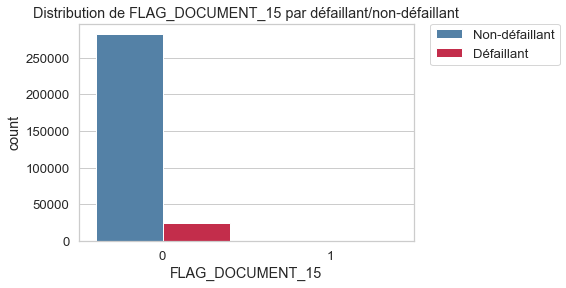

In [84]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_15')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_16**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

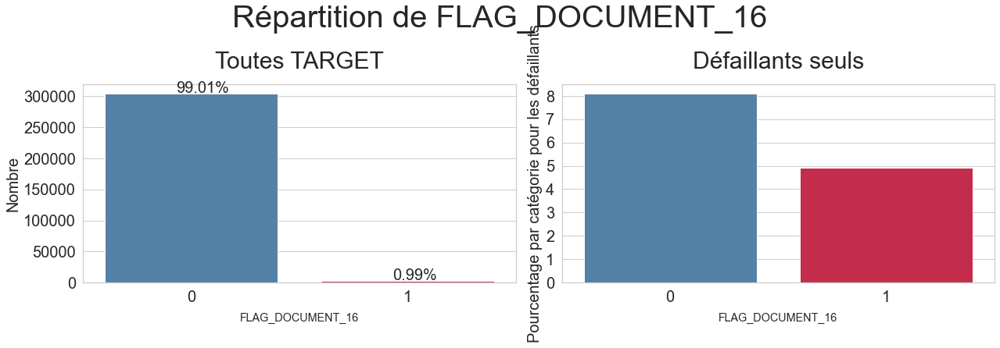

In [281]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_16',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [282]:
application_train[['FLAG_DOCUMENT_16', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_16  TARGET
0                 0         279783
                  1          24675
1                 0           2903
                  1            150
dtype: int64

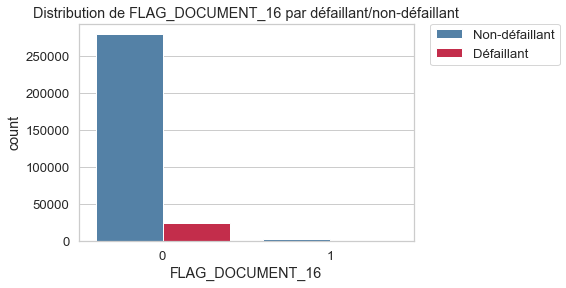

In [85]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_16')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_17**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

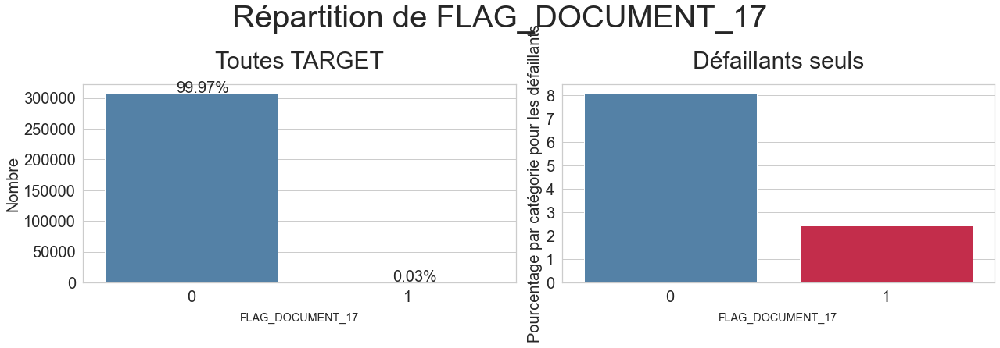

In [283]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_17',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [284]:
application_train[['FLAG_DOCUMENT_17', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_17  TARGET
0                 0         282606
                  1          24823
1                 0             80
                  1              2
dtype: int64

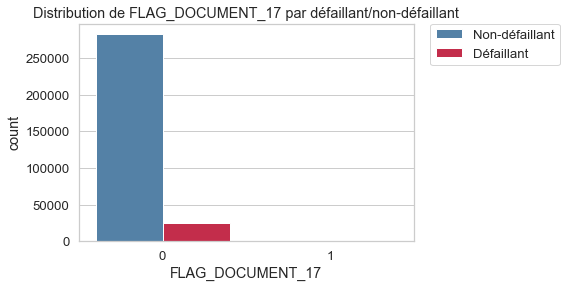

In [86]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_17')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_18**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

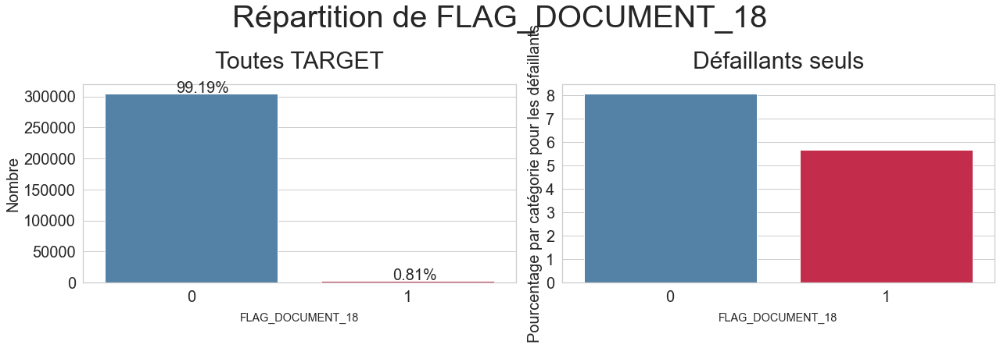

In [285]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_18',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [286]:
application_train[['FLAG_DOCUMENT_18', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_18  TARGET
0                 0         280328
                  1          24683
1                 0           2358
                  1            142
dtype: int64

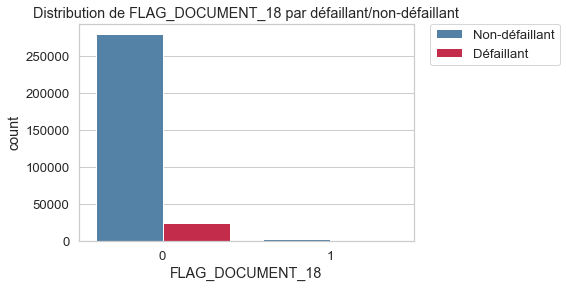

In [87]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_18')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_19**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

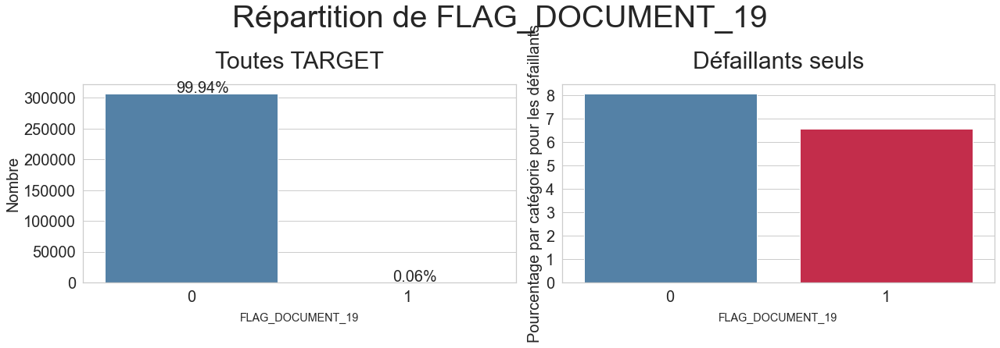

In [287]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_19',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [288]:
application_train[['FLAG_DOCUMENT_19', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_19  TARGET
0                 0         282515
                  1          24813
1                 0            171
                  1             12
dtype: int64

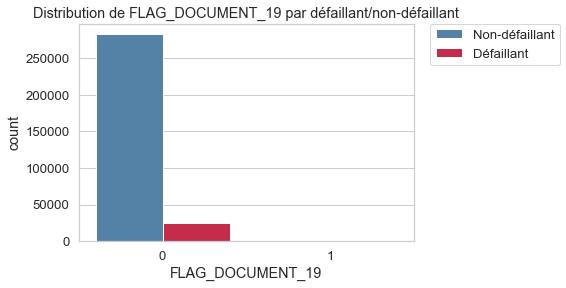

In [88]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_19')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_20**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

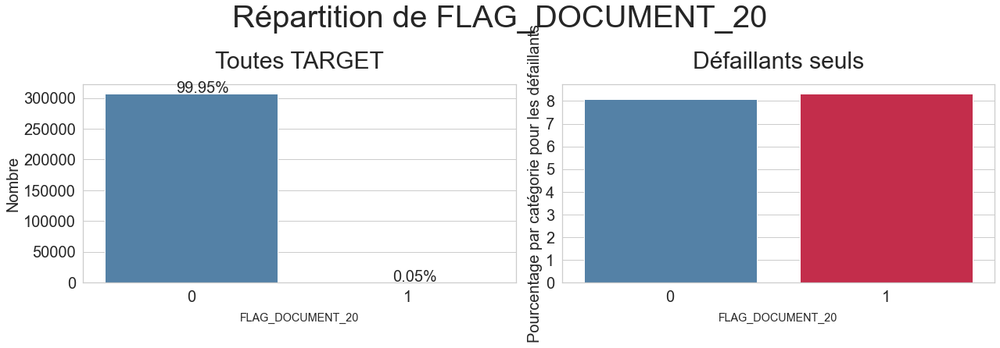

In [289]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_20',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [264]:
application_train[['FLAG_DOCUMENT_7', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_7  TARGET
0                0         282630
                 1          24822
1                0             56
                 1              3
dtype: int64

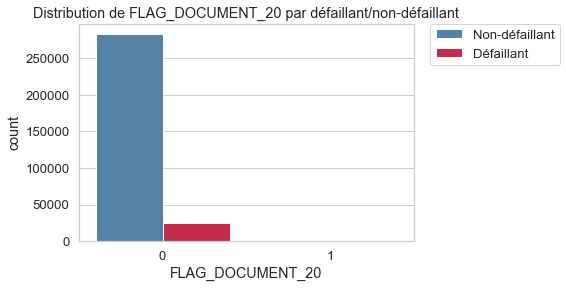

In [89]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_20')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance moins élevé que ceux qui ne l'ont pas fourni.

<span style='background:PaleGreen'>**Variable FLAG_DOCUMENT_21**</span>

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

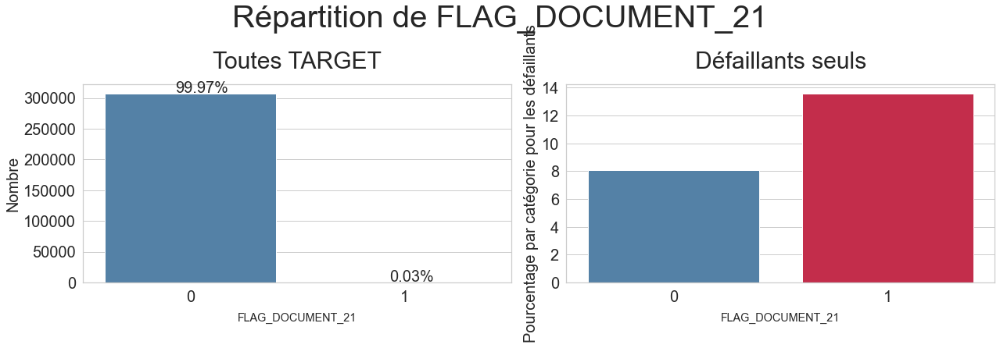

In [290]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_21',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [291]:
application_train[['FLAG_DOCUMENT_21', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_21  TARGET
0                 0         282597
                  1          24811
1                 0             89
                  1             14
dtype: int64

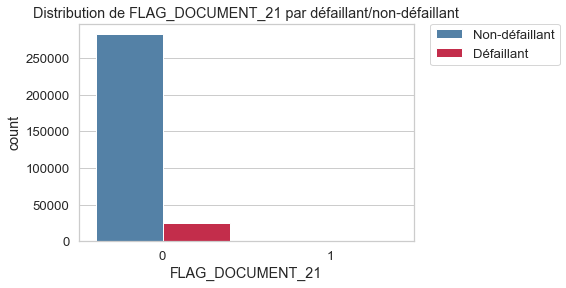

In [90]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_21')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

<span style='background:PaleGreen'>**Variable NAME_HOUSING_TYPE**</span>

Quelle est la situation du demandeur en matière de logement (location, logement chez les parents...) ?

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_HOUSING_TYPE' sont :
['House / apartment' 'Rented apartment' 'With parents'
 'Municipal apartment' 'Office apartment' 'Co-op apartment']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
House / apartment      272868
With parents            14840
Municipal apartment     11183
Rented apartment         4881
Office apartment         2617
Co-op apartment          1122
Name: NAME_HOUSING_TYPE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_HOUSING_TYPE = 6


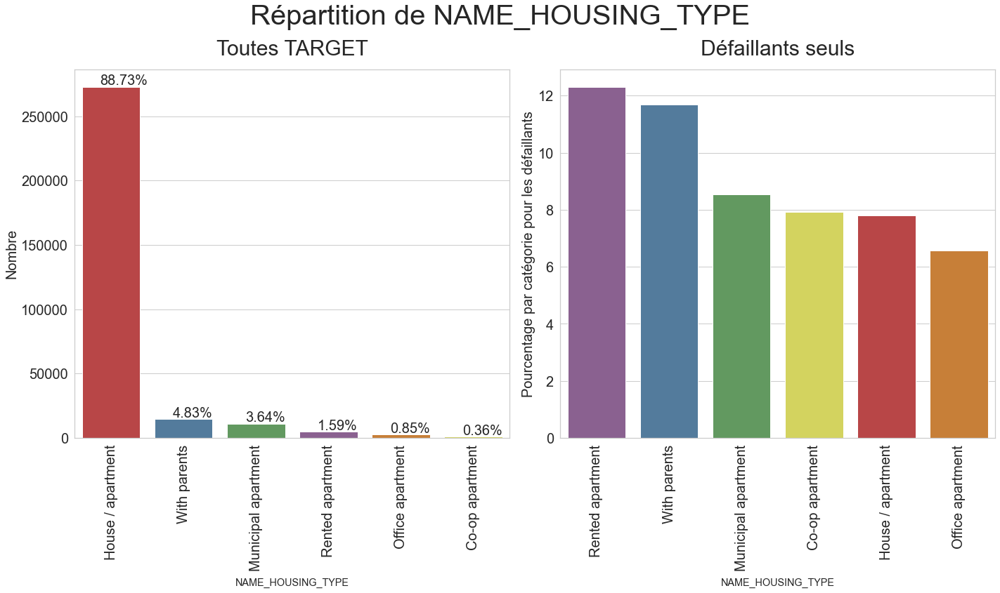

In [10]:
# Let us first see the unique categories of 'NAME_HOUSING_TYPE'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'NAME_HOUSING_TYPE',
                            show_counts=True)

# plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='NAME_HOUSING_TYPE',
                                   figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c'],
                                   palette2=['#905998', '#477ca8',
                                             '#59a257', '#e6e64c',
                                             '#cb3335', '#df7f20'])

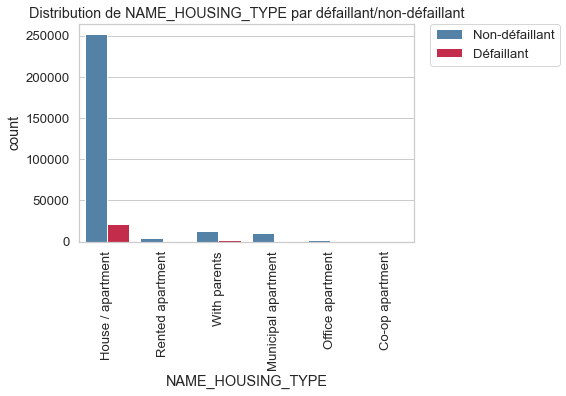

In [92]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'NAME_HOUSING_TYPE',
                                              rotation=90)

**Bilan** :
***
- Le premier graphique général montre :
    - que la majorité (89%)des demandeurs sont propriétaires d'une maison ou d'un appartement.
    - que 5% des demandeurs vivent chez leurs parents.
    - et les 5 autres pourcent concernent les appartements de location, municipaux ou les co-locations.
- Le second graphique, qui effectue un zoom sur les défaillants, montre que les personnes qui ont le taux de défaillance le plus élevé, font partie des 5% restant du graphique général : la majorité loue un appartement ou habitent chez leurs parents mais ne sont pas propriétaire.

La situation du logement du demandeur pourra donc avoir une influence sur la défaillance potentielle du demandeur.

<span style='background:PaleGreen'>**Variable NAME_FAMILY_STATUS**</span>

Cette variable indique la Situation familiale du demandeur (Célibataire, marié, pacsé, séparé, divorcé, veuf...).

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_FAMILY_STATUS' sont :
['Single / not married' 'Married' 'Civil marriage' 'Widow' 'Separated'
 'Unknown']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Married                 196432
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Unknown                      2
Name: NAME_FAMILY_STATUS, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_FAMILY_STATUS = 6


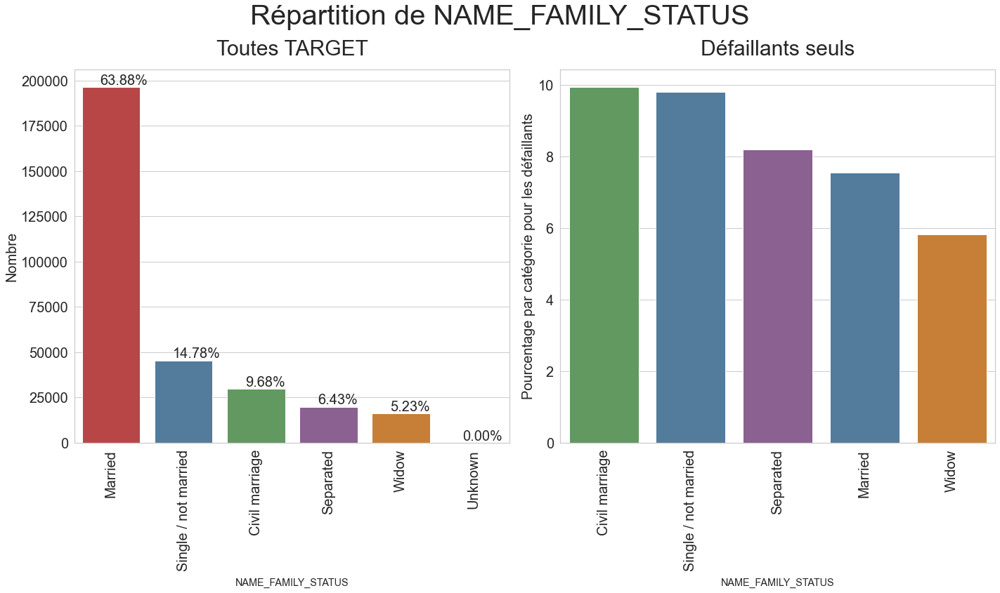

In [13]:
# Let us first see the unique categories of 'NAME_FAMILY_STATUS'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'NAME_FAMILY_STATUS',
                            show_counts=True)

# plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='NAME_FAMILY_STATUS',
                                   figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c'],
                                   palette2=['#59a257', '#477ca8',
                                             '#905998', '#477ca8',
                                             '#df7f20'])

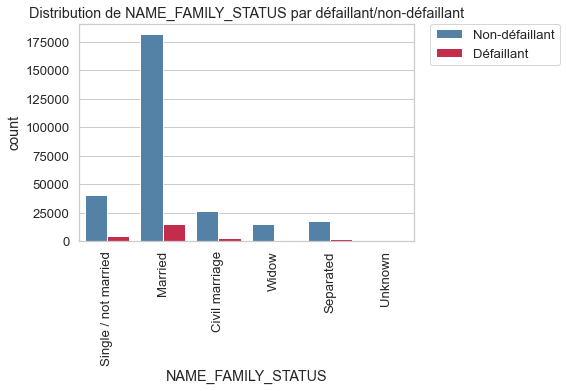

In [93]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'NAME_FAMILY_STATUS',
                                              rotation=90)

**Bilan** :
***
- Le premier graphique général montre que :
    - la majorité (74%) des demandeurs sont mariés (64% mariés religieusement, 10% mariés civilement).
    - près de 15% des demandeurs sont célibataires.
    - le reste est réparti entre les séparés (6.5%) et les veufs (%).
- Concernant les défaillants seuls, la règle du graphique général n'est pas respecté. Les demandeurs ayant les taux de défaillance le plus élevé sint mariés civilement ou célibataires (autour de 10%), puis suivent les séparés (8%), les mariés (7.5%) et les veufs (6%).

La situation familiale du demandeur pourra donc avoir une influence sur la défaillance du demandeur.

<span style='background:PaleGreen'>**Variable NAME_INCOME_TYPE**</span>

Cette variable représente le type des revenus des demandeurs (homme d'affaires, travailleur, congé de maternité...)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_INCOME_TYPE' sont :
['Working' 'State servant' 'Commercial associate' 'Pensioner' 'Unemployed'
 'Student' 'Businessman' 'Maternity leave']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Working                 158774
Commercial associate     71617
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_INCOME_TYPE = 8


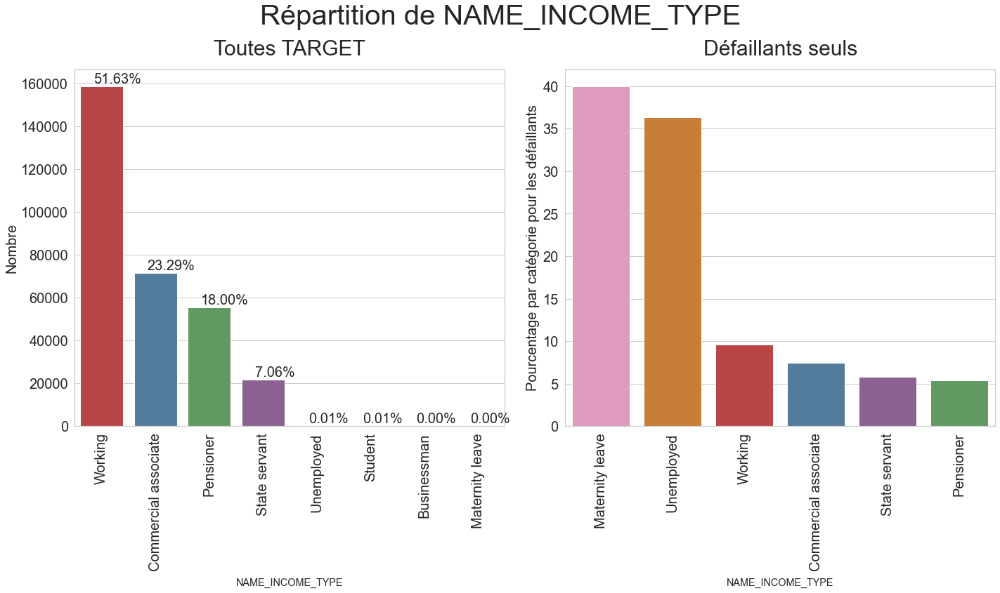

In [14]:
# Let us first see the unique categories of 'NAME_INCOME_TYPE'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'NAME_INCOME_TYPE',
                            show_counts=True)

# plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='NAME_INCOME_TYPE',
                                   figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be'],
                                   palette2=['#e890be', '#df7f20',
                                             '#cb3335', '#477ca8',
                                             '#905998', '#59a257'])

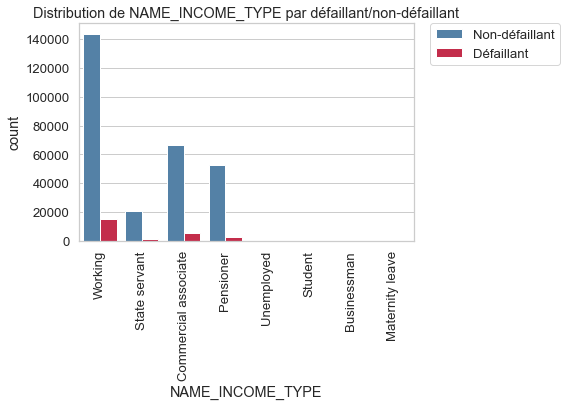

In [94]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'NAME_INCOME_TYPE',
                                              rotation=90)

**Bilan** :
***
- Le premier graphique général montre que :
    - la majorité des demandeurs sont des travailleurs (52%),
    - puis 23% de commerciaux, 18% de retraités et 7 % des vendeurs.
    - très peu de type de revenus passifs : non salariés, étudiants, hommes d'affaires et en congés de maternité : autour de 0%.
- Concernant les défaillants, les pourcentages du graphique général ne sont pas respectés :
    - la majorité des demandeurs ayant le taux de défaillance le plus élevé sont les catégories les plus rares du graphique général : les congés de maternité et les non salariés (près de 40%),
    - puis seulement 10% de la classe majoritaire des travailleurs 
    - et 5% de la classe des commerciaux.
    - Seulement 5% des 7% des retraités ne remboursent pas leurs dettes.

Le type de revenu du demandeur pourra donc avoir une influence sur la défaillance du demandeur.

<span style='background:PaleGreen'>**Variable FLAG_OWN_CAR**</span>

Cette variable contient l'indicateur (N ou Y) indiquant si le demandeur possède un véhicule ou non.
- **Y** : le demandeur possède une voiture, 
- et **N** : le demandeur ne possède pas de voiture.

Nombre de catégories uniques pour FLAG_OWN_CAR = 2


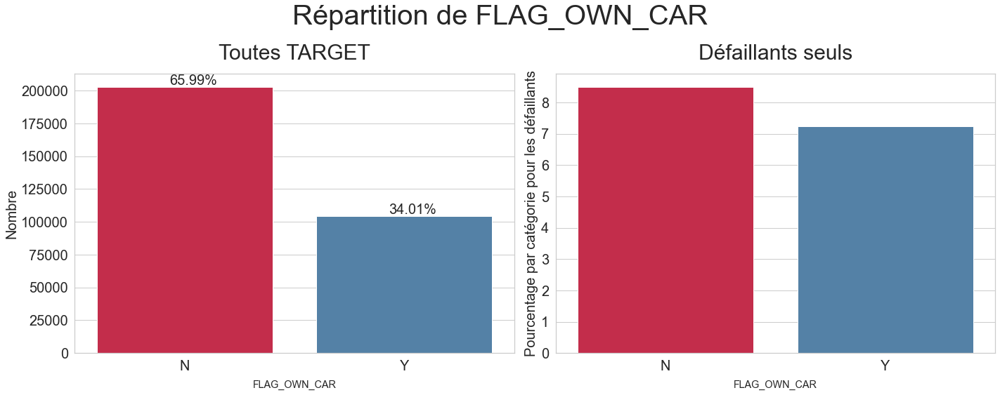

In [33]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_OWN_CAR',
    figsize=(20, 8), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['Crimson', 'SteelBlue'], palette2=['Crimson', 'SteelBlue'])

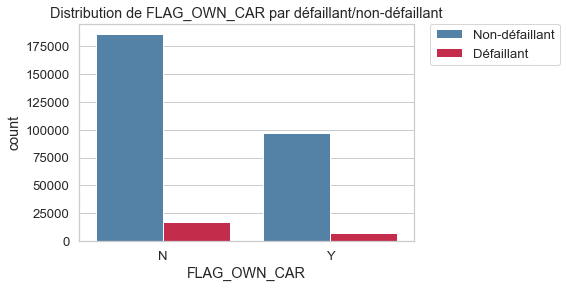

In [96]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_OWN_CAR')

**Bilan** :
***
- Seulement 34% des demandeurs possèdent un véhicule.
- Parmi les défaillants 7% possèdent un véhicule et 8.5%.

Cette variable ne sera pas très utile pour départager les défaillants des non-défaillants sur la possession ou non d'un véhicule.

<span style='background:PaleGreen'>**Variable FLAG_OWN_REALTY**</span>

Cette variable indique si le demandeur possède une maison ou un appartement.
- **Y** : le demandeur possède une maison ou un appartement, 
- et **N** : le demandeur ne possède pas de maison ou d'appartement.

Nombre de catégories uniques pour FLAG_OWN_REALTY = 2


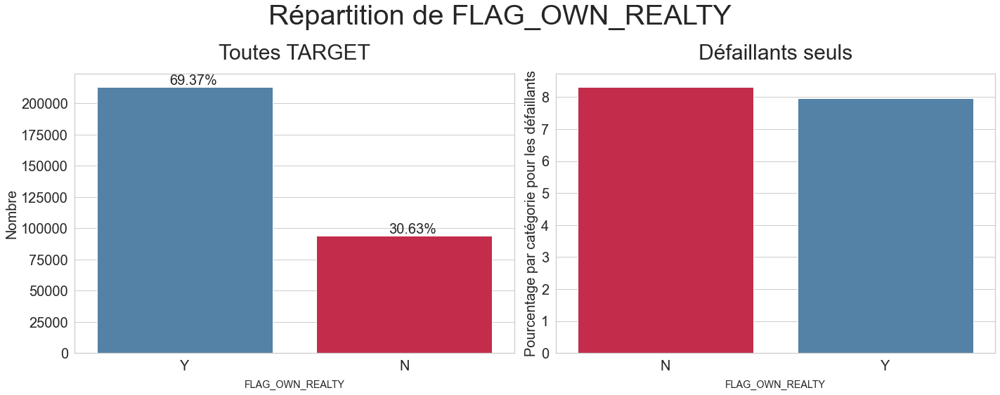

In [35]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_OWN_REALTY',
    figsize=(20, 8), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['Crimson', 'SteelBlue'])

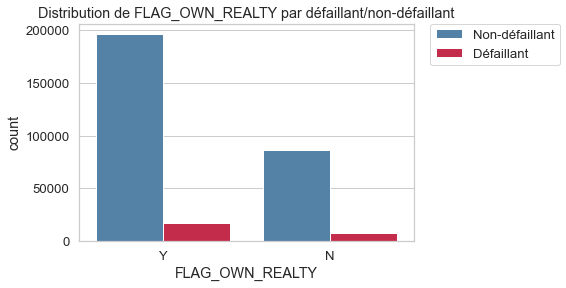

In [98]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_OWN_REALTY')

**Bilan** :
***
- 69% des demandeurs possèdent un une maion ou un appartement.
- Parmi les défaillants, les défaillants possédant ou non une maison ou un appartement sont très proches (autour de 8%).

Cette variable ne sera pas très utile pour départager les défaillants des non-défaillants sur la possession ou non d'une maison ou d'un appartement.

<span style='background:PaleGreen'>**Variable NAME_TYPE_SUITE**</span>

Qui accompagnait le demandeur lorsqu'il a demandé le prêt ?

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_TYPE_SUITE' sont :
['Unaccompanied' 'Family' 'Spouse, partner' 'Children' 'Other_A' nan
 'Other_B' 'Group of people']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_TYPE_SUITE = 8


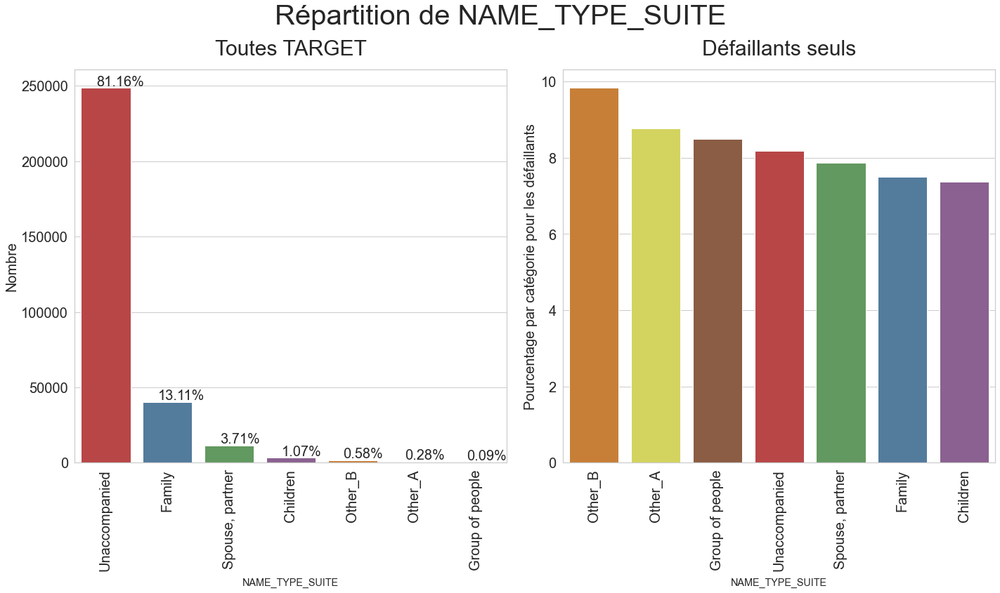

In [15]:
# Let us first see the unique categories of 'NAME_TYPE_SUITE'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'NAME_TYPE_SUITE',
                            show_counts=True)

# plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='NAME_TYPE_SUITE',
                                   figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38'],
                                   palette2=['#df7f20', '#e6e64c',
                                             '#965a38', '#cb3335',
                                             '#59a257', '#477ca8',
                                             '#905998'])

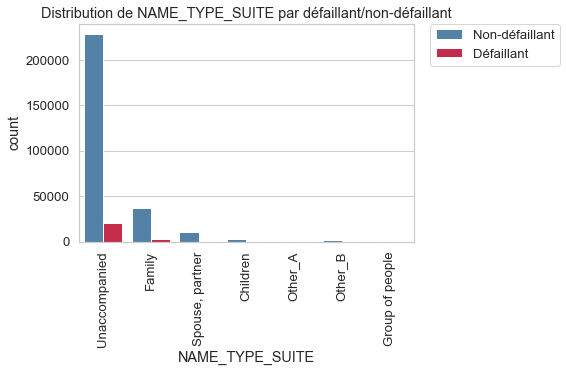

In [99]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'NAME_TYPE_SUITE',
                                              rotation=90)

**Bilan** :
***
- Le premier graphique général montre que :
    - la majorité des demandeurs n'ont pas été accompagnés leur du rendez-vous pour la demande de prêt (81%),
    - puis 13% ont été accompagnés par leur famille,
    - 4% par leur épouse ou conjoint,
    - très peu ont été accompagnés par un enfant (1%), ou d'autres personnes (<0.6% et 0.3% mais comment différencier Other_B de Other_A? pas précisé dans la documentation).
- Concernant les défaillants, les pourcentages du graphique général ne sont pas respectés :
    - les 3 catégories les plus défaillantes sont les 3 catégories représentant moins de 0.6% et 0.3% sur le graphique général :
        - 10% des défaillants ont été accompagnés par les autres personnes Other_B qui ne représentent que 0.6% des classes du graphique général.
        - 8.5% des autres personnes Other_A,
        - et 8% par un groupe de personnes.

L'accompagnateur du demandeur lors du rendez-vous de la demande de prêt pourra donc avoir une influence sur la défaillance du demandeur.

<span style='background:PaleGreen'>**Variable WEEKDAY_APPR_PROCESS_START**</span>

Quel jour de la semaine le demandeur a-t-il demandé le prêt ?

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'WEEKDAY_APPR_PROCESS_START' sont :
['WEDNESDAY' 'MONDAY' 'THURSDAY' 'SUNDAY' 'SATURDAY' 'FRIDAY' 'TUESDAY']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
TUESDAY      53901
WEDNESDAY    51934
MONDAY       50714
THURSDAY     50591
FRIDAY       50338
SATURDAY     33852
SUNDAY       16181
Name: WEEKDAY_APPR_PROCESS_START, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour WEEKDAY_APPR_PROCESS_START = 7


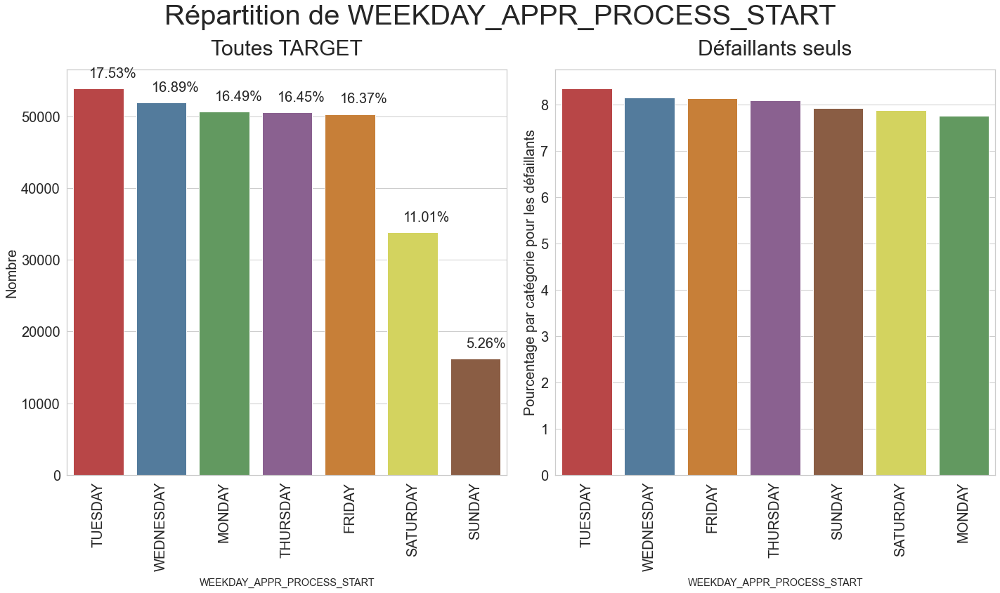

In [16]:
# Let us first see the unique categories of 'WEEKDAY_APPR_PROCESS_START'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'WEEKDAY_APPR_PROCESS_START',
                            show_counts=True)

# plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='WEEKDAY_APPR_PROCESS_START',
                                   figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38'],
                                   palette2=['#cb3335', '#477ca8',
                                             '#df7f20', '#905998',
                                             '#965a38', '#e6e64c',
                                             '#59a257'])

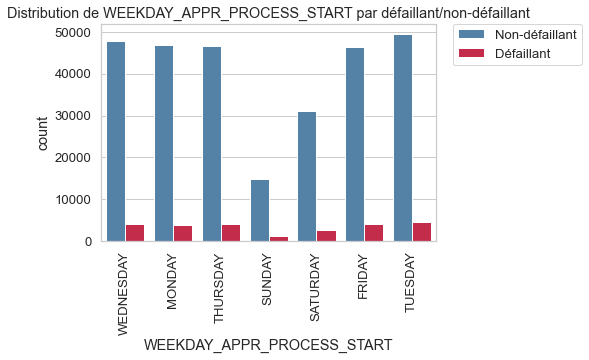

In [100]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'WEEKDAY_APPR_PROCESS_START',
                                              rotation=90)

**Bilan** :
***
- La majorité du jour de la demande de prêt est effectuée en semaine plutôt qu'en week-end avec une répartition sur tous les jours de la semaine avec un petit avantage le jeudi. Tout cela semble logique.
- Au niveau du graphique sur les défaillants seuls, la demande a été effectuée tous les jours de la semaine avec un pourentage autour de 8%.

Cette variable ne sera pas très utile pour départager les défaillants des non-défaillants sur l'information du jour de demande du prêt.

<span style='background:PaleGreen'>**Variable FONDKAPREMONT_MODE**</span>

Informations normalisées sur l'immeuble où vit le demandeur qu'il s'agisse de la taille moyenne (suffixe AVG), du modus (suffixe MODE) ou de la médiane (suffixe MEDI) de l'appartement, de la surface commune, de la surface habitable, de l'âge de l'immeuble, du nombre d'ascenseurs, du nombre d'entrées, de l'état de l'immeuble, du nombre d'étages...

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'FONDKAPREMONT_MODE' sont :
['reg oper account' nan 'org spec account' 'reg oper spec account'
 'not specified']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
reg oper account         73830
reg oper spec account    12080
not specified             5687
org spec account          5619
Name: FONDKAPREMONT_MODE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour FONDKAPREMONT_MODE = 5


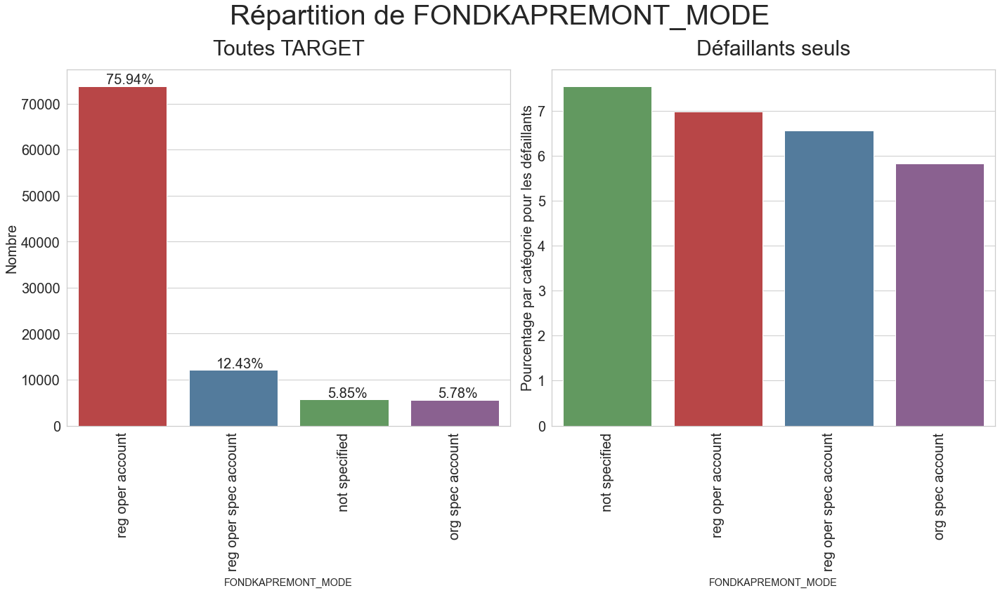

In [17]:
# Let us first see the unique categories of 'FONDKAPREMONT_MODE'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'FONDKAPREMONT_MODE',
                            show_counts=True)

# plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='FONDKAPREMONT_MODE',
                                   figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998'],
                                   palette2=['#59a257', '#cb3335',
                                             '#477ca8', '#905998'])

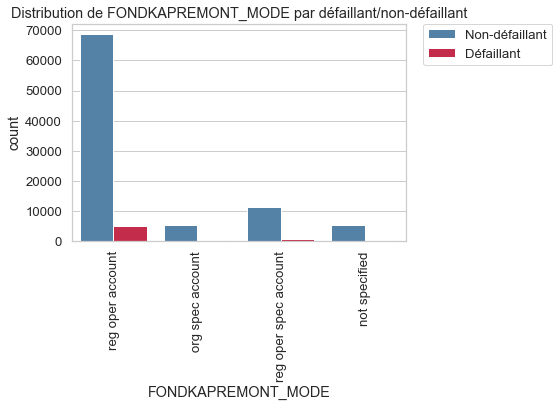

In [101]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FONDKAPREMONT_MODE',
                                              rotation=90)

**Bilan** :
***
Cette variable est difficile à comprendre puisque les libellés sont raccourcis et aucune des catégories ne se distinguent sur le graphique du zoom des défaillants seuls à droite. 
Cette variable sera peu utile pour départager les défaillants des non défaillants.

<span style='background:PaleGreen'>**Variable HOUSETYPE_MODE**</span>

Informations normalisées sur l'immeuble où vit le demandeur qu'il s'agisse de la taille moyenne (suffixe AVG), du modus (suffixe MODE) ou de la médiane (suffixe MEDI) de l'appartement, de la surface commune, de la surface habitable, de l'âge de l'immeuble, du nombre d'ascenseurs, du nombre d'entrées, de l'état de l'immeuble, du nombre d'étages...

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'HOUSETYPE_MODE' sont :
['block of flats' nan 'terraced house' 'specific housing']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
block of flats      150503
specific housing      1499
terraced house        1212
Name: HOUSETYPE_MODE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour HOUSETYPE_MODE = 4


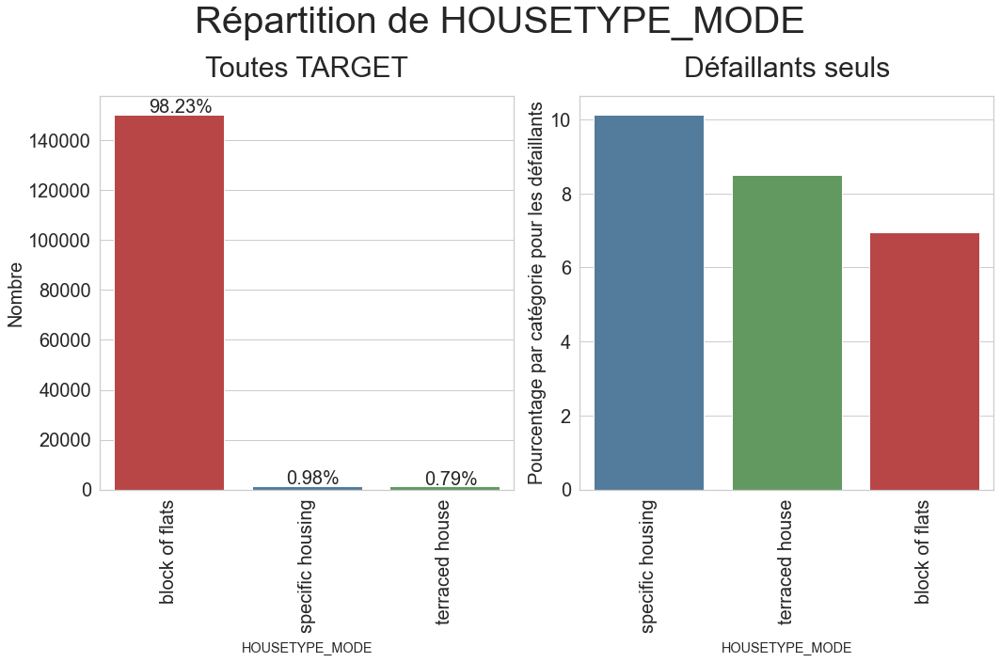

In [18]:
# Let us first see the unique categories of 'HOUSETYPE_MODE'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'HOUSETYPE_MODE',
                            show_counts=True)

# plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='HOUSETYPE_MODE',
                                   figsize=(15, 10),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257'],
                                   palette2=['#477ca8', '#59a257',
                                             '#cb3335'])

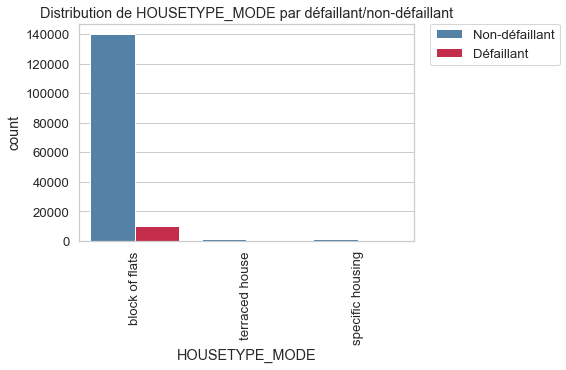

In [102]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'HOUSETYPE_MODE',
                                              rotation=90)

**Bilan** :
***
Cette variable est diffcile à comprendre et relativement bien partagée sur les défaillants donc ne sera pas primordiale pour départager les défaillants, des non-défaillants.

<span style='background:PaleGreen'>**Variable WALLSMATERIAL_MODE**</span>

Informations normalisées sur l'immeuble où vit le demandeur qu'il s'agisse de la taille moyenne (suffixe AVG), du modus (suffixe MODE) ou de la médiane (suffixe MEDI) de l'appartement, de la surface commune, de la surface habitable, de l'âge de l'immeuble, du nombre d'ascenseurs, du nombre d'entrées, de l'état de l'immeuble, du nombre d'étages...

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'WALLSMATERIAL_MODE' sont :
['Stone, brick' 'Block' nan 'Panel' 'Mixed' 'Wooden' 'Others' 'Monolithic']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Panel           66040
Stone, brick    64815
Block            9253
Wooden           5362
Mixed            2296
Monolithic       1779
Others           1625
Name: WALLSMATERIAL_MODE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour WALLSMATERIAL_MODE = 8


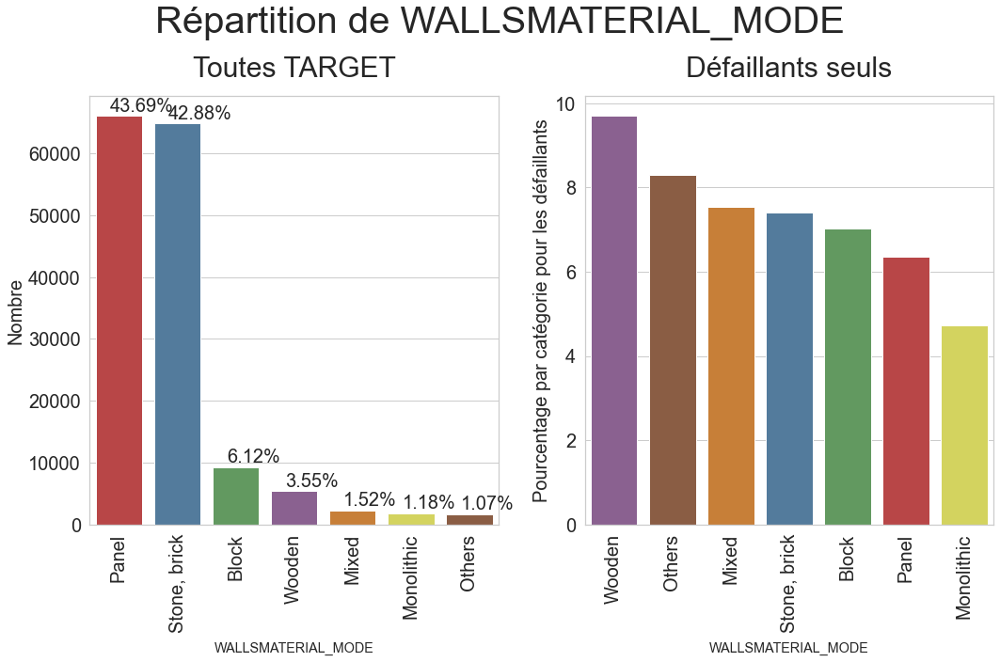

In [19]:
# Let us first see the unique categories of 'WALLSMATERIAL_MODE'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'WALLSMATERIAL_MODE',
                            show_counts=True)

# plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='WALLSMATERIAL_MODE',
                                   figsize=(15, 10),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38'],
                                   palette2=['#905998', '#965a38',
                                             '#df7f20', '#477ca8',
                                             '#59a257', '#cb3335',
                                             '#e6e64c'])

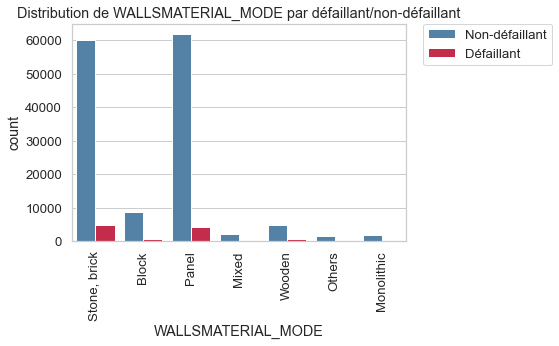

In [103]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'WALLSMATERIAL_MODE',
                                              rotation=90)

**Bilan** :
***
Cette variable est relativement bien partagée sur le graphique des défaillants donc ne sera pas primordiale pour départager les défaillants, des non-défaillants.

<span style='background:PaleGreen'>**Variable EMERGENCYSTATE_MODE**</span>

Informations normalisées sur l'immeuble où vit le demandeur qu'il s'agisse de la taille moyenne (suffixe AVG), du modus (suffixe MODE) ou de la médiane (suffixe MEDI) de l'appartement, de la surface commune, de la surface habitable, de l'âge de l'immeuble, du nombre d'ascenseurs, du nombre d'entrées, de l'état de l'immeuble, du nombre d'étages...

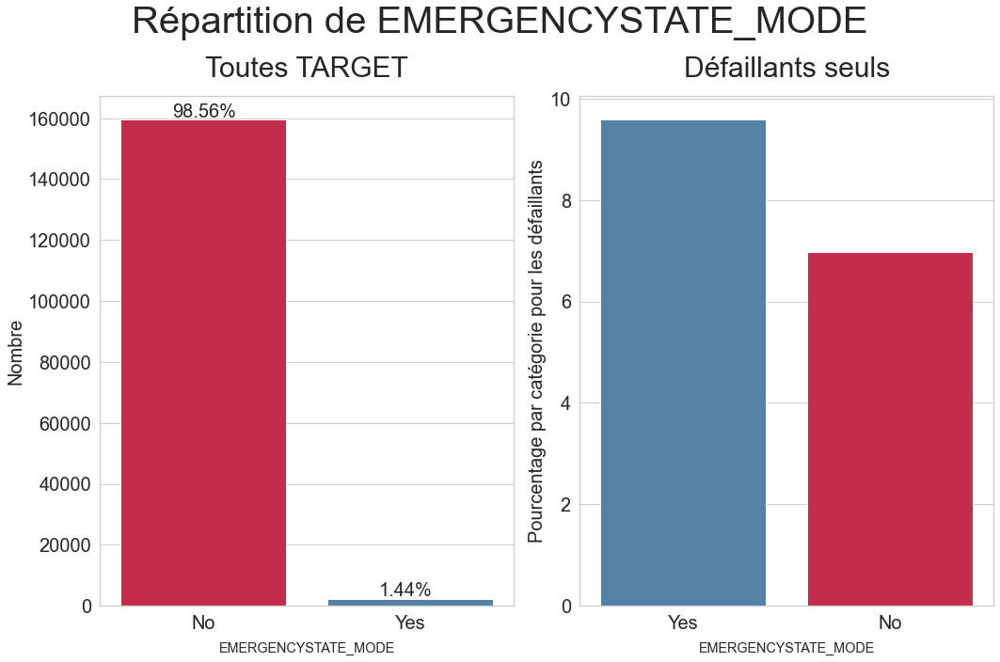

In [104]:
# Let us first see the unique categories of 'EMERGENCYSTATE_MODE'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'EMERGENCYSTATE_MODE',
                            show_counts=True)

# plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='EMERGENCYSTATE_MODE',
                                   figsize=(15, 10),
                                   rotation=0, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['Crimson', 'SteelBlue'],
                                   palette2=['SteelBlue', 'Crimson'])

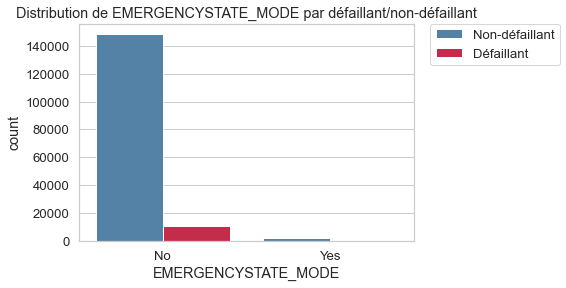

In [105]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'EMERGENCYSTATE_MODE')

**Bilan** :
***
La majorité n'est pas en état d'urgence mais plus de défaillants sont dans un état d'urgence.

<span style='background:PaleGreen'>**Variable FLAG_MOBIL**</span>

Le demandeur a-t-il fourni un téléphone portable ? :
- **1** : OUI, 
- et **0** : NON.

Nombre de catégories uniques pour FLAG_MOBIL = 2


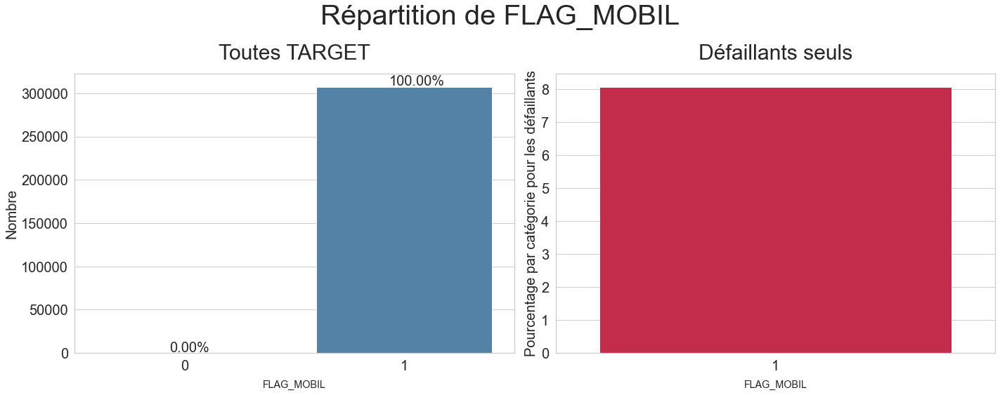

In [102]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_MOBIL',
    figsize=(20, 8), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['Crimson', 'SteelBlue'], palette2=['Crimson', 'SteelBlue'])

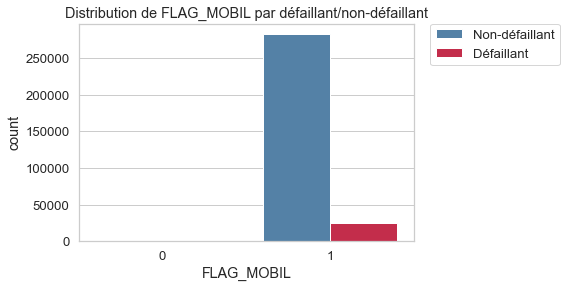

In [106]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_MOBIL')

**Bilan** :
***
- 100% des demandeurs ont fourni un numéro de téléphone portable.

Cette variable ne sera pas très utile pour départager les défaillants des non-défaillants sur la possession ou non d'un téléphone portable.

<span style='background:PaleGreen'>**Variable FLAG_WORK_PHONE**</span>

Le demandeur a-t-il fourni un téléphone de travailfixe ? :
- **1** : OUI, 
- et **0** : NON.

Nombre de catégories uniques pour FLAG_WORK_PHONE = 2


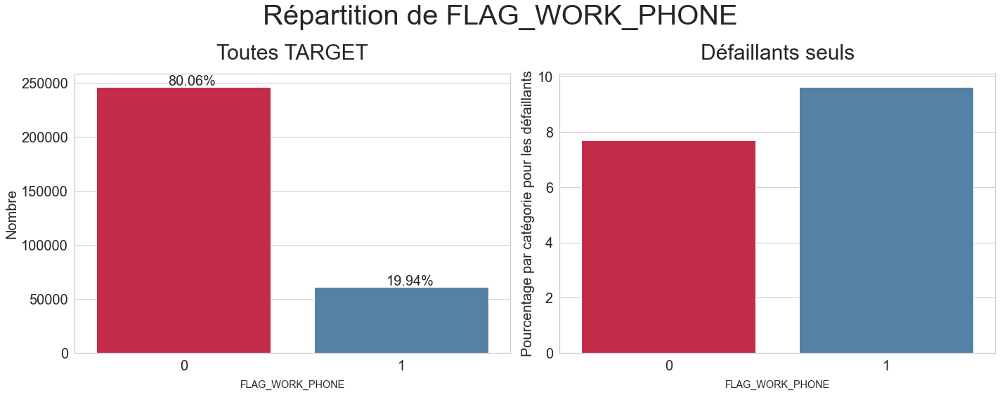

In [103]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_WORK_PHONE',
    figsize=(20, 8), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['Crimson', 'SteelBlue'], palette2=['Crimson', 'SteelBlue'])

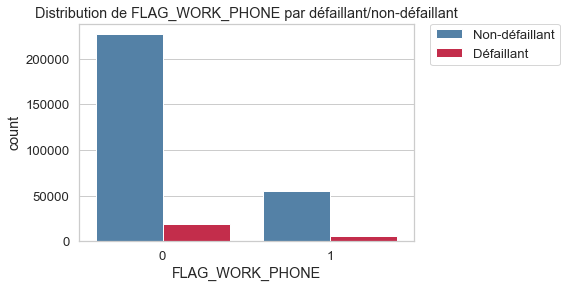

In [107]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_WORK_PHONE')

**Bilan** :
***
- 80% des demandeurs ont un téléphone de travailfixe, pour les défaillants la tendance est inverse avec un peu plus (10% au lieu de 8%) de possesseur d'une ligne fixe au travail que pour les défaillants mais le pourcentage est assez proche.

Cette variable ne sera pas très utile pour départager les défaillants des non-défaillants sur la possession ou non d'une ligne de travail fixe.

<span style='background:PaleGreen'>**Variable FLAG_CONT_MOBILE**</span>

Le téléphone portable était-il joignable ? :
- **1** : OUI, 
- et **0** : NON.

Nombre de catégories uniques pour FLAG_CONT_MOBILE = 2


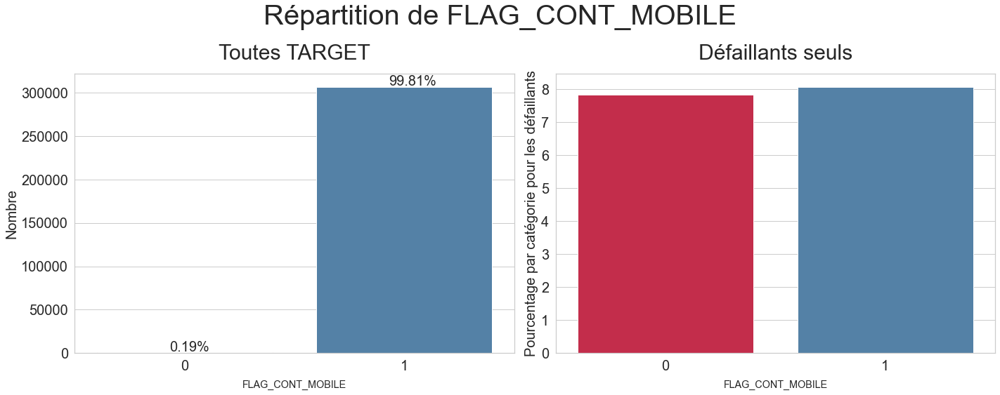

In [104]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_CONT_MOBILE',
    figsize=(20, 8), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['Crimson', 'SteelBlue'], palette2=['Crimson', 'SteelBlue'])

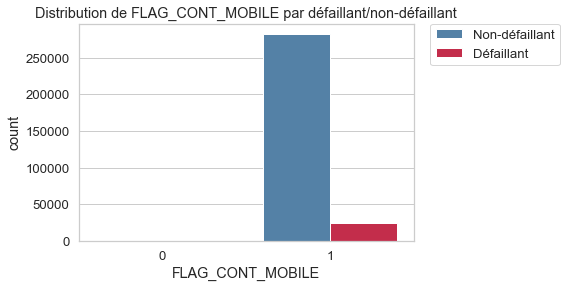

In [108]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_CONT_MOBILE')

**Bilan** :
***
- sur l'ensemble des demandeurs, le téléphone portable est joignable à 99,8% mais pour les défaillants le pourcentage passe à 50%.

Cette variable pourra être utile pour départager les défaillants des non-défaillants sur la joignabilité du téléphone portable.

<span style='background:PaleGreen'>**Variable FLAG_PHONE**</span>

Le demandeur a-t-il fourni un numéro de téléphone fixe de domicile ? :
- **1** : OUI
- et **0** : NON

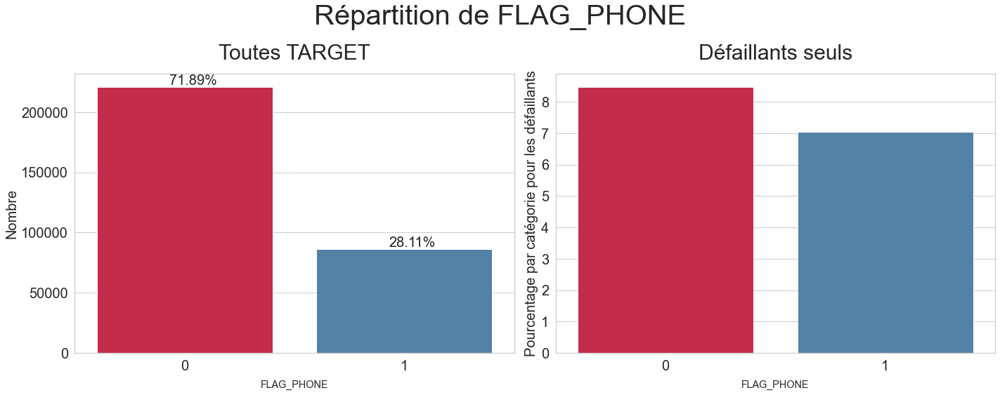

In [151]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_PHONE',
    figsize=(20, 8), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['Crimson', 'SteelBlue'], palette2=['Crimson', 'SteelBlue'])

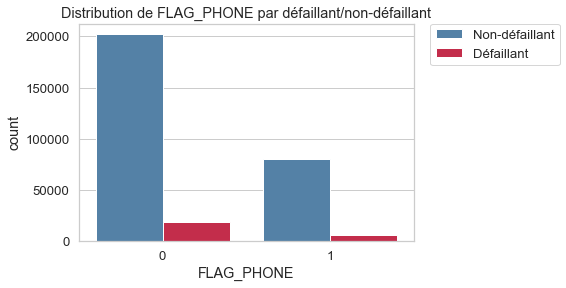

In [109]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_PHONE')

**Bilan** :
***
- 72% des demandeurs n'ont pas fourni de numéro de téléphone fixe de domicile mais parmi les défaillants seuls plus de personnes ont transmis leur numéro fixe que non.

Cette variable ne sera pas très utile pour départager les défaillants des non-défaillants sur la possession d'un numéro de téléphone fixe de domicile.

<span style='background:PaleGreen'>**Variable FLAG_EMAIL**</span>

Le demandeur a-t-il fourni une adresse électronique ? :
- **1** : OUI, 
- et **0** : NON.

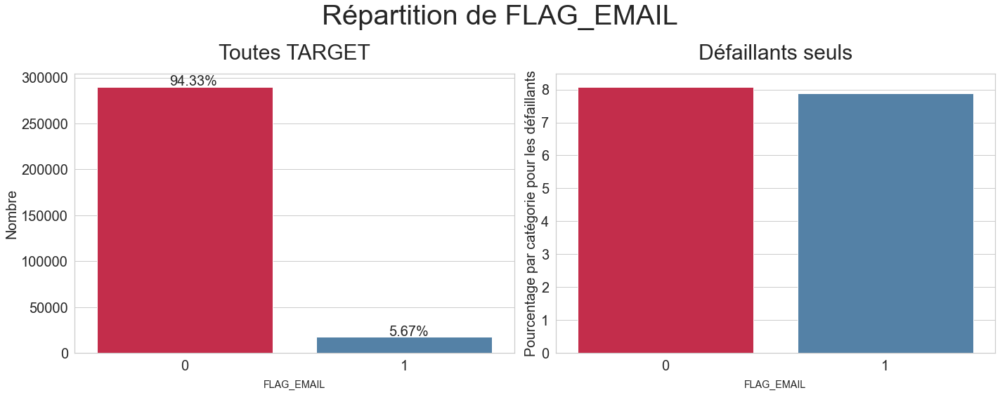

In [152]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_EMAIL',
    figsize=(20, 8), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['Crimson', 'SteelBlue'], palette2=['Crimson', 'SteelBlue'])

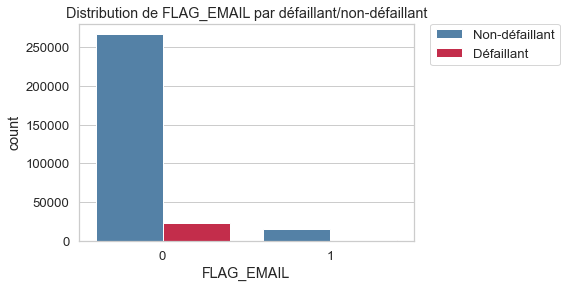

In [110]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_EMAIL')

**Bilan** :
***
Cette variable ne sera pas très utile pour départager les défaillants des non-défaillants sur la possession ou non d'une adresse de messagerie.

***
<span style='background:Plum'>**Distribution des variables quantitatives**</span>
***

In [49]:
# Liste des variables quantitatives
cols_num = \
    application_train.select_dtypes(include=[np.number]).columns.to_list()
cols_num

['SK_ID_CURR',
 'TARGET',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAR

<span style='background:PaleGreen'>**Variable DAYS_BIRTH**</span>

- Âge du demandeur en jours au moment de la demande.
- Pour l'ensemble de données donné, l'âge est indiqué en jours, ce qui peut être plus difficile à interpréter. 
- Nous allons donc créer une variable latente pour stocker les âges en années, ce qui sera plus facile à analyser et à interpréter.

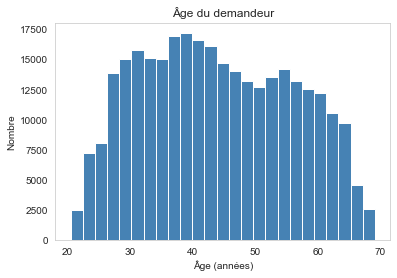

In [94]:
plt.hist(application_train['DAYS_BIRTH']*-1/365, color='SteelBlue',
         bins=25)
plt.title('Âge du demandeur')
plt.xlabel('Âge (années)')
plt.ylabel('Nombre')
plt.grid(False)
plt.show()

In [6]:
# Transformer l'âge en années à partir du nombre de jours
application_train['AGE_YEARS'] = \
    application_train['DAYS_BIRTH'] * -1 / 365

-------------------------------------------------------------------------------
Pecentiles de la variable AGE_YEARS
Pecentile 0 = 20.517808219178082
Pecentile 25 = 34.00821917808219
Pecentile 50 = 43.15068493150685
Pecentile 75 = 53.92328767123288
Pecentile 90 = 60.76986301369863
Pecentile 92 = 61.87397260273973
Pecentile 94 = 62.99452054794521
Pecentile 96 = 64.1945205479452
Pecentile 98 = 65.6027397260274
Pecentile 100 = 69.12054794520547
-------------------------------------------------------------------------------


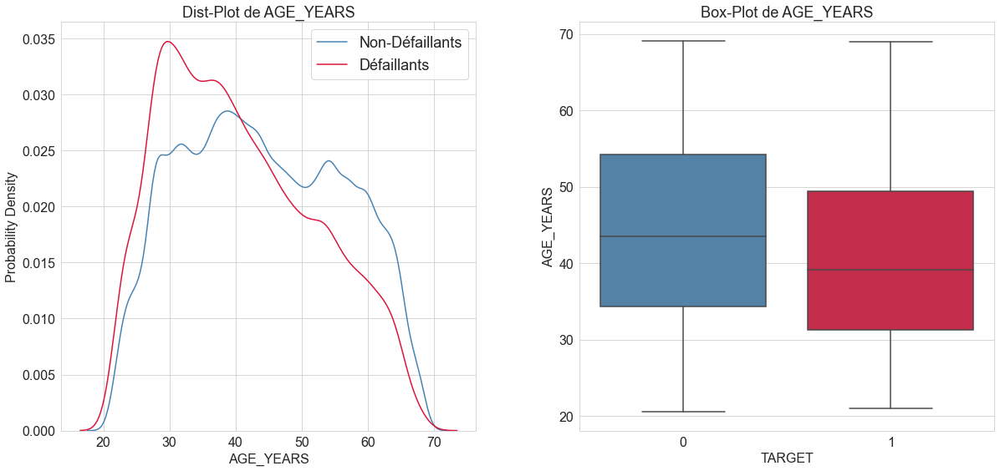

In [74]:
# Affiche les quantiles
eda_kernel_fonctions.print_percentiles(application_train, 'AGE_YEARS')
# Affiche boxplot, distplot pour l'âge
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AGE_YEARS',
                                               plots=['distplot', 'box'])
# Suppression de la variable nouvellement ajoutée
_ = application_train.pop('AGE_YEARS')

Les deux graphiques ci-dessus nous permettent de tirer quelques enseignements importants.

- Dans le distplot, nous pouvons observer le pic d'âge des défaillants se rapproche de 30 ans. De plus, à ce stade, les personnes qui ne sont pas en défaut de paiement ont un PDF assez faible. Une autre chose à noter est que la PDF de l'âge des défaillants commence un peu à gauche de celle des non défaillants, et qu'elle est également un peu plus étirée sur tous les âges. Cela signifie que les défaillants sont généralement plus jeunes que les non-défaillants.
- Le box-plot nous permet également de mieux visualiser la même chose. L'âge des défaillants est généralement inférieur à celui des non-défaillants. Tous les quantiles d'âge des défaillants sont inférieurs à ceux des non-défaillants. La valeur du 75e percentile des non-défaillants est d'environ 54 ans, tandis que celle des défaillants est proche de 49 ans.

Ces observations impliquent que les défaillants sont généralement plus jeunes que les non-défaillants.

<span style='background:PaleGreen'>**Variable DAYS_EMPLOYED**</span>

**Bilan** :
***
- Cette variable indique le nombre de jours depuis le jour de la demande où le demandeur a été employé.
- Pour faciliter l'interprétation, nous allons convertir les jours en années.

-------------------------------------------------------------------------------
Pecentiles de la variable DAYS_EMPLOYED
Pecentile 0 = -17912.0
Pecentile 25 = -2760.0
Pecentile 50 = -1213.0
Pecentile 75 = -289.0
Pecentile 90 = 365243.0
Pecentile 92 = 365243.0
Pecentile 94 = 365243.0
Pecentile 96 = 365243.0
Pecentile 98 = 365243.0
Pecentile 100 = 365243.0
-------------------------------------------------------------------------------
-------------------------------------------------------------------------------
Pecentiles de la variable YEARS_EMPLOYED
Pecentile 0 = -1000.6657534246575
Pecentile 25 = 0.7917808219178082
Pecentile 50 = 3.3232876712328765
Pecentile 75 = 7.561643835616438
Pecentile 90 = 13.372602739726027
Pecentile 92 = 14.726027397260275
Pecentile 94 = 16.958904109589042
Pecentile 96 = 20.134246575342466
Pecentile 98 = 25.15068493150685
Pecentile 100 = 49.07397260273972
-------------------------------------------------------------------------------


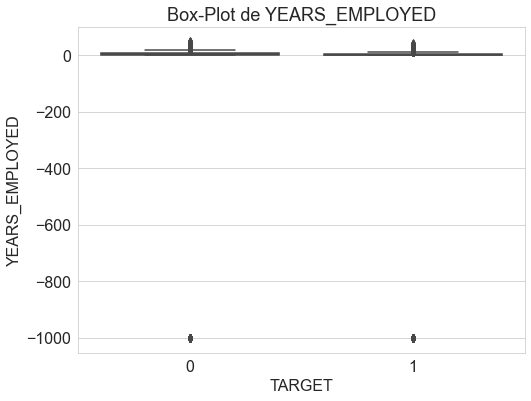

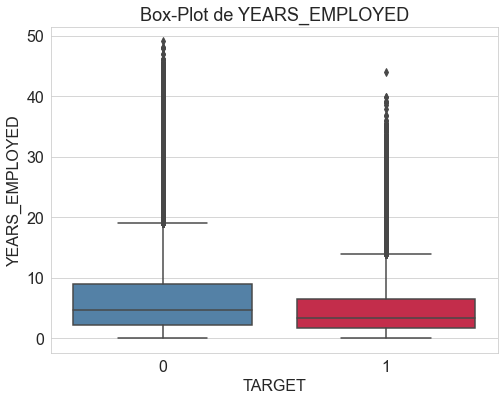

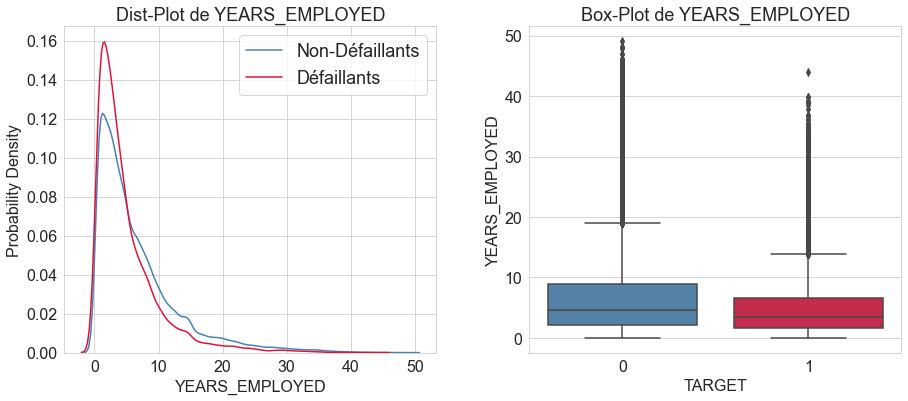

In [10]:
# Transformer en années à partir du nombre de jours
application_train['YEARS_EMPLOYED'] = \
    application_train['DAYS_EMPLOYED'] * -1 / 365
# Affiche les quantiles
eda_kernel_fonctions.print_percentiles(application_train, 'DAYS_EMPLOYED')
eda_kernel_fonctions.print_percentiles(application_train, 'YEARS_EMPLOYED')
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'YEARS_EMPLOYED',
                                               plots=['box'],
                                               figsize=(8, 6))
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'YEARS_EMPLOYED',
                                               plots=['box'],
                                               scale_limits=[0, 70],
                                               figsize=(8, 6))
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'YEARS_EMPLOYED',
                                               plots=['distplot', 'box'],
                                               scale_limits=[0, 70],
                                               figsize=(15, 6))
# Suppression de la variable nouvellement ajoutée
_ = application_train.pop('YEARS_EMPLOYED')

**Bilan** :
***
- Nous voyons que la colonne DAYS_EMPLOYED contient quelques points de données erronés avec les valeurs 365243. Cela semble être des valeurs erronées/non sensorielles.
- Sur le boxplot, nous observons que les défaillants semblent avoir moins d'années d'emploi que les non-défaillants. Tous les quantiles 25, 50 et 75 des défaillants sont inférieurs à ceux des non-défaillants.

<span style='background:PaleGreen'>**Variable DAYS_REGISTRATION**</span>

- Cette variable indique depuis combien de jours le demandeur a effectué une modification sur le formulaire informatique enregistré sur la demande.

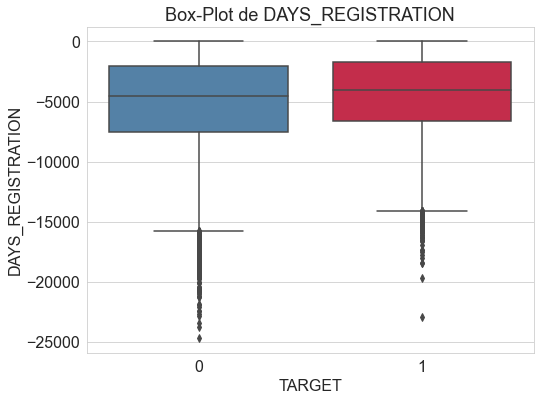

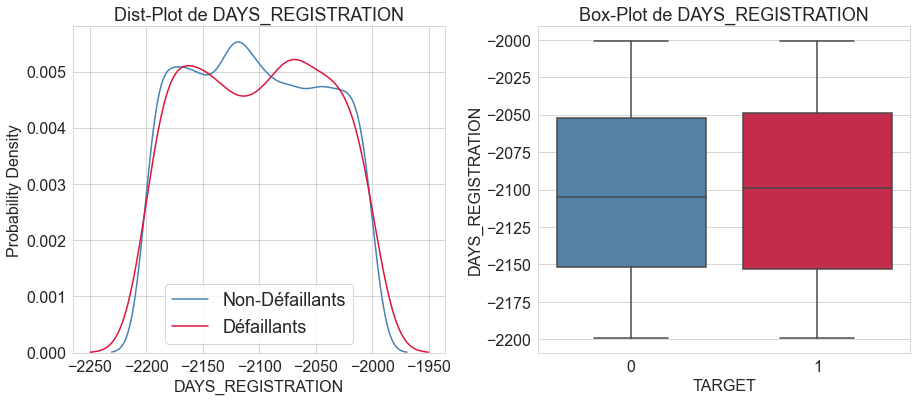

In [12]:
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'DAYS_REGISTRATION',
                                               plots=['box'],
                                               figsize=(8, 6))
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'DAYS_REGISTRATION',
                                               plots=['distplot', 'box'],
                                               scale_limits=[-2200, -2000],
                                               figsize=(15, 6))

**Bilan** :
***
- Le boxplot montre que le nombre de jours écoulés depuis le dernier enregistrement de modification de la demande des défaillants est généralement inférieur.
- Les non défaillants affichent un nombre de jours plus élevé pour tous les quantiles depuis qu'ils ont changé leur document d'identité.

<span style='background:PaleGreen'>**Variable DAYS_ID_PUBLISH**</span>

- Cette variable indique depuis combien de jours, à partir du jour de l'enregistrement, le demandeur a changé le document d'identité avec lequel il a demandé le prêt.

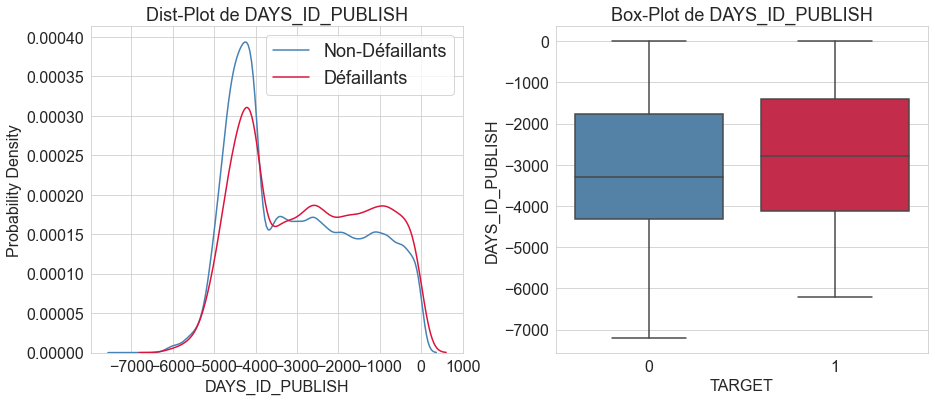

In [13]:
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'DAYS_ID_PUBLISH',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan** :
***
- Le boxplot montre une tendance similaire à celle de DAYS_REGISTRATION, où le nombre de jours écoulés depuis le changement d'identité des défaillants est généralement inférieur.
- Les non défaillants affichent un nombre de jours plus élevé de dernier enregistrement de la demande pour tous les quantiles.

<span style='background:PaleGreen'>**Variables EXT_SOURCES_1, EXT_SOURCES_2, EXT_SOURCES_3**</span>

- Il existe trois colonnes EXT_SOURCES, qui contiennent des valeurs comprises entre 0 et 1. 
- Il s'agit de scores normalisés provenant de différentes sources pour lesquels nous n'avons pas plus d'information.

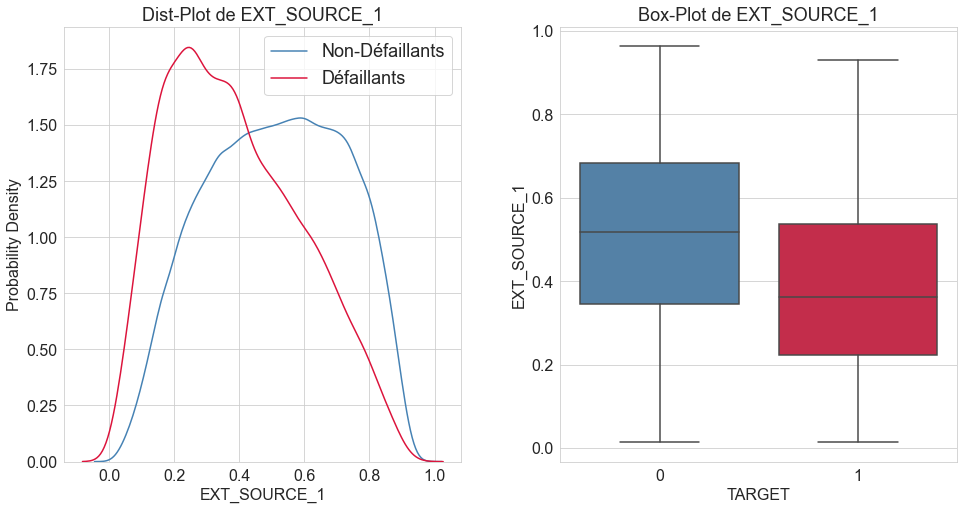

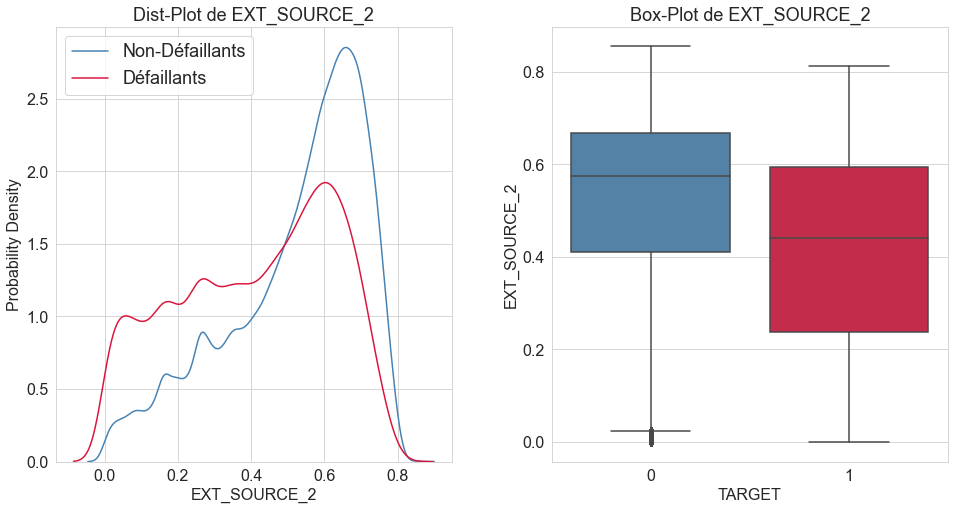

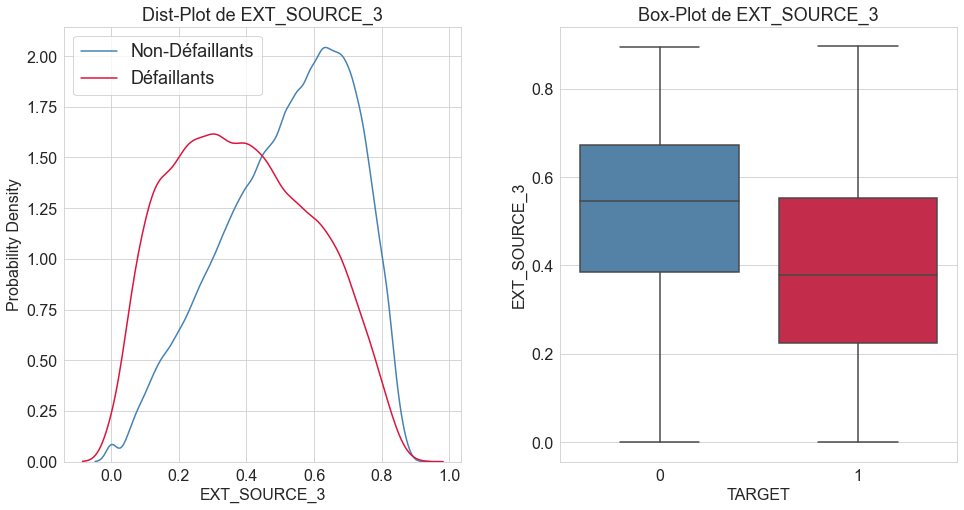

In [78]:
# Distplot et boxplot de EXT_SOURCE_1
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'EXT_SOURCE_1',
                                               plots=['distplot', 'box'],
                                               figsize=(16, 8))
# Distplot et boxplot de EXT_SOURCE_2
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'EXT_SOURCE_2',
                                               plots=['distplot', 'box'],
                                               figsize=(16, 8))
# Distplot et boxplot de EXT_SOURCE_3
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'EXT_SOURCE_3',
                                               plots=['distplot', 'box'],
                                               figsize=(16, 8))

**Bilan** :
***
À partir des trois graphiques ci-dessus, nous pouvons tirer les conclusions suivantes :

- Si nous examinons les box-plots, nous pouvons clairement voir une tendance similaire pour les trois colonnes EXT_SOURCE, à savoir que les valeurs des défaillants ont tendance à avoir des valeurs considérablement plus basses que les non-défaillants.
- Cette tendance peut également être observée avec les PDF. Les non-défaillants montrent un pic plus élevé pour les valeurs élevées de EXT_SOURCE, et les densités de probabilité sont très faibles pour les valeurs faibles. Cela implique que les non-défaillants ont généralement des valeurs élevées pour ces scores.
- Il est intéressant de noter que la valeur médiane des défaillants est presque égale ou inférieure aux valeurs du 25ème percentile des non-défaillants.
- Les variables EXT_SOURCE_1 et EXT_SOURCE_3 tendent à montrer une meilleure discrimination/séparabilité par rapport à la variable EXT_SOURCE_2.

Ces 3 variables semblent être les meilleurs pour séparer linéairement les défaillants et les non-défaillants parmi toutes les variables utilisées jusqu'à présent.

<span style='background:PaleGreen'>**Variable FLOORSMAX_AVG**</span>

Cette variable décrit les scores normalisés de la moyenne du nombre maximum d'étages dans le bâtiment du demandeur.

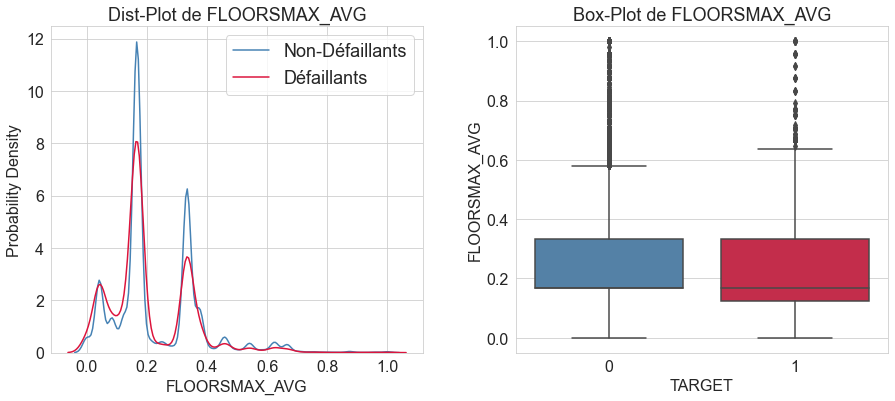

In [14]:
# Boxplot de FLOORSMAX_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'FLOORSMAX_AVG',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Le boxplot montre que les défaillants ont une valeur médiane de la caractéristique FLOORSMAX_AVG inférieure à celle des non-défaillants.
- Les valeurs du 75e percentile des défaillants et des non-défaillants sont plus ou moins les mêmes, mais la valeur du 25e percentile des non-défaillants est presque supérieure à la médiane des défaillants.

Cette variable pourrait être une variable importante pour départager les défaillants des non-défaillants.

<span style='background:PaleGreen'>**Variable FLOORSMAX_MEDI**</span>

Cette variable décrit les scores normalisés de la médiane du nombre maximum d'étages dans le bâtiment du demandeur.

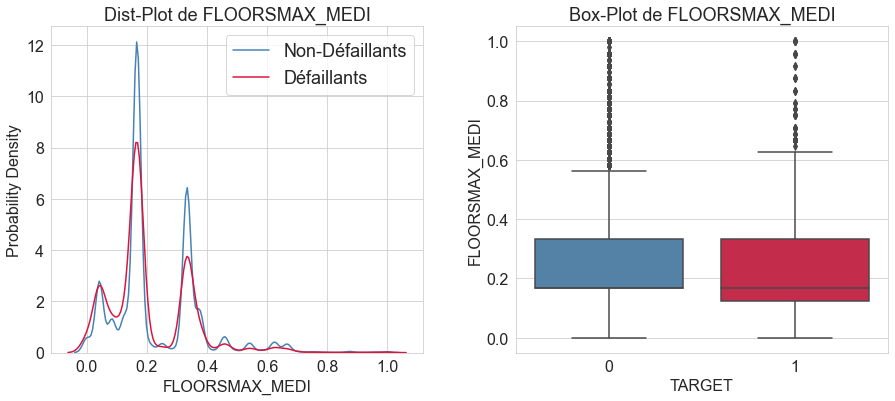

In [15]:
# Boxplot de FLOORSMAX_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'FLOORSMAX_MEDI',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Le boxplot montre que les défaillants ont une valeur médiane de la caractéristique FLOORSMAX_MEDI inférieure à celle des non-défaillants.
- Les valeurs du 75e percentile des défaillants et des non-défaillants sont plus ou moins les mêmes, mais la valeur du 25e percentile des non-défaillants est presque supérieure à la médiane des défaillants.

Cette variable pourrait être une variable importante pour départager les défaillants des non-défaillants.

<span style='background:PaleGreen'>**Variable FLOORSMAX_MODE**</span>

Cette variable décrit les scores normalisés du mode du nombre maximum d'étages dans le bâtiment du demandeur

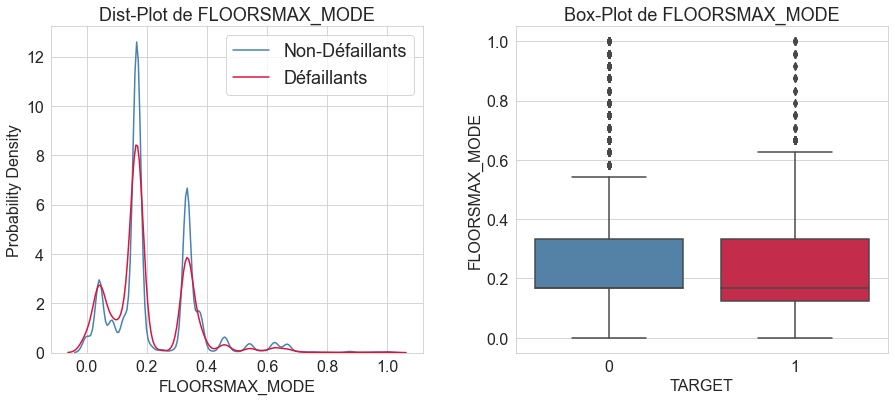

In [16]:
# Boxplot de FLOORSMAX_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'FLOORSMAX_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Le boxplot montre que les défaillants ont une valeur médiane de la variable FLOORSMAX_MODE inférieure à celle des non-défaillants.
- Les valeurs du 75e percentile des défaillants et des non-défaillants sont plus ou moins les mêmes, mais la valeur du 25e percentile des non-défaillants est presque supérieure à la médiane des défaillants.

Cette variable pourrait être une variable importante pour départager les défaillants des non-défaillants.

<span style='background:PaleGreen'>**Variable FLOORSMIN_MODE**</span>

Cette variable décrit les scores normalisés du mode du nombre minimum d'étages dans le bâtiment du demandeur.

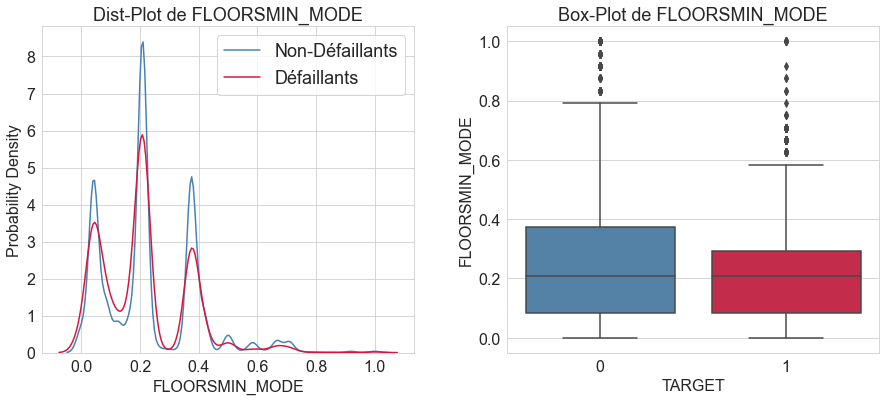

In [17]:
# Boxplot de FLOORSMIN_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'FLOORSMIN_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Le boxplot montre que non-défaillants ont tendance à montrer une valeur plus élevée de FLOORSMIN_MODE par rapport aux défaillants. 
- La valeur du 75ème percentile des non-défaillants est significativement plus élevée que celle du 75ème percentile des défaillants.

Cette variable pourrait être une variable importante pour départager les défaillants des non-défaillants.

<span style='background:PaleGreen'>**Variable FLOORSMIN_AVG**</span>

Cette variable décrit les scores normalisés de la moyenne du nombre minimum d'étages dans le bâtiment du demandeur.

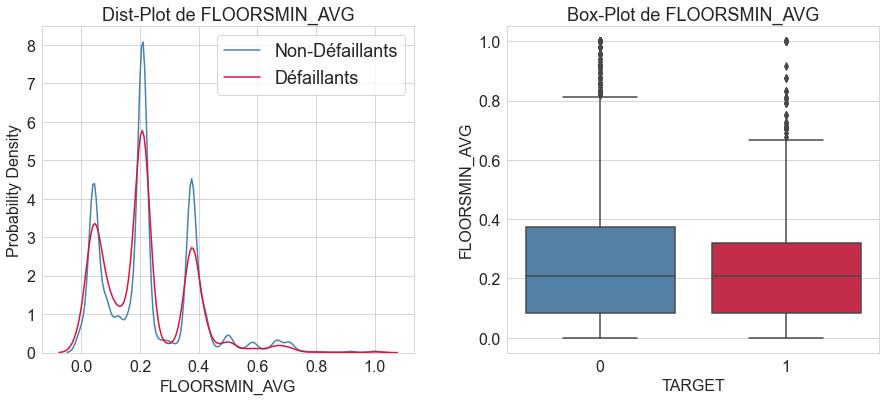

In [18]:
# Boxplot de FLOORSMIN_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'FLOORSMIN_AVG',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Le boxplot montre que non-défaillants ont tendance à montrer une valeur plus élevée de FLOORSMIN_AVG par rapport aux défaillants. 
- La valeur du 75ème percentile des non-défaillants est significativement plus élevée que celle du 75ème percentile des défaillants.

Cette variable pourrait être une variable importante pour départager les défaillants des non-défaillants.

<span style='background:PaleGreen'>**Variable FLOORSMIN_MEDI**</span>

Cette variable décrit les scores normalisés de la médiane du nombre minimum d'étages dans le bâtiment du demandeur.

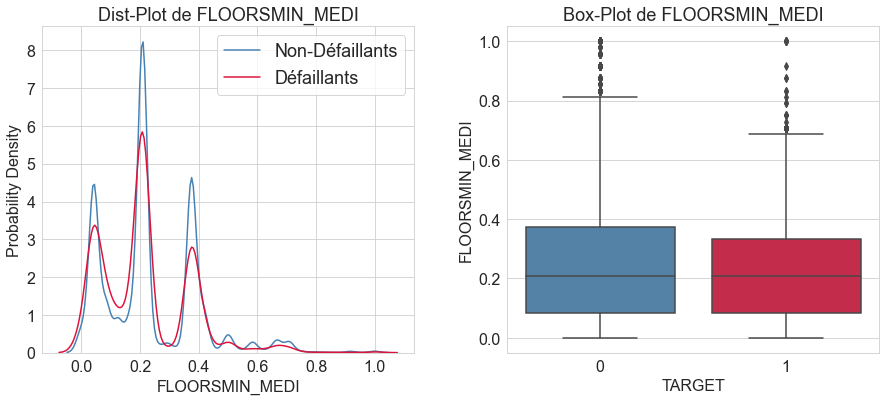

In [19]:
# Boxplot de FLOORSMIN_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'FLOORSMIN_MEDI',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Le boxplot montre que non-défaillants ont tendance à montrer une valeur plus élevée de FLOORSMIN_MEDI par rapport aux défaillants. 
- La valeur du 75ème percentile des non-défaillants est significativement plus élevée que celle du 75ème percentile des défaillants.

Cette variable pourrait être une variable importante pour départager les défaillants des non-défaillants.

<span style='background:PaleGreen'>**Variable AMT_GOODS_PRICE**</span>

- Prix du bien que le demandeur a demandé (le cas échéant) sur la demande précédent.

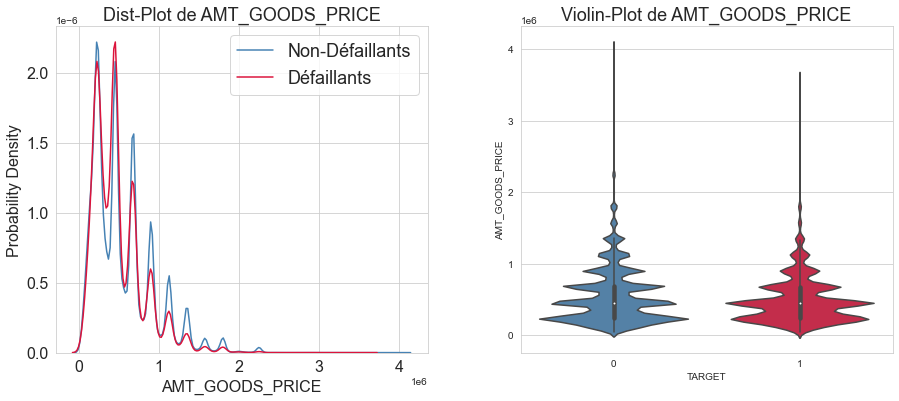

In [20]:
# Violinplot de AMT_GOODS_PRICE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_GOODS_PRICE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les différents quantiles ont pratiquement la même valeur pour les défaillants que pour les non-défaillants.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable CNT_CHILDREN**</span>

- Nombre d'enfants du demandeur.

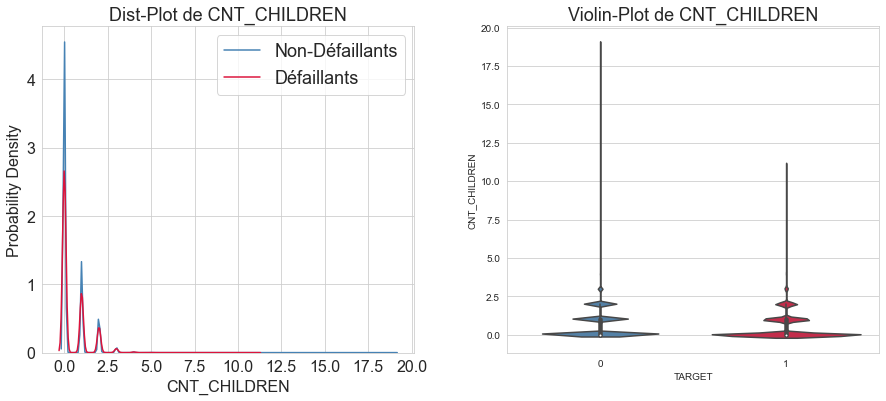

In [24]:
# Violinplot de CNT_CHILDREN
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'CNT_CHILDREN',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les différents quantiles ont pratiquement la même valeur pour les défaillants que pour les non-défaillants.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable AMT_INCOME_TOTAL**</span>

- Revenu du demandeur.

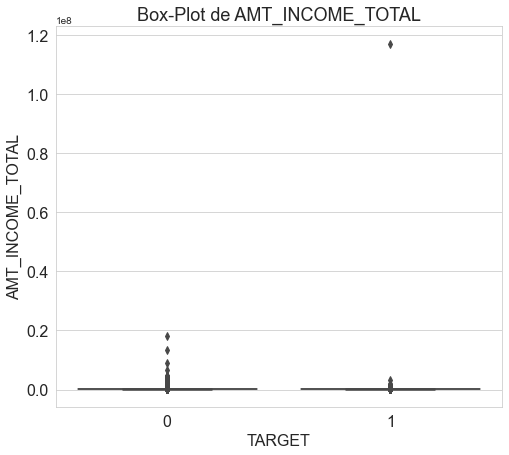

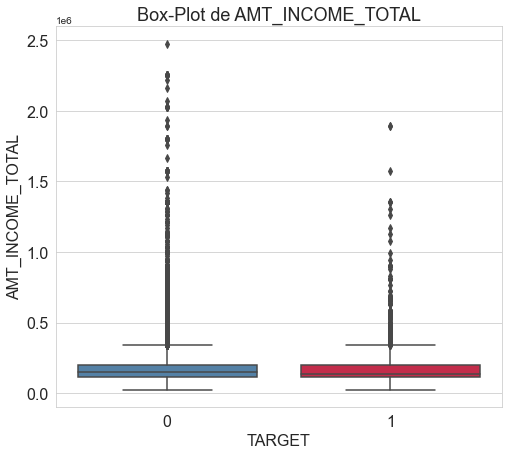

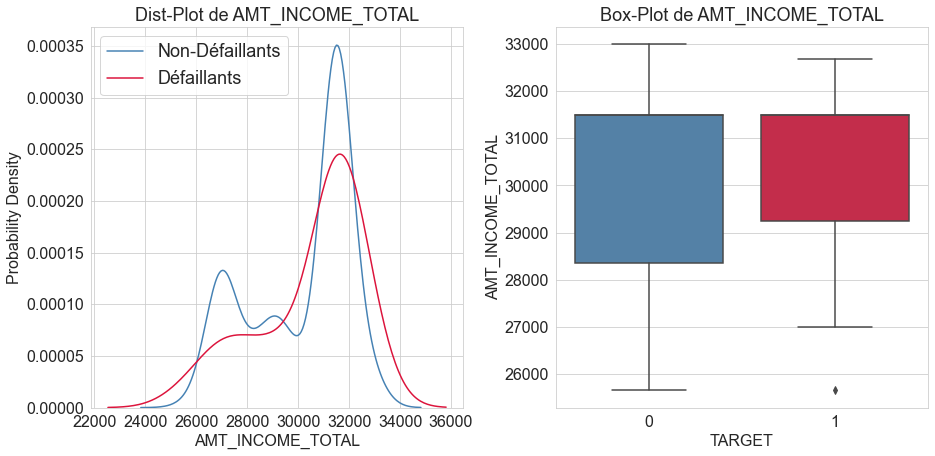

In [25]:
# Boxplot de CNT_CHILDREN
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_INCOME_TOTAL',
                                               plots=['box'],
                                               figsize=(8, 7))
# Zoom hors outlier
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_INCOME_TOTAL',
                                               plots=['box'],
                                               figsize=(8, 7),
                                               scale_limits=[0, 25e5])
# Zoom hors outlier
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_INCOME_TOTAL',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 7),
                                               scale_limits=[0, 33e3])

**Bilan**:
***
- Les défaillants n'ont pas forcément plus de revenus que les défaillants, les quantiles 75 sont identiques, les quantiles 25 des défaillants est plus élevé que le quantile 25 des défaillants.

Cette variable ne sera pas déterminante pour départager les non-défaillants des défaillants.

<span style='background:PaleGreen'>**Variable AMT_CREDIT**</span>

- Montant du crédit du prêt.

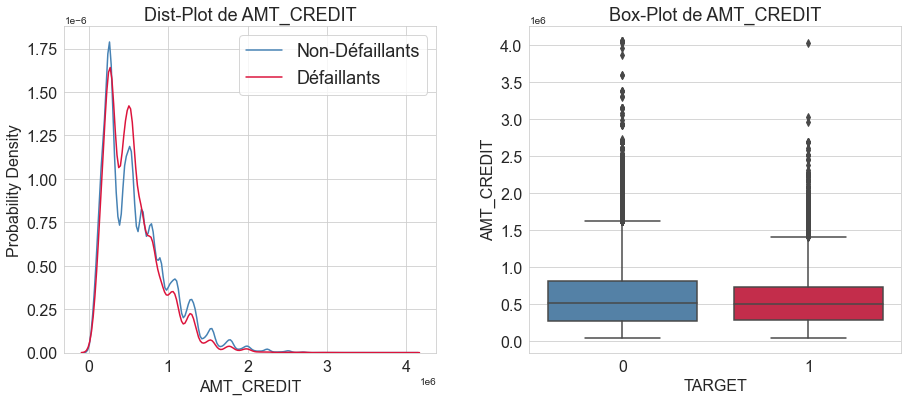

In [26]:
# Boxplot de AMT_CREDIT
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_CREDIT',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les différents quantiles ont pratiquement la même valeur pour les défaillants que pour les non-défaillants. Les montants de crédit demandés sont un peu plus élevé pour les non défaillants surtout pour les outliers.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable AMT_ANNUITY**</span>

- Annuité de prêt.

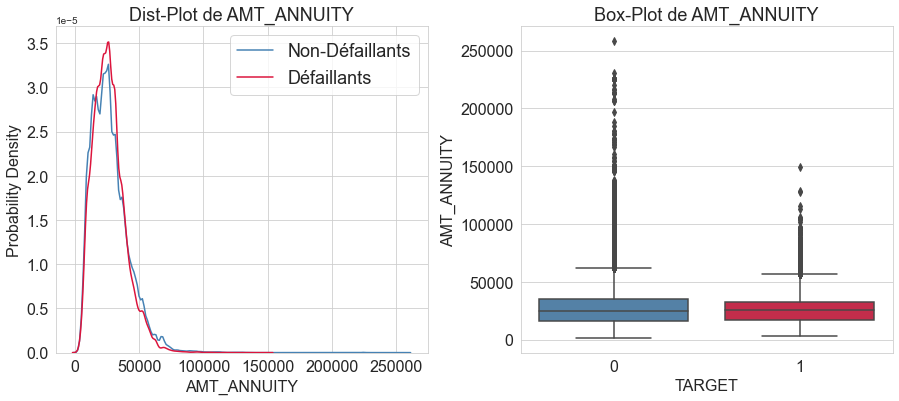

In [28]:
# Boxplot de AMT_ANNUITY
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_ANNUITY',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les différents quantiles ont pratiquement la même valeur pour les défaillants que pour les non-défaillants.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable REGION_POPULATION_RELATIVE**</span>

- Population normalisée de la région où vit le demandeur (un chiffre plus élevé signifie que le demandeur vit dans une région plus peuplée).

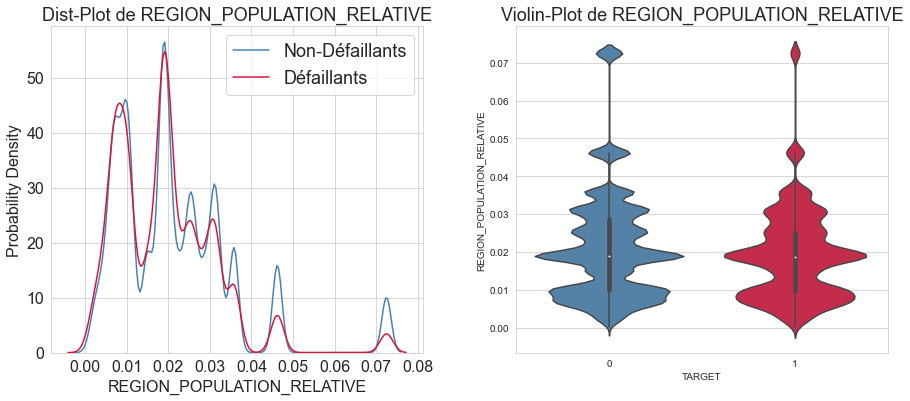

In [29]:
# Violinplot de AMT_ANNUITY
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'REGION_POPULATION_RELATIVE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence sur la Population normalisée de la région où vit le demandeur entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable OWN_CAR_AGE**</span>

- Âge de la voiture du demandeur.

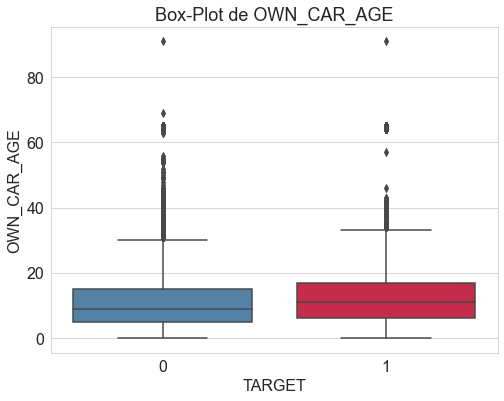

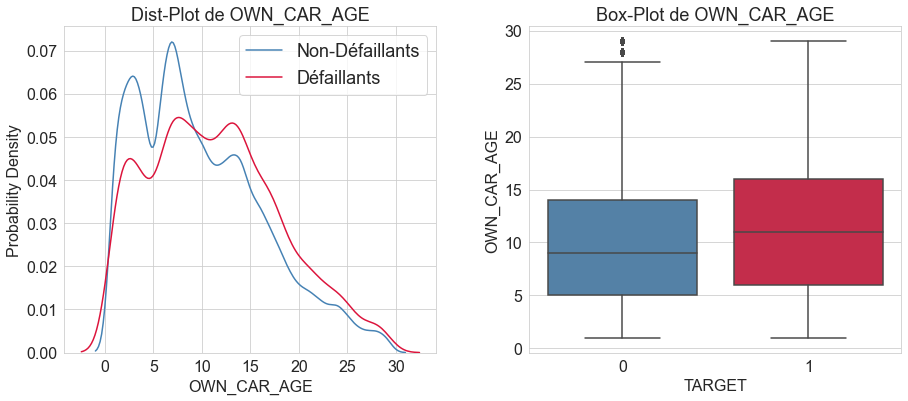

In [30]:
# Boxplot de OWN_CAR_AGE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'OWN_CAR_AGE',
                                               plots=['box'],
                                               figsize=(8, 6))
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'OWN_CAR_AGE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6),
                                               scale_limits=[0, 30])

**Bilan**:
***
- Les défaillants ont des voitures plus anciennes que les non-défaillants.

Cette variable pourra être utile pour départager les défaillants  des non-défaillants.

<span style='background:PaleGreen'>**Variable CNT_FAM_MEMBERS**</span>

De combien de membres est constituée la famille du demandeur?

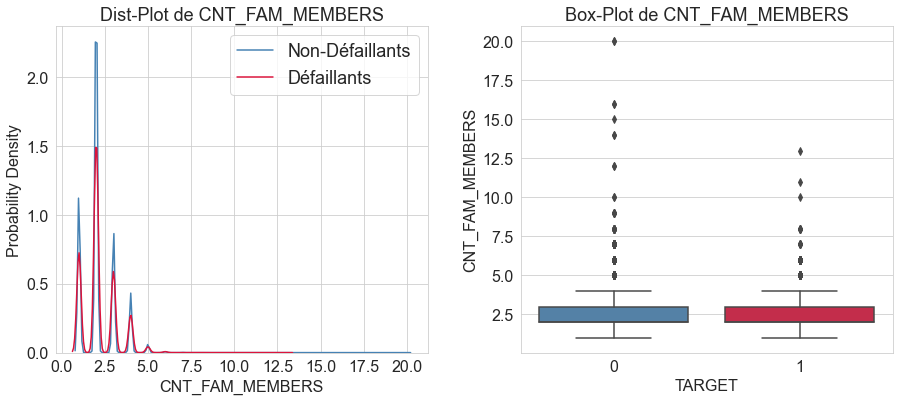

In [31]:
# Boxplot de CNT_FAM_MEMBERS
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'CNT_FAM_MEMBERS',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence sur le nombre de personnes composant le foyer entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable REGION_RATING_CLIENT**</span>

- Notre évaluation de la région où vit le demandeur (1 ou 2 ou 3).

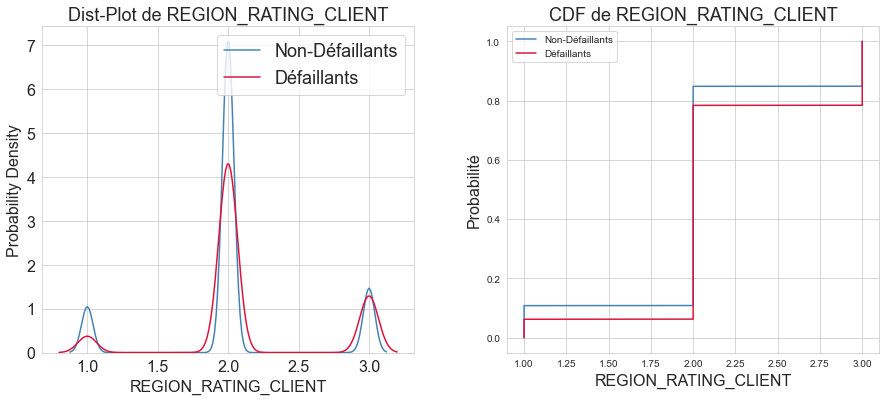

In [32]:
# CDF de REGION_RATING_CLIENT
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'REGION_RATING_CLIENT',
                                               plots=['distplot', 'CDF'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les non-défaillants ont tendance à être avoir une meilleure note sur l'évaluation où vivent les demandeurs que les défaillants mais la nuance n'est pas forte pour pouvoir être déterminante sur le partage des défaillants et des non-défaillants. 

<span style='background:PaleGreen'>**Variable REG_REGION_NOT_LIVE_REGION**</span>

Indicateur si l'adresse permanente du demandeur ne correspond pas à l'adresse de contact au niveau de la région :
- **1** : adresses différents, 
- **0** : adresses identiques.

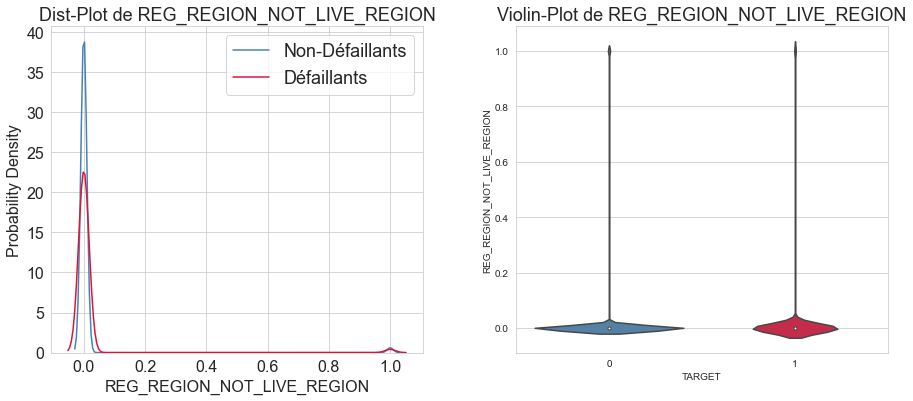

In [33]:
# Violinplot de REG_REGION_NOT_LIVE_REGION
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'REG_REGION_NOT_LIVE_REGION',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable REG_REGION_NOT_WORK_REGION**</span>

Indicateur si l'adresse permanente du demandeur ne correspond pas à l'adresse professionnelle au niveau de la région.
- **1** : adresses différents, 
- **0** : adresses identiques.

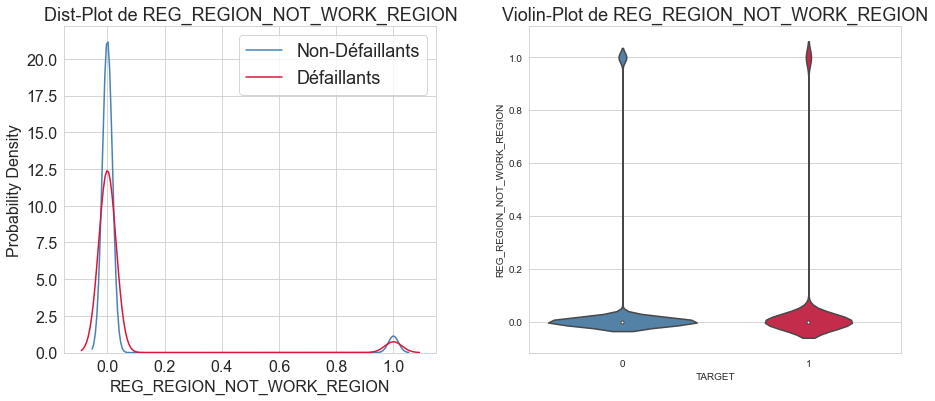

In [34]:
# Violinplot de REG_REGION_NOT_WORK_REGION
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'REG_REGION_NOT_WORK_REGION',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable LIVE_REGION_NOT_WORK_REGION**</span>

Indicateur si l'adresse de contact du demandeur ne correspond pas à l'adresse de travail au niveau de la région :
- **1** : adresses différents, 
- **0** : adresses identiques.

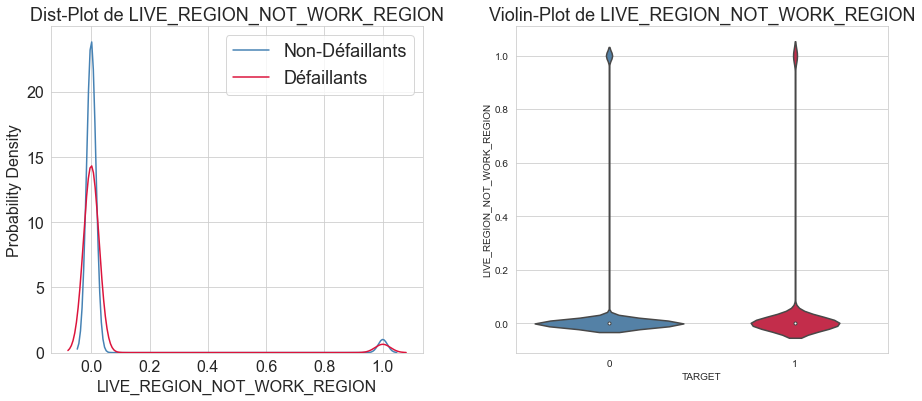

In [35]:
# Violinplot de LIVE_REGION_NOT_WORK_REGION
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LIVE_REGION_NOT_WORK_REGION',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable APARTMENTS_AVG**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la taille moyenne de l'appartement.

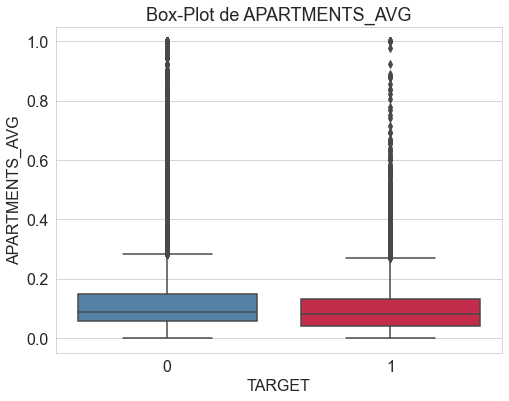

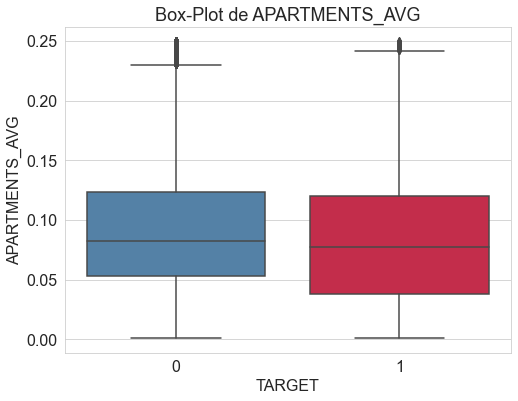

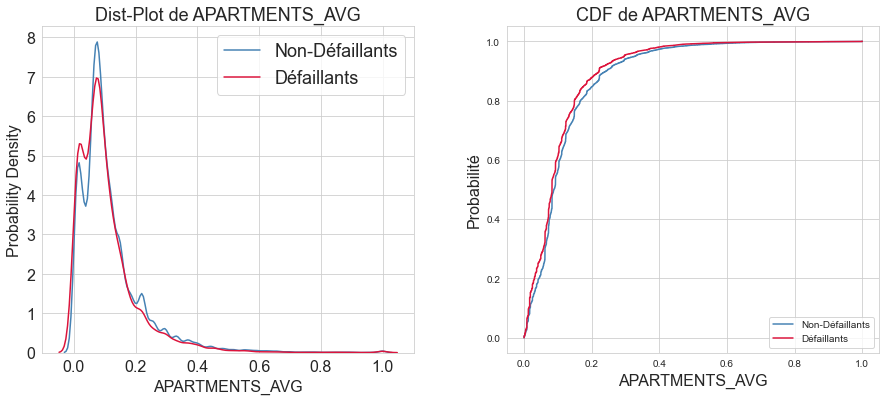

In [36]:
# Boxplot de APARTMENTS_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'APARTMENTS_AVG',
                                               plots=['box'],
                                               figsize=(8, 6))
# Zoom
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'APARTMENTS_AVG',
                                               plots=['box'],
                                               figsize=(8, 6),
                                               scale_limits=[0, 0.25])
# CDF
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'APARTMENTS_AVG',
                                               plots=['distplot', 'CDF'],
                                               figsize=(15, 6))

**Bilan**:
***
- Le boxplot montre une tendance la taille moyenne des appartements des défaillants est généralement inférieure à celle des non-défaillants.
- Les défaillants vivent dans des appartements de taille moyenne plus petite que les non-défaillants (cf graphique CDF).

Mais cette différence est peu importante et la variable ne sera pas très utile pour départager les demandeurs non-défaillants des défaillants.

<span style='background:PaleGreen'>**Variable APARTMENTS_MEDI**</span>

Informations normalisées sur l'immeuble où vit le demandeur du mode de l'appartement.

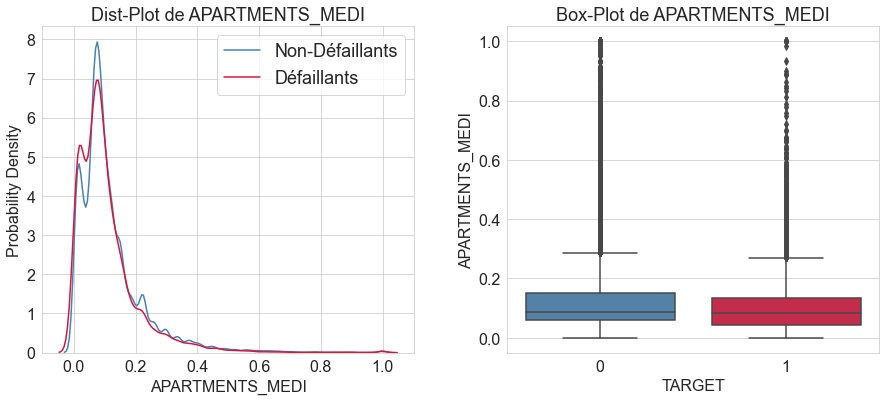

In [37]:
# Boxplot de APARTMENTS_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'APARTMENTS_MEDI',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Le boxplot montre une tendance le mode des appartements des défaillants est généralement inférieure à celle des non-défaillants.

Mais cette différence est peu importante et la variable ne sera pas très utile pour départager les demandeurs non-défaillants des défaillants.

<span style='background:PaleGreen'>**Variable APARTMENTS_MODE**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de l'appartement.

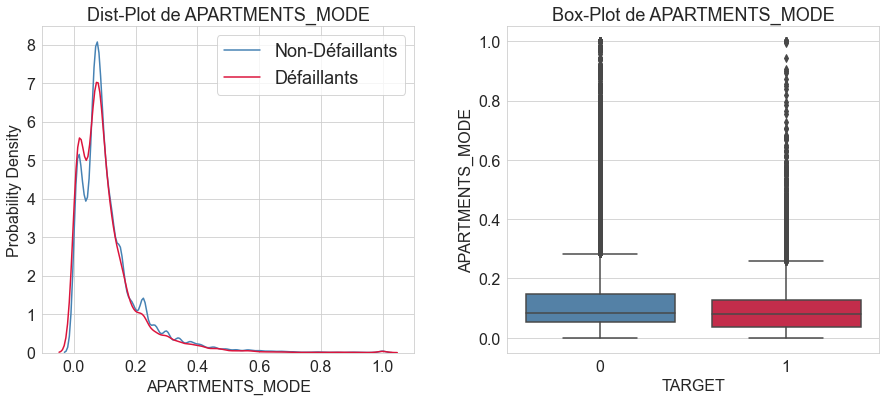

In [38]:
# Boxplot de APARTMENTS_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'APARTMENTS_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Le boxplot montre une tendance le mode des appartements des défaillants est généralement inférieure à celle des non-défaillants.

Mais cette différence est peu importante et la variable ne sera pas très utile pour départager les demandeurs non-défaillants des défaillants.

<span style='background:PaleGreen'>**Variable BASEMENTAREA_AVG**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la taille moyenne de la surface habitable.

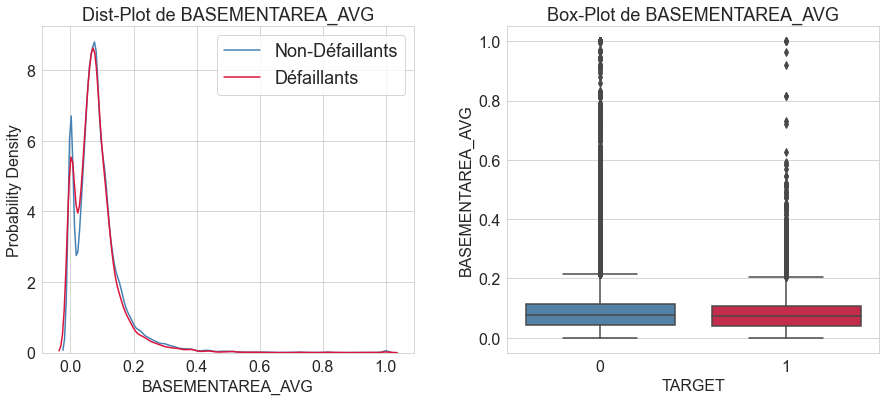

In [39]:
# Boxplot de BASEMENTAREA_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'BASEMENTAREA_AVG',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable BASEMENTAREA_MEDI**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de la surface du bâtiment.

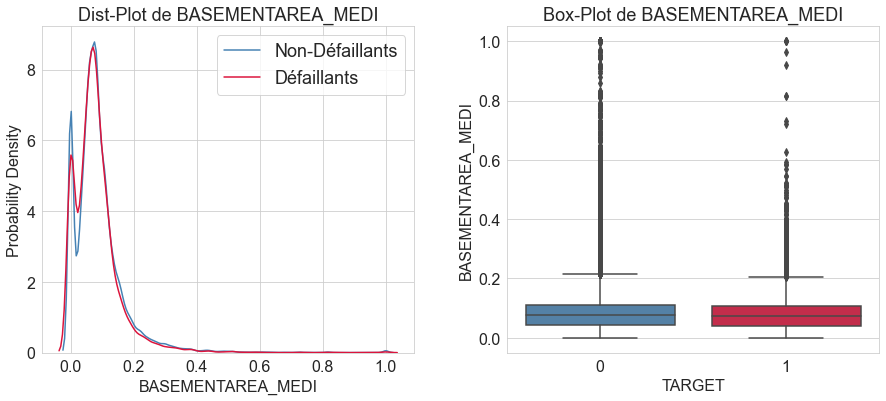

In [40]:
# Boxplot de BASEMENTAREA_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'BASEMENTAREA_MEDI',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable BASEMENTAREA_MODE**</span>

Informations normalisées sur l'immeuble où vit le demandeur du mode de la surface du bâtiment.

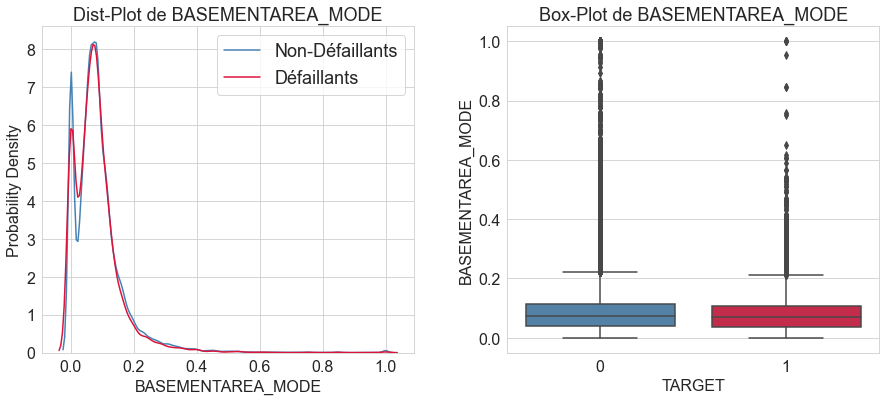

In [41]:
# Boxplot de BASEMENTAREA_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'BASEMENTAREA_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable YEARS_BEGINEXPLUATATION_AVG**</span>

Informations normalisées sur l'immeuble où vit le demandeur de l'âge moyen de début d'exploitation de l'immeuble.

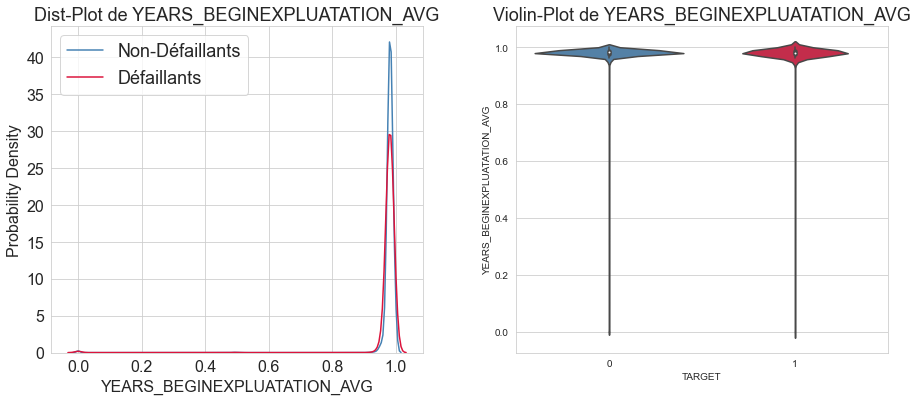

In [42]:
# Violinplot de YEARS_BEGINEXPLUATATION_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'YEARS_BEGINEXPLUATATION_AVG',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable YEARS_BEGINEXPLUATATION_MODE**</span>

Informations normalisées sur l'immeuble où vit le demandeur du mode de l'âge de début d'exploitation de l'immeuble.

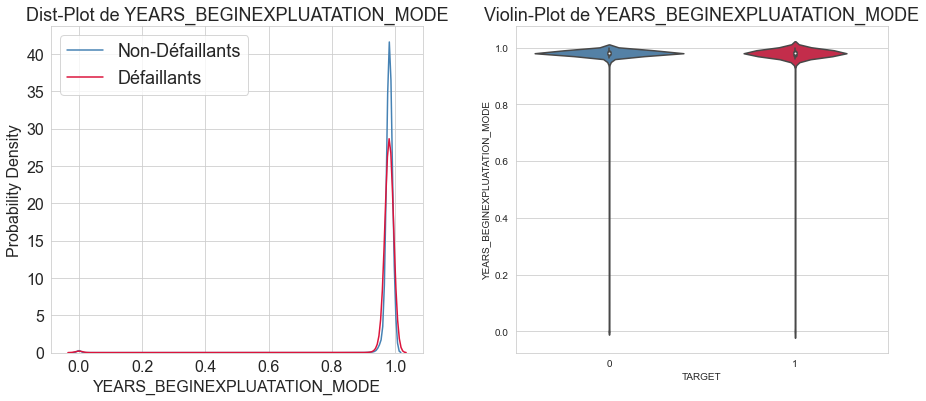

In [43]:
# Violinplot de YEARS_BEGINEXPLUATATION_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'YEARS_BEGINEXPLUATATION_MODE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable YEARS_BEGINEXPLUATATION_MEDI**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de l'âge de début d'exploitation de l'immeuble.

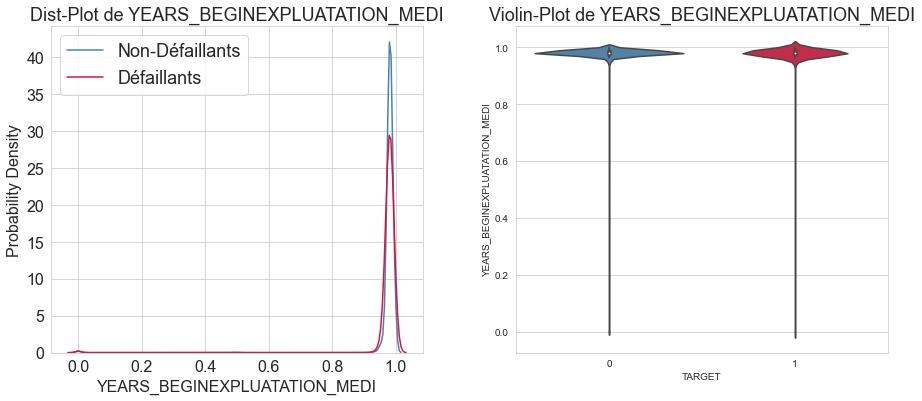

In [44]:
# Violinplot de YEARS_BEGINEXPLUATATION_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'YEARS_BEGINEXPLUATATION_MEDI',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable YEARS_BUILD_AVG**</span>

Informations normalisées sur l'immeuble où vit le demandeur de l'âge moyen de l'immeuble.

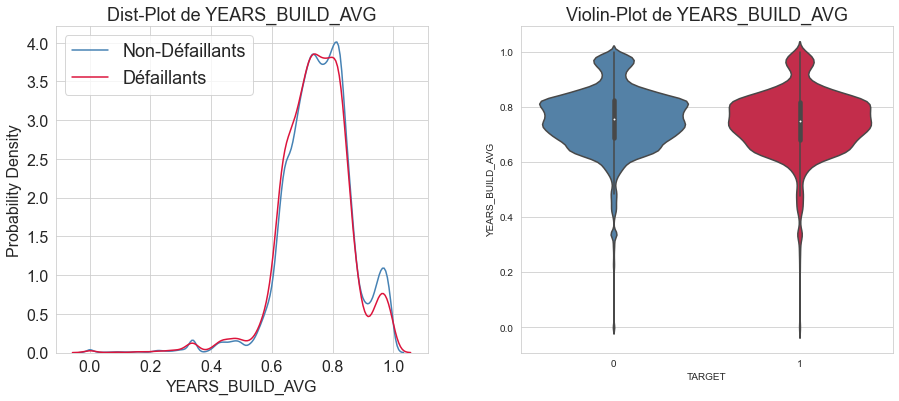

In [45]:
# Violinplot de YEARS_BUILD_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'YEARS_BUILD_AVG',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable YEARS_BUILD_MODE**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de l'âge de l'immeuble.

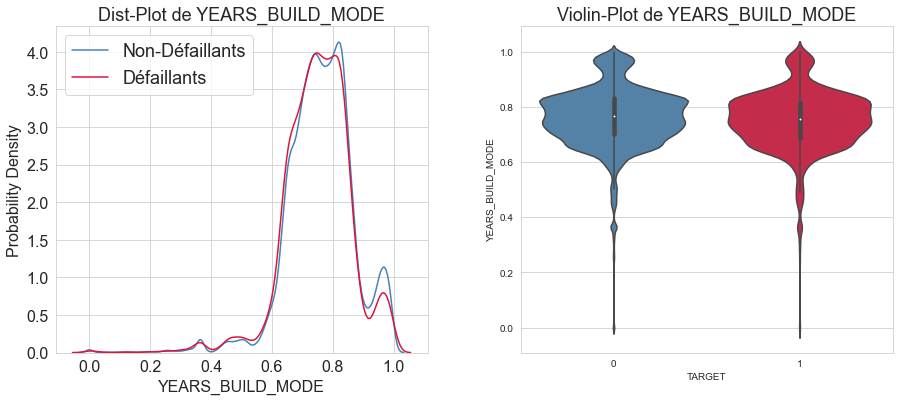

In [46]:
# Violinplot de YEARS_BUILD_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'YEARS_BUILD_MODE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable YEARS_BUILD_MEDI**</span>

Informations normalisées sur l'immeuble où vit le demandeur du mode de l'âge de l'immeuble.

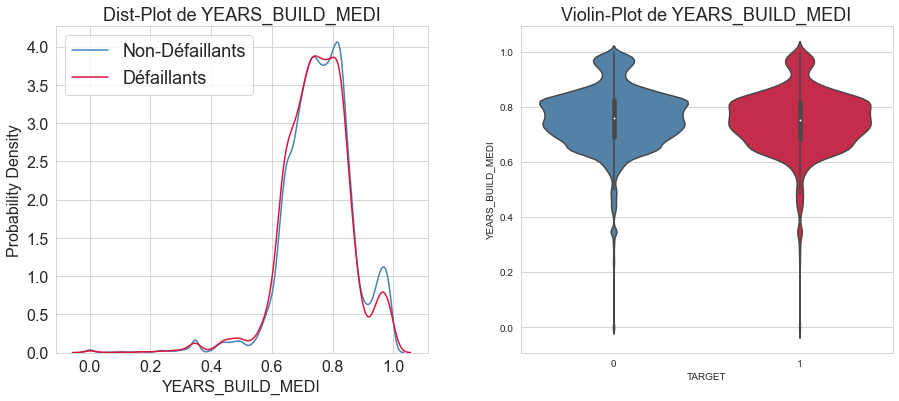

In [47]:
# Violinplot de YEARS_BUILD_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'YEARS_BUILD_MEDI',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable COMMONAREA_AVG**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la taille moyenne de la surface commune.

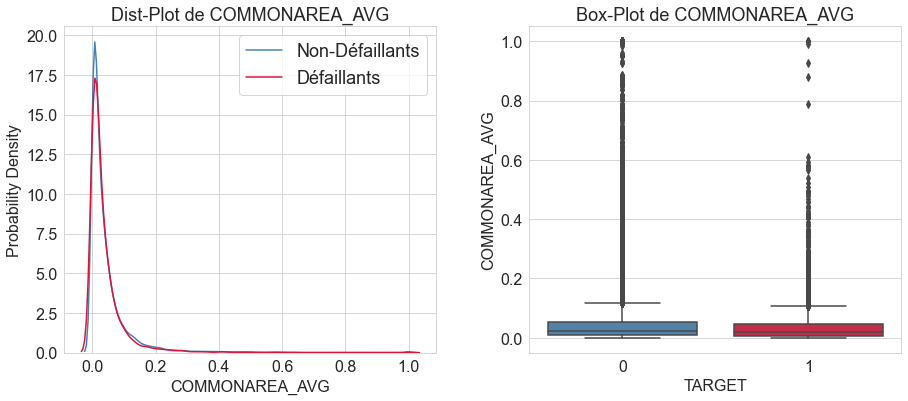

In [48]:
# Boxplot de COMMONAREA_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'COMMONAREA_AVG',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable COMMONAREA_MEDI**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de la surface commune.

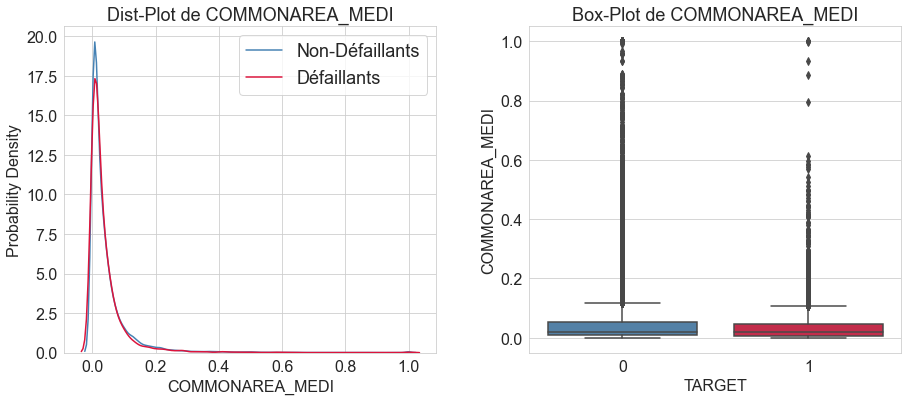

In [49]:
# Boxplot de COMMONAREA_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'COMMONAREA_MEDI',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable COMMONAREA_MODE**</span>

Informations normalisées sur l'immeuble où vit le demandeur du mode de la surface commune.

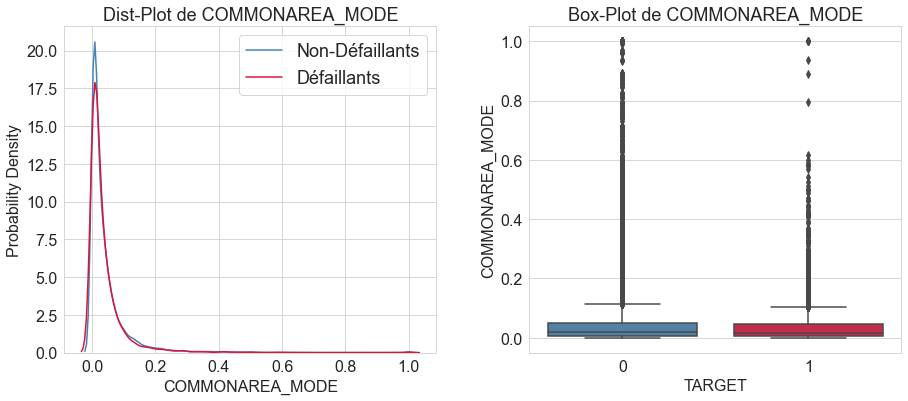

In [50]:
# Boxplot de COMMONAREA_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'COMMONAREA_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable ELEVATORS_AVG**</span>

Informations normalisées sur l'immeuble où vit le demandeur du nombre d'étages moyens.

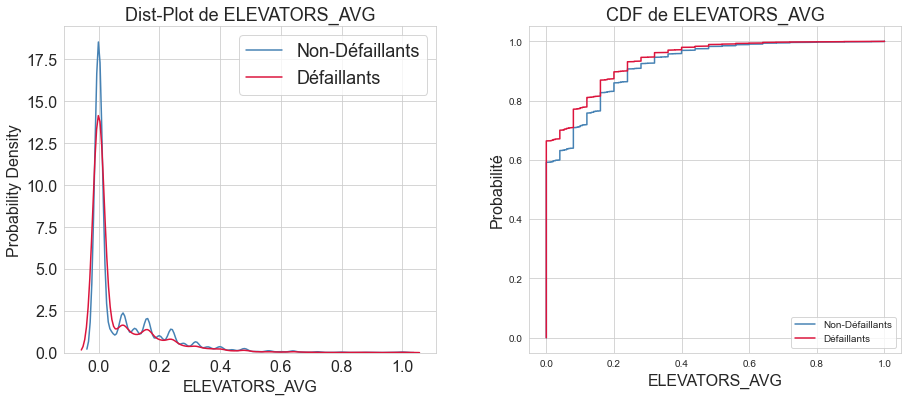

In [51]:
# CDF de ELEVATORS_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'ELEVATORS_AVG',
                                               plots=['distplot', 'CDF'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les demandeurs défaillants habitent des maisons ou appartements avec plus d'étages que les non-défaillants, mais cet écart est faible.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable ELEVATORS_MODE**</span>

Informations normalisées sur l'immeuble où vit le demandeur du mode du nombre d'étages.

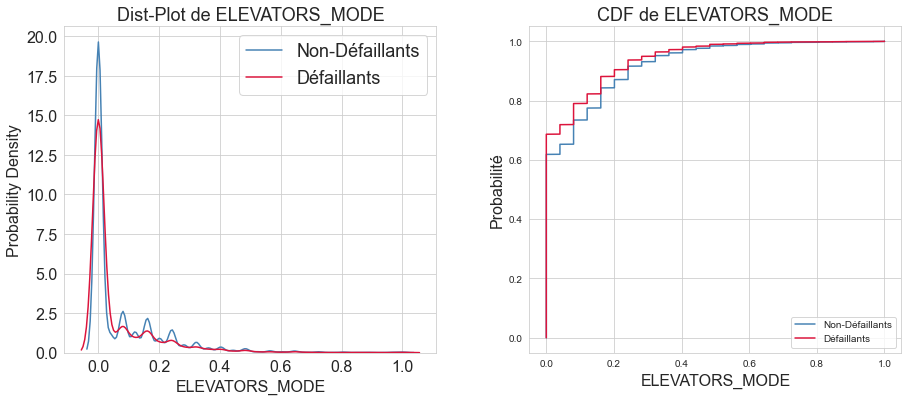

In [52]:
# CDF de ELEVATORS_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'ELEVATORS_MODE',
                                               plots=['distplot', 'CDF'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les demandeurs défaillants habitent des maisons ou appartements avec plus d'étages que les non-défaillants, mais cet écart est faible.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable ELEVATORS_MEDI**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la médiane du nombre d'étages.

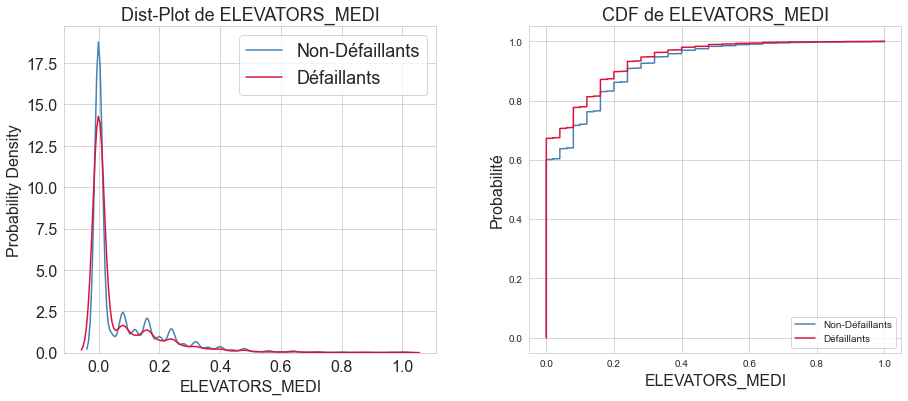

In [53]:
# CDF de ELEVATORS_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'ELEVATORS_MEDI',
                                               plots=['distplot', 'CDF'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les demandeurs défaillants habitent des maisons ou appartements avec plus d'étages que les non-défaillants, mais cet écart est faible.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable ENTRANCES_AVG**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la moyenne du nombre d'entrées.

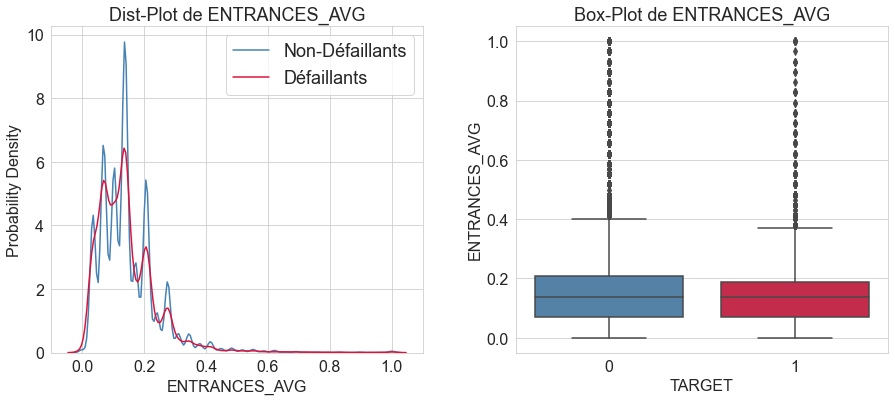

In [54]:
# Boxplot de ENTRANCES_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'ENTRANCES_AVG',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***

<span style='background:PaleGreen'>**Variable ENTRANCES_MODE**</span>

Informations normalisées sur l'immeuble où vit le demandeur du mode du nombre d'entrées.

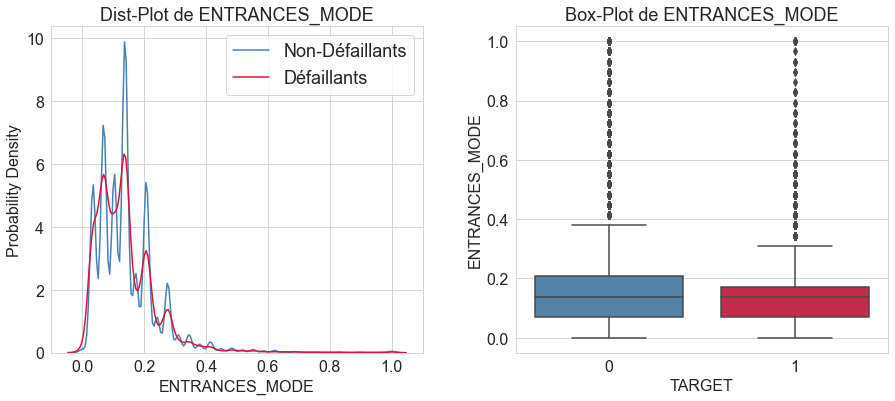

In [55]:
# Boxplot de ENTRANCES_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'ENTRANCES_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable ENTRANCES_MEDI**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la médiane du nombre d'entrées.

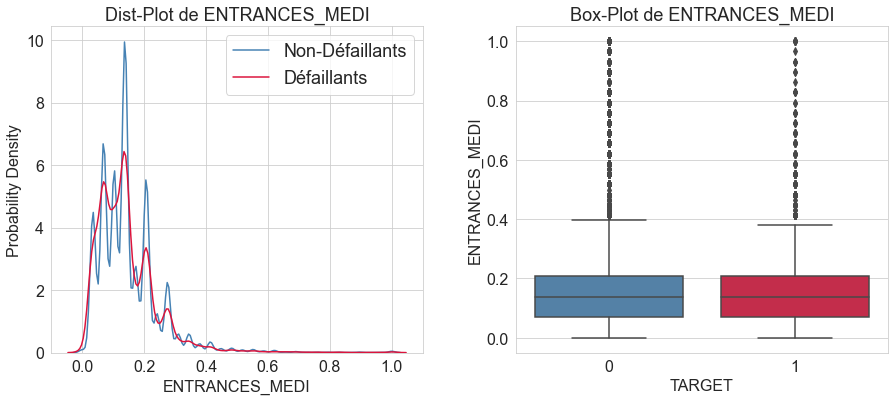

In [56]:
# Boxplot de ENTRANCES_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'ENTRANCES_MEDI',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable LANDAREA_AVG**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la taille moyenne de la surface du terrain.

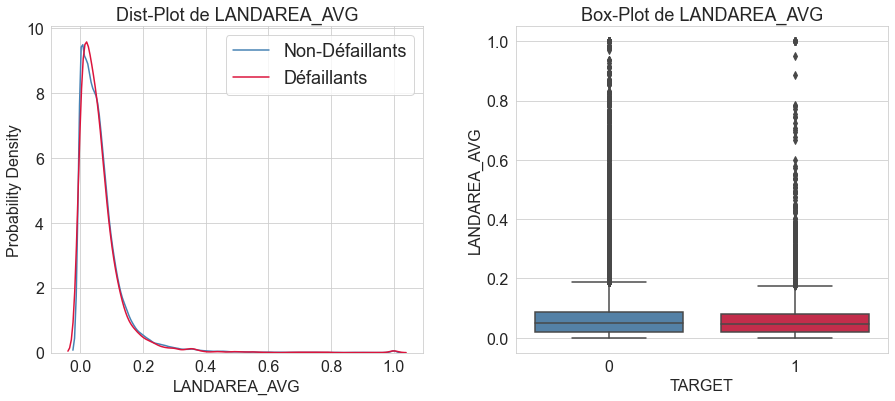

In [57]:
# Boxplot de LANDAREA_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LANDAREA_AVG',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable LANDAREA_MEDI**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de la surface du terrain.

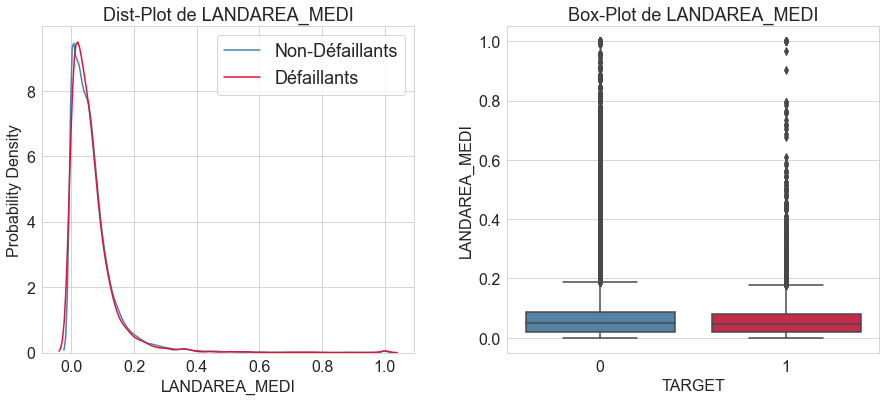

In [58]:
# Boxplot de LANDAREA_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LANDAREA_MEDI',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable LANDAREA_MODE**</span>

Informations normalisées sur l'immeuble où vit le demandeur du mode de la surface du terrain.

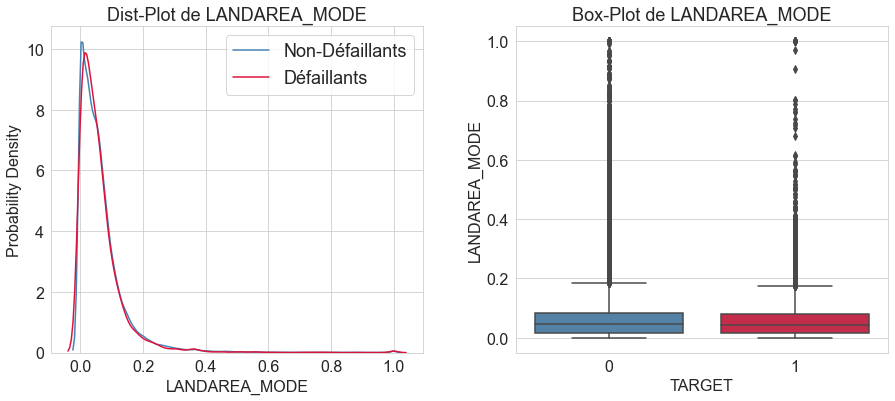

In [59]:
# Boxplot de LANDAREA_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LANDAREA_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable LIVINGAPARTMENTS_AVG**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la taille moyenne de l'appartement.

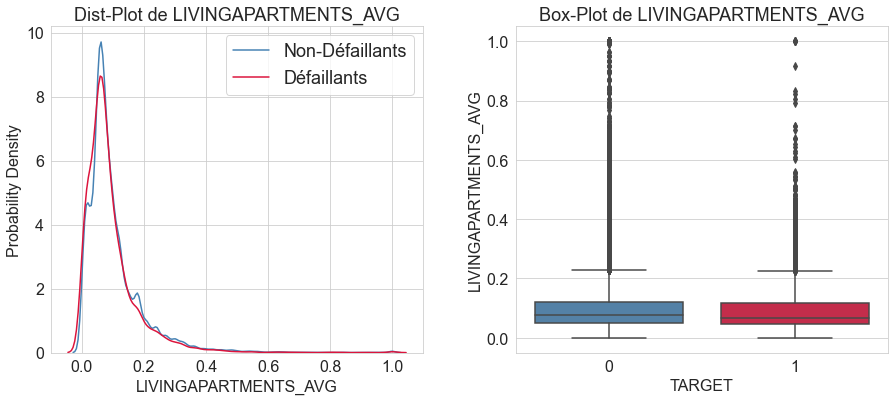

In [60]:
# Boxplot de LIVINGAPARTMENTS_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LIVINGAPARTMENTS_AVG',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable LIVINGAPARTMENTS_MODE**</span>

Informations normalisées sur l'immeuble où vit le demandeur du mode de l'appartement.

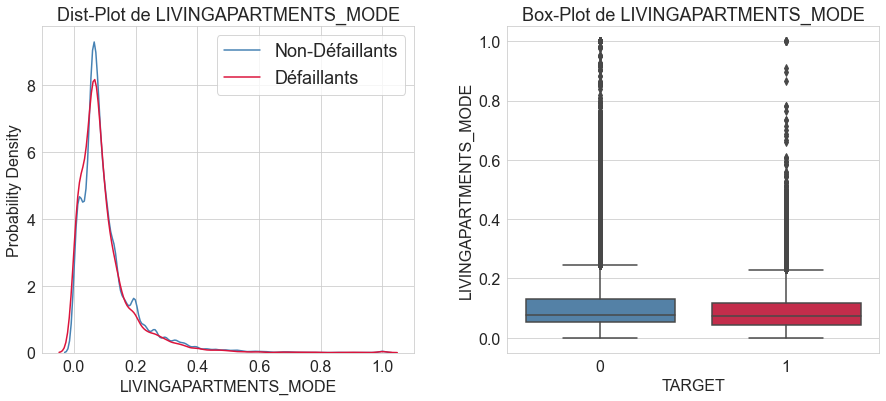

In [61]:
# Boxplot de LIVINGAPARTMENTS_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LIVINGAPARTMENTS_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable LIVINGAPARTMENTS_MEDI**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de l'appartement.

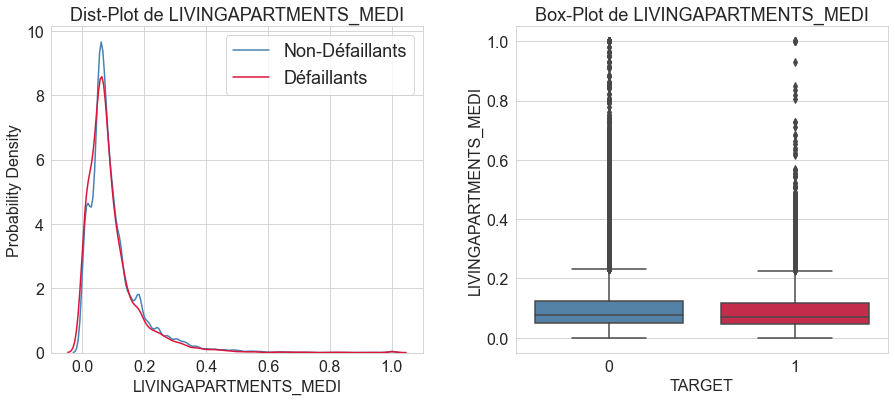

In [62]:
# Boxplot de LIVINGAPARTMENTS_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LIVINGAPARTMENTS_MEDI',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable LIVINGAREA_AVG**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la taille moyenne de la surface habitable de l'appartement.

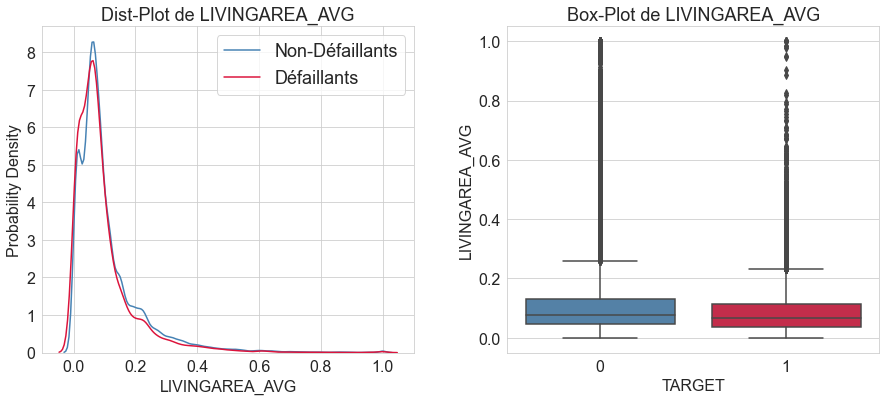

In [63]:
# Boxplot de LIVINGAREA_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LIVINGAREA_AVG',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.


Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable LIVINGAREA_MEDI**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de la surface habitable de l'appartement.

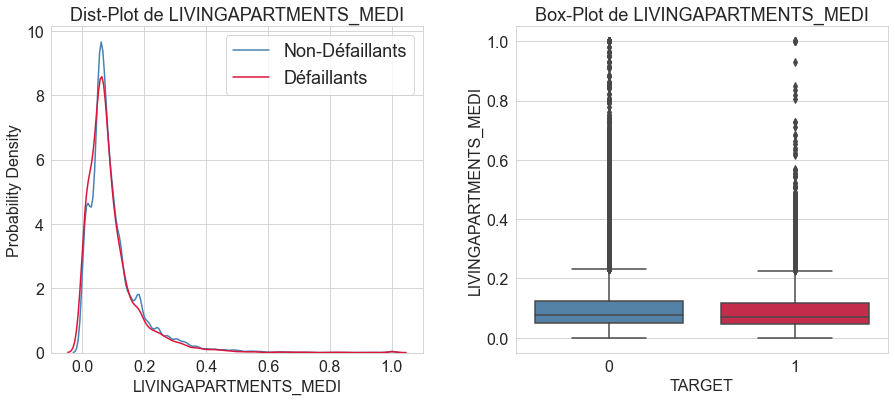

In [64]:
# Boxplot de LIVINGAPARTMENTS_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LIVINGAPARTMENTS_MEDI',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.**Bilan**:
***

<span style='background:PaleGreen'>**Variable LIVINGAREA_MODE**</span>

Informations normalisées sur l'immeuble où vit le demandeur du mode de la surface habitable de l'appartement.

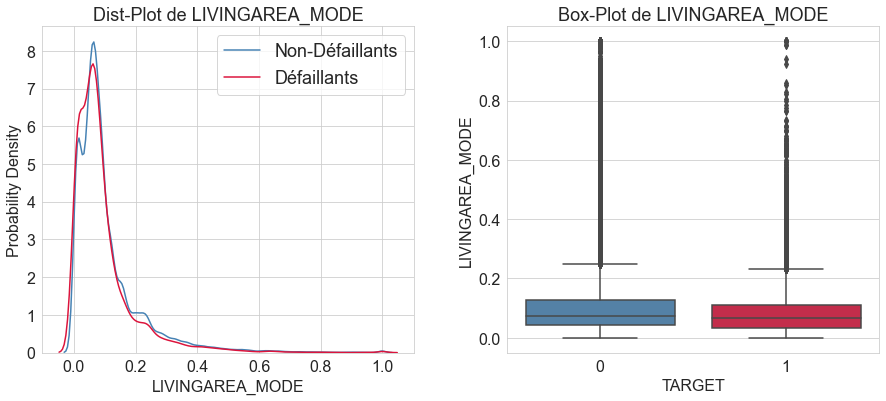

In [65]:
# Boxplot de LIVINGAREA_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LIVINGAREA_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable NONLIVINGAPARTMENTS_AVG**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la taille moyenne de la surface commune de l'appartement.

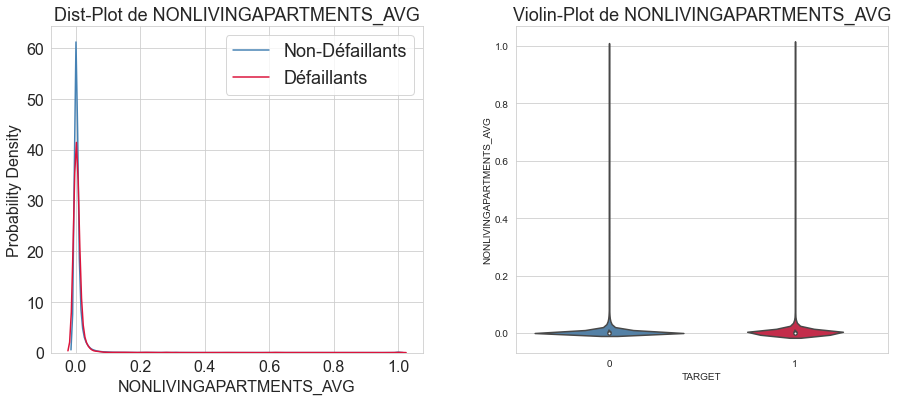

In [66]:
# Violinplot de NONLIVINGAPARTMENTS_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'NONLIVINGAPARTMENTS_AVG',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable NONLIVINGAPARTMENTS_MODE**</span>

Informations normalisées sur l'immeuble où vit le demandeur du mode de la surface commune de l'appartement.

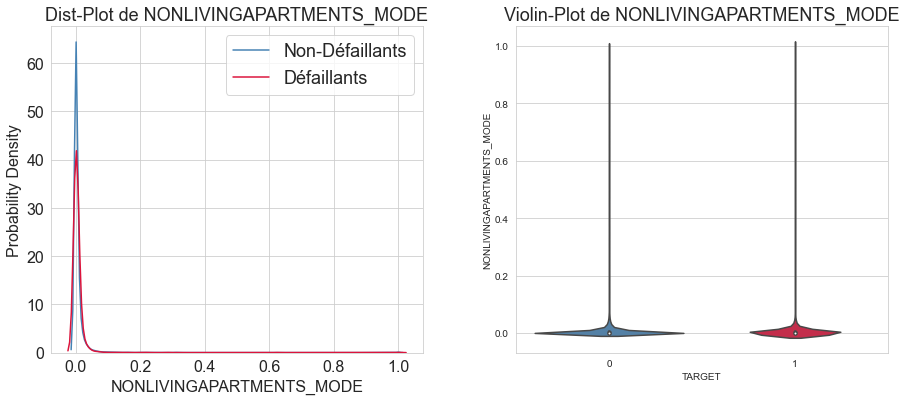

In [67]:
# Violinplot de NONLIVINGAPARTMENTS_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'NONLIVINGAPARTMENTS_MODE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable NONLIVINGAPARTMENTS_MEDI**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de la surface commune de l'appartement.

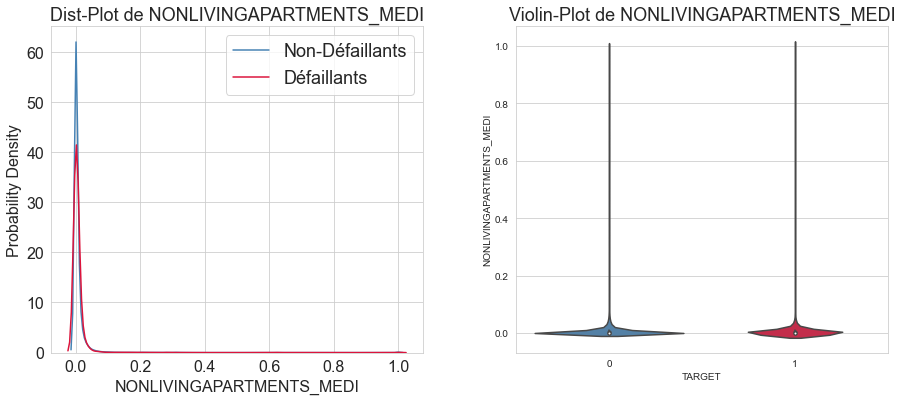

In [68]:
# Violinplot de NONLIVINGAPARTMENTS_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'NONLIVINGAPARTMENTS_MEDI',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable NONLIVINGAREA_AVG**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la moyenne de la surface habitable de l'appartement.

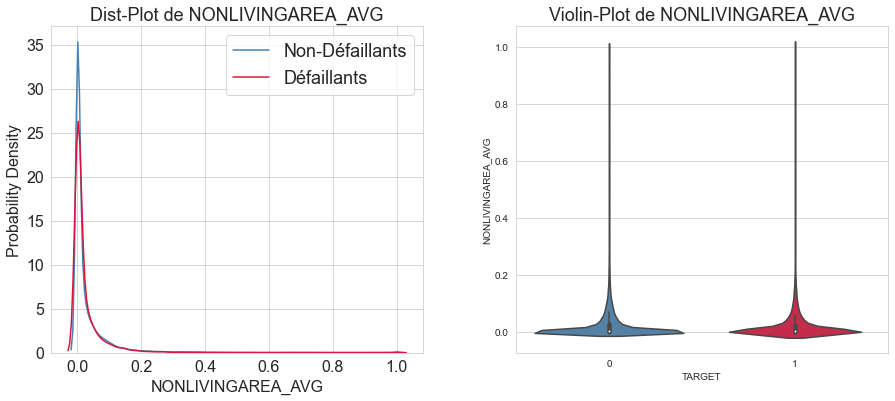

In [69]:
# Violinplot de NONLIVINGAREA_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'NONLIVINGAREA_AVG',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable NONLIVINGAREA_MODE**</span>

Informations normalisées sur l'immeuble où vit le demandeur du mode de la surface habitable de l'appartement.

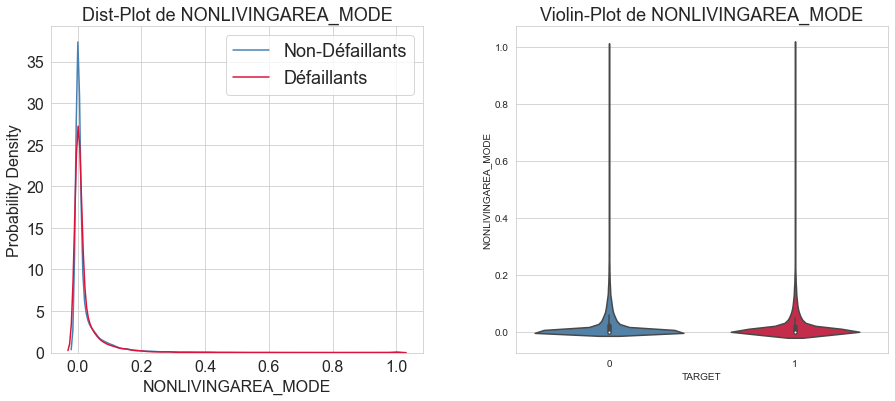

In [70]:
# Violinplot de NONLIVINGAREA_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'NONLIVINGAREA_MODE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable NONLIVINGAREA_MEDI**</span>

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de la surface habitable de l'appartement.

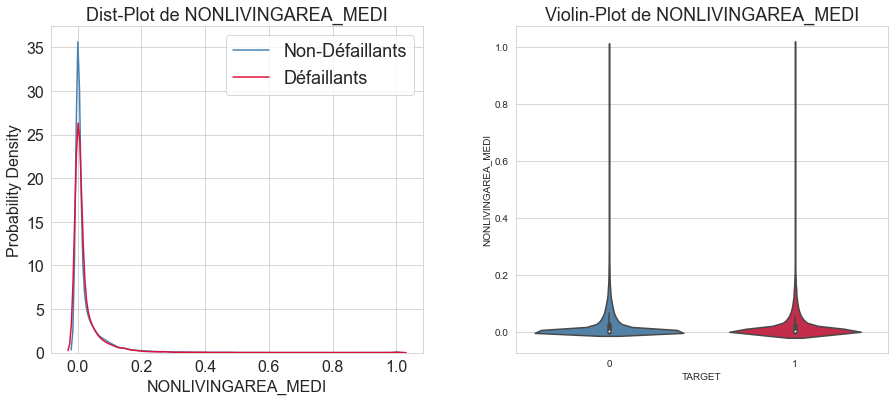

In [71]:
# Violinplot de NONLIVINGAREA_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'NONLIVINGAREA_MEDI',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable TOTALAREA_MODE**</span>

Informations normalisées sur l'immeuble où vit le demandeur du mode de la surface totale.

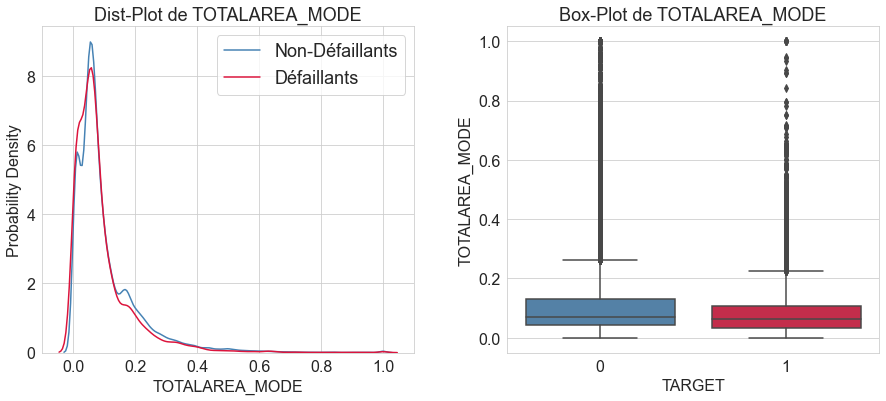

In [72]:
# Boxplot de TOTALAREA_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'TOTALAREA_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable OBS_30_CNT_SOCIAL_CIRCLE**</span>

Combien d'observations de l'environnement social du demandeurs avec des défauts observables de 30 DPD (jours de retard) ?

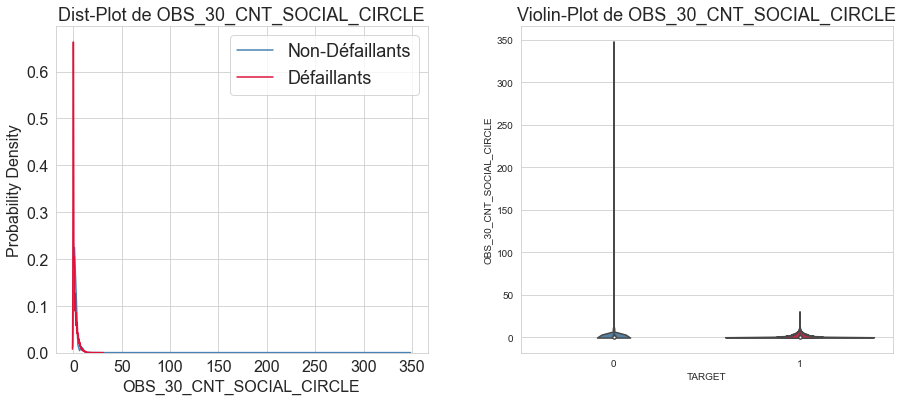

In [73]:
# Violinplot de OBS_30_CNT_SOCIAL_CIRCLE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'OBS_30_CNT_SOCIAL_CIRCLE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable DEF_30_CNT_SOCIAL_CIRCLE**</span>

Combien d'observations de l'environnement social du demandeur ont fait l'objet d'un défaut de paiement à 30 DPD (jours d'arriérés) ?

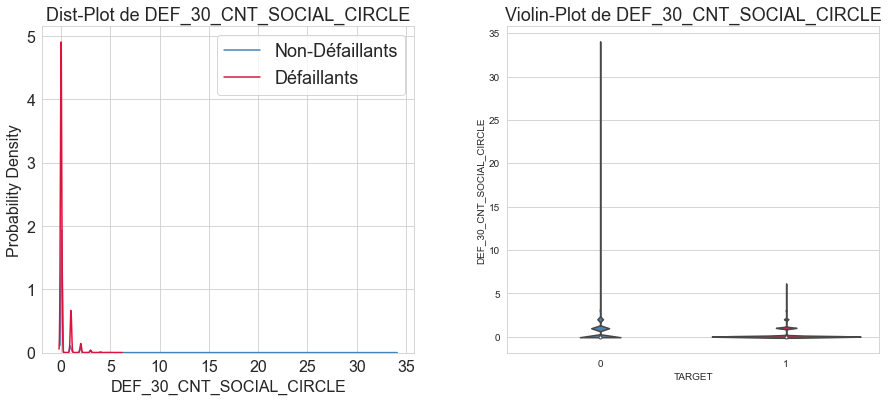

In [74]:
# Violinplot de DEF_30_CNT_SOCIAL_CIRCLE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'DEF_30_CNT_SOCIAL_CIRCLE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.**Bilan**:
***

<span style='background:PaleGreen'>**Variable OBS_60_CNT_SOCIAL_CIRCLE**</span>

Combien d'observations de l'environnement social du demandeur avec des défauts observables de 60 DPD (jours de retard) ?

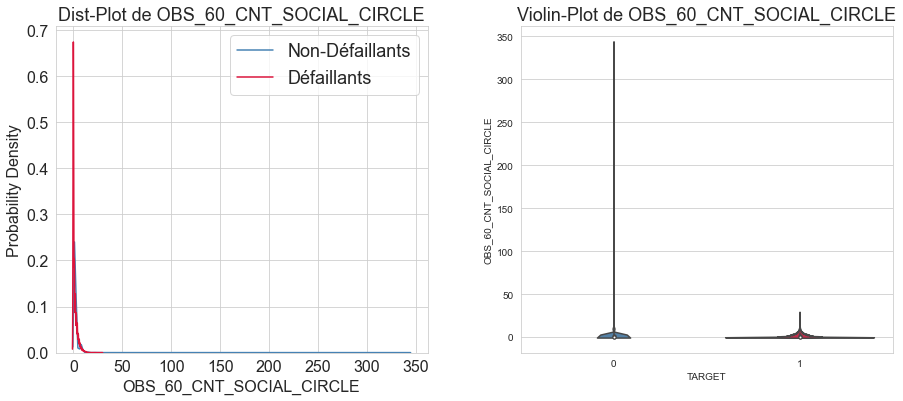

In [75]:
# Violinplot de OBS_60_CNT_SOCIAL_CIRCLE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'OBS_60_CNT_SOCIAL_CIRCLE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable DEF_60_CNT_SOCIAL_CIRCLE**</span>

Combien d'observations de l'environnement social du demandeur ont fait l'objet d'un défaut de paiement de 60 (jours d'arriérés) DPD.

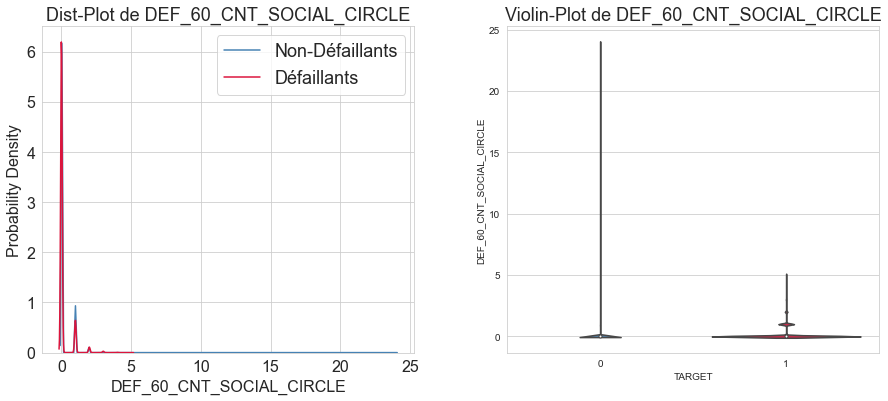

In [76]:
# Violinplot de DEF_60_CNT_SOCIAL_CIRCLE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'DEF_60_CNT_SOCIAL_CIRCLE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les défaillants ont plus de défaut de paiement de jours d'arriérés.

Cette variable pourra être utilisée pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable DAYS_LAST_PHONE_CHANGE**</span>

Combien de jours avant la demande le demaneur a-t-il changé de téléphone ?

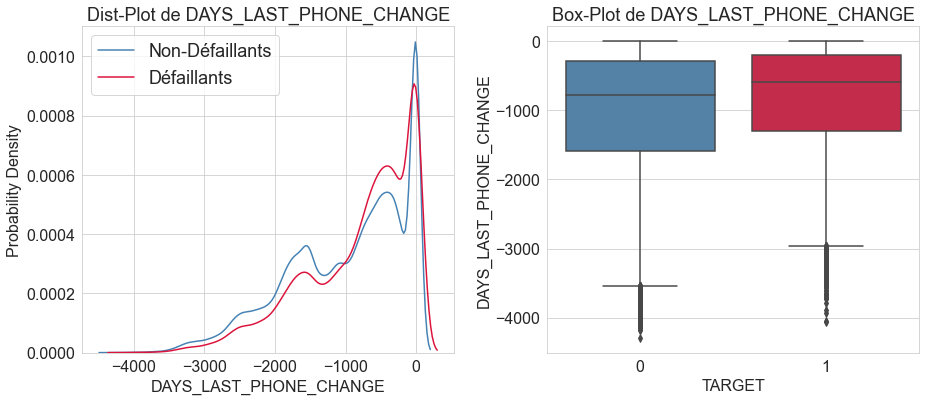

In [77]:
# Boxplot de DAYS_LAST_PHONE_CHANGE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'DAYS_LAST_PHONE_CHANGE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les défaillants ont changé de téléphone plus récemment que les non-défaillants, tous les quantiles sont plus hauts pour les défaillants que les non-défaillants.

Cette variable pourra être utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable AMT_REQ_CREDIT_BUREAU_HOUR**</span>

Nombre de demandes de renseignements sur le demandeurs adressées au Bureau de crédit une heure avant la demande.

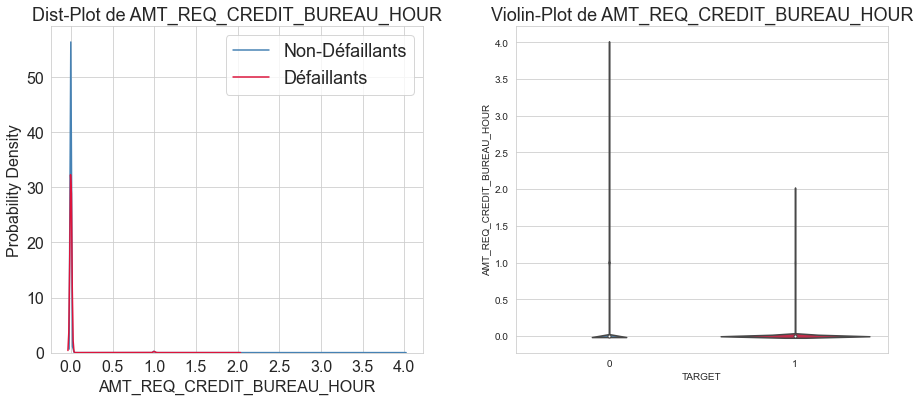

In [78]:
# Violinplot de AMT_REQ_CREDIT_BUREAU_HOUR
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_REQ_CREDIT_BUREAU_HOUR',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable AMT_REQ_CREDIT_BUREAU_DAY**</span>

Nombre de demandes de renseignements au Bureau de crédit concernant le demandeur un jour avant la demande (sauf une heure avant la demande).

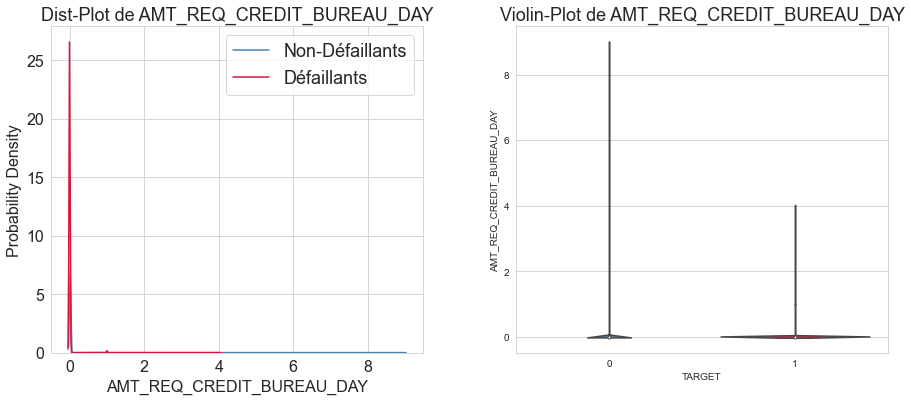

In [79]:
# Violinplot de AMT_REQ_CREDIT_BUREAU_DAY
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_REQ_CREDIT_BUREAU_DAY',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable AMT_REQ_CREDIT_BUREAU_WEEK**</span>

Nombre de demandes de renseignements au Bureau de crédit concernant le demandeur une semaine avant la demande (à l'exception du jour précédant la demande).

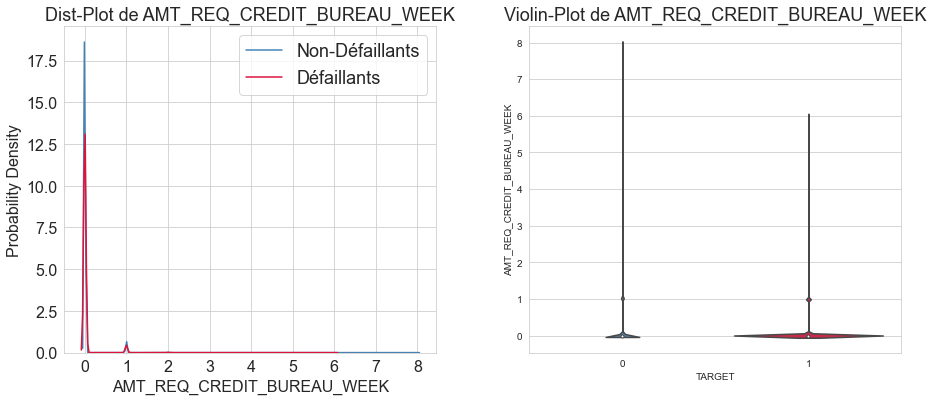

In [80]:
# Violinplot de AMT_REQ_CREDIT_BUREAU_WEEK
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_REQ_CREDIT_BUREAU_WEEK',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable AMT_REQ_CREDIT_BUREAU_MON**</span>

Nombre de demandes de renseignements au Bureau de crédit concernant le demandeur un mois avant la demande (sauf une semaine avant la demande).

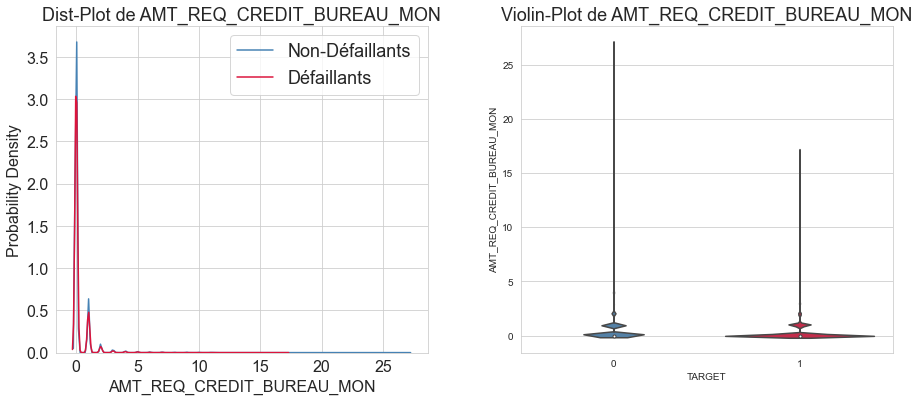

In [81]:
# Violinplot de AMT_REQ_CREDIT_BUREAU_MON
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_REQ_CREDIT_BUREAU_MON',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable AMT_REQ_CREDIT_BUREAU_QRT**</span>

Nombre de demandes de renseignements au Bureau de crédit concernant le demandeur 3 mois avant la demande (sauf un mois avant la demande).

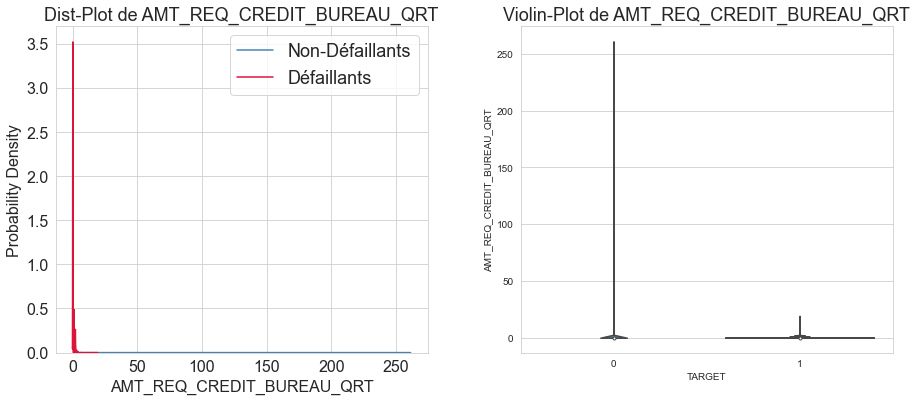

In [82]:
# Violinplot de AMT_REQ_CREDIT_BUREAU_QRT
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_REQ_CREDIT_BUREAU_QRT',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

<span style='background:PaleGreen'>**Variable AMT_REQ_CREDIT_BUREAU_YEAR**</span>

Nombre de demandes de renseignements au Bureau de crédit concernant le demandeur par jour et par an (à l'exception des 3 derniers mois avant la demande).,

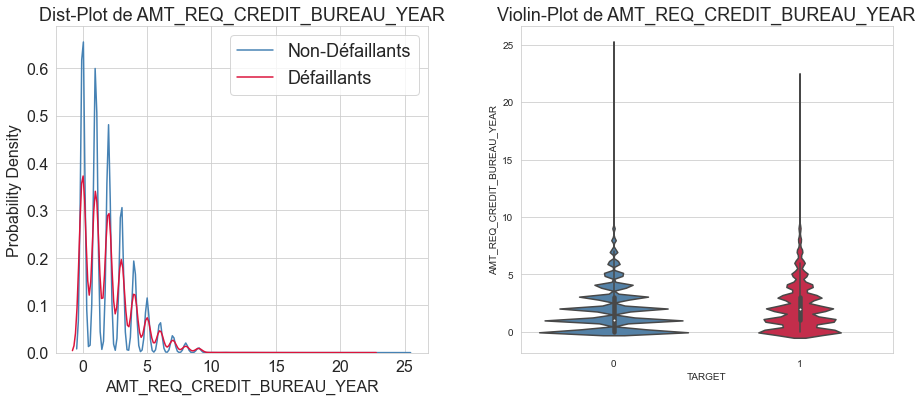

In [83]:
# Violinplot de AMT_REQ_CREDIT_BUREAU_YEAR
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_REQ_CREDIT_BUREAU_YEAR',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

#### <span style='background:Moccasin'>2.2.3. Analyse exploratoire multivariée</span>

<span style='background:PaleGreen'>**Corrélation entre les variables catégorielles**</span>

**Matrice Phi-K**

- Nous allons tracer une carte thermique des valeurs du [coefficient de corrélation Phi-K](https://lemakistatheux.wordpress.com/2013/09/01/le-coefficient-phi-2/) entre les 2 variables.
- Le [coefficient Phi-K](https://en.wikipedia.org/wiki/Phi_coefficient) est similaire au coefficient de corrélation sauf qu'il peut être utilisé avec une paire de caractéristiques catégorielles pour vérifier si une variable montre une sorte d'association avec l'autre variable catégorielle. Sa valeur maximale peut être de 1, ce qui indique une association maximale entre deux variables catégorielles.

-------------------------------------------------------------------------------


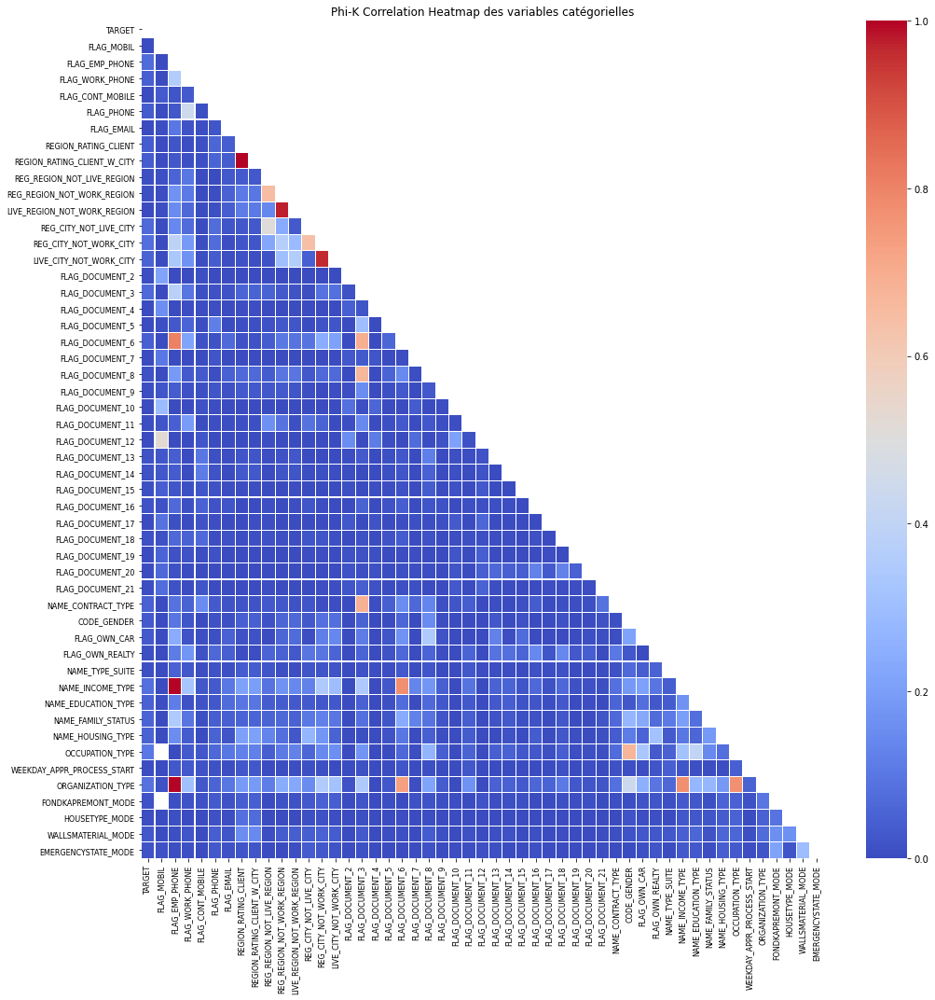

-------------------------------------------------------------------------------
Les catégories présentant les valeurs les plus élevées de la corrélation Phi-K avec la variable cible sont les suivantes :


Variable,Phik-Correlation
OCCUPATION_TYPE,0.1028
ORGANIZATION_TYPE,0.0892
NAME_INCOME_TYPE,0.0848
REG_CITY_NOT_WORK_CITY,0.0799
FLAG_EMP_PHONE,0.0721
REG_CITY_NOT_LIVE_CITY,0.0696
FLAG_DOCUMENT_3,0.0695
NAME_FAMILY_STATUS,0.0560
NAME_HOUSING_TYPE,0.0511
LIVE_CITY_NOT_WORK_CITY,0.0510


-------------------------------------------------------------------------------


In [17]:
categorical_columns = ['TARGET', 'FLAG_MOBIL', 'FLAG_EMP_PHONE',
                       'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
                       'FLAG_EMAIL', 'REGION_RATING_CLIENT',
                       'REGION_RATING_CLIENT_W_CITY',
                       'REG_REGION_NOT_LIVE_REGION',
                       'REG_REGION_NOT_WORK_REGION',
                       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
                       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY'] \
    + ['FLAG_DOCUMENT_' + str(i) for i in range(2, 22)] \
    + application_train.dtypes[application_train.dtypes == 'object'] \
    .index.tolist()
eda_kernel_fonctions.plot_phik_matrix(application_train,
                                      categorical_columns,
                                      figsize=(15, 15), fontsize=8,
                                      cmap='coolwarm')

**Bilan** :
***
- La carte thermique de la corrélation Phi-K ci-dessus montre que la plupart des variables catégorielles ne sont pas corrélées entre elles, mais que certaines d'entre elles présentent une forte corrélation.
- Certaines des paires de catégories fortement corrélées sont :
    - REGION_RATING_CLIENT_W_CITY et REGION_RATING_CLIENT - Ceci est compréhensible car elles racontent plus ou moins une histoire similaire.
    - LIVE_REGION_NOT_WORK_REGION et REG_REGION_NOT_WORK_REGION
    - NAME_INCOME_TYPE, ORGANIZATION_TYPE et FLAG_EMP_PHONE
- Nous pouvons également observer une certaine corrélation entre le type d'organisation et le type de revenu d'un demandeur. 
- De même, nous constatons une corrélation entre le type de profession et le type d'organisation.
- Nous constatons que les catégories :
    - OCCUPATION_TYPE,
    - ORGANIZATION_TYPE,
    - NAME_INCOME_TYPE,
    - et REG_CITY_NOT_WORK_CITY
    sont parmi les catégories les plus fortement corrélées avec la variable TARGET. Elles peuvent être importantes dans la tâche de classification et nécessiteraient une analyse EDA plus approfondie.

<span style='background:PaleGreen'>**Corrélation entre les variables numériques**</span>

**Matrice de corrélation**

- Nous allons tracer une carte thermique de la corrélation de chaque variable numérique par rapport aux autres variables. 
- Nous avons exclu la variable SK_ID_CURR, car elle n'est pas pertinente.
- Cette carte thermique nous permettra d'identifier les variables numériques fortement corrélées et nous aidera également à identifier les variable fortement corrélées avec la variable cible.

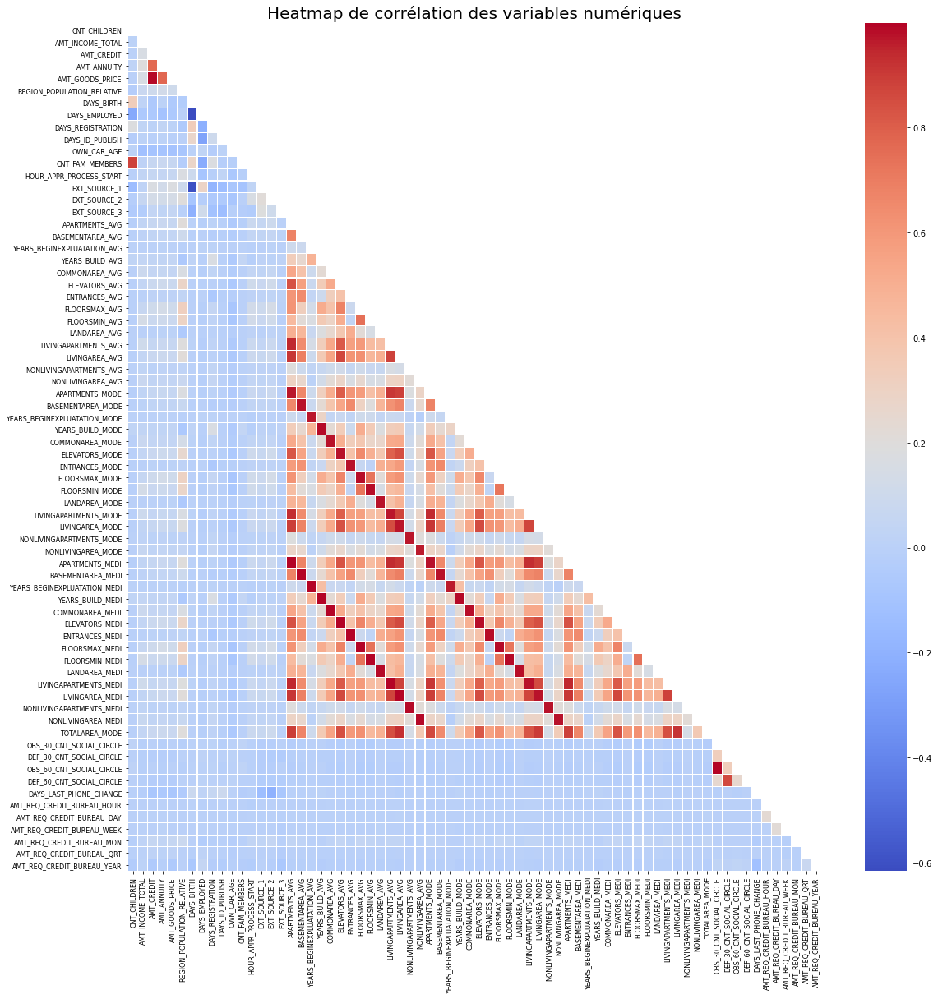

In [18]:
columns_to_drop = ['SK_ID_CURR'] + list(set(categorical_columns)
                                        - set(['TARGET']))
corr_mat = eda_kernel_fonctions.correlation_matrix(application_train,
                                                   columns_to_drop,
                                                   figsize=(17, 17),
                                                   fontsize=8,
                                                   cmap='coolwarm')
corr_mat.plot_correlation_matrix()

In [60]:
# Voir les colonnes supérieures avec la plus haute corrélation phik avec
# la variable cible dans la table application_train
top_corr_target_df = corr_mat.target_top_corr()
print("-" * 79)
titre1 = 'Les variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print("-"*79)

Column Name,Phik-Correlation
EXT_SOURCE_3,0.2477
EXT_SOURCE_1,0.2178
EXT_SOURCE_2,0.2140
DAYS_BIRTH,0.1024
DAYS_LAST_PHONE_CHANGE,0.0732
DAYS_EMPLOYED,0.0721
DAYS_ID_PUBLISH,0.0678
AMT_GOODS_PRICE,0.0591
FLOORSMAX_AVG,0.0588
FLOORSMAX_MEDI,0.0586


**Bilan** :
***
- La carte thermique montre bien la valeur ou le niveau de corrélation que chaque variable particulière a avec toutes les autres caractéristiques.
- On peut observer que la plupart de la carte thermique contient une couleur bleue, ce qui indique une très faible valeur de corrélation. Cela implique que la plupart des caractéristiques ne sont effectivement pas corrélées aux autres.
- Cependant, nous pouvons voir des teintes contrastées au milieu de la carte thermique. Ces nuances représentent une valeur élevée de corrélation entre les caractéristiques. Ce sont les caractéristiques qui sont liées aux statistiques des appartements.
- Si nous regardons les variables de l'application_train, nous pouvons clairement voir que les statistiques des appartements sont données en termes de Moyenne, Médiane et Mode, donc on peut s'attendre à ce que la moyenne, la médiane et le mode soient corrélés entre eux. Il convient également de noter que les variables d'une catégorie particulière, par exemple la moyenne, sont également corrélées avec d'autres variables moyennes, telles que le nombre d'ascenseurs, la surface habitable, la surface non habitable, la surface du sous-sol, etc.
- Nous constatons également une forte corrélation entre :
    - AMT_GOODS_PRICE et AMT_CREDIT, 
    - et entre DAYS_EMPLOYED et DAYS_BIRTH.
- Nous ne voulons pas de variables fortement corrélées car elles augmentent la complexité temporelle du modèle sans lui apporter beaucoup de valeur. Par conséquent, nous supprimons les variables intercorrélées.
- Parmi toutes les variables, nous constatons une corrélation élevée pour les variables EXT_SOURCE par rapport à la variable cible. Celles-ci peuvent être importantes pour notre tâche de classification.

### <span style='background:PowderBlue'>2.3. Fichier application_test.csv</span>

#### <span style='background:Moccasin'>2.3.1. Description/statistiques</span>

<span style='background:PaleGreen'>**Description**</span>

- Le fichier **application_test.csv** est constituée de **données statiques relatives aux emprunteurs sans les étiquettes**. 
- Chaque ligne représente une demande de prêt.
- Le dataframe application_test.csv contient l'ensemble de données de test, et est similaire à l'application_train.csv, sauf que la colonne TARGET a été omise, qui doit être prédite à l'aide de modèles prédictifs statistiques et d'apprentissage automatique.

<span style='background:PaleGreen'>**Compréhension des variables**</span>

In [9]:
df_var_appli_test = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'application_{train|test}.csv']
df_var_appli_test.style.hide_index()

Table,Row,Description,Special
application_{train|test}.csv,SK_ID_CURR,ID du prêt dans notre échantillon,nan
application_{train|test}.csv,TARGET,Variable cible (1 - client ayant des difficultés de paiement : il/elle a eu un retard de paiement de plus de X jours sur au moins une des Y premières échéances du prêt dans notre échantillon OU 0 - tous les autres cas.),nan
application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification si le prêt est cash ou revolving,nan
application_{train|test}.csv,CODE_GENDER,Sexe du client,nan
application_{train|test}.csv,FLAG_OWN_CAR,Indicateur si le client possède une voiture,nan
application_{train|test}.csv,FLAG_OWN_REALTY,Indicateur si le client possède une maison ou un appartement,nan
application_{train|test}.csv,CNT_CHILDREN,Nombre d'enfants du client,nan
application_{train|test}.csv,AMT_INCOME_TOTAL,Revenu du client,nan
application_{train|test}.csv,AMT_CREDIT,Montant du crédit du prêt,nan
application_{train|test}.csv,AMT_ANNUITY,Annuité de prêt,nan


<span style='background:PaleGreen'>**Statistiques**</span>

In [10]:
eda_kernel_fonctions.afficher_stats_basic(application_test)

-------------------------------------------------------------------------------
Le jeu de données contient 48744 lignes et 121 variables.
-------------------------------------------------------------------------------
Numbre de valeurs dupliquées dans application_train : 0
-------------------------------------------------------------------------------
Contenu des 3 premières lignes :


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.0188,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.7526,0.7897,0.1595,0.066,0.059,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.059,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.0358,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.5650,0.2917,0.4330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.0191,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.6998,0.6110,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0


-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_CURR                        int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OWN_CAR_AGE                     float64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64
FLAG_CONT_MOBILE                  int64


,Nombre par type de variable,% des types de variable
float64,65,53.7200
int64,40,33.0600
object,16,13.2200


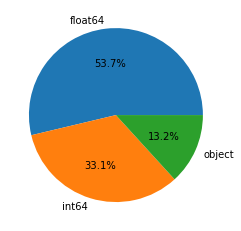

In [11]:
# Types des variables
outils_data.get_types_variables(application_test, True, True, True)

In [12]:
# Résumé des variables
desc_appli_test = outils_data.description_variables(application_test)
desc_appli_test

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
type,int64,object,object,object,object,int64,float64,float64,float64,float64,object,object,object,object,object,float64,int64,int64,float64,int64,float64,int64,int64,int64,int64,int64,int64,object,float64,int64,int64,object,int64,int64,int64,int64,int64,int64,int64,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,object,object,float64,object,object,float64,float64,float64,float64,float64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.0,0.0,911.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32312.0,0.0,0.0,0.0,0.0,0.0,0.0,15605.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20532.0,8.0,8668.0,23887.0,27641.0,22856.0,31818.0,33495.0,25189.0,23579.0,23321.0,32466.0,28254.0,32780.0,23552.0,33347.0,26084.0,23887.0,27641.0,22856.0,31818.0,33495.0,25189.0,23579.0,23321.0,32466.0,28254.0,32780.0,23552.0,33347.0,26084.0,23887.0,27641.0,22856.0,31818.0,33495.0,25189.0,23579.0,23321.0,32466.0,28254.0,32780.0,23552.0,33347.0,26084.0,32797.0,23619.0,22624.0,23893.0,22209.0,29.0,29.0,29.0,29.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6049.0,6049.0,6049.0,6049.0,6049.0,6049.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0004,0.0,0.0154,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5478,0.0,0.0,0.0,0.0,0.0,0.0,0.2646,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.3481,0.0001,0.147,0.405,0.468

**Bilan** :
***
- Le fichier application_test.csv contient environ **487000 enregistrements** et **121 variables**. 
- Ces variables sont exactement celles qui se trouvent dans le fichier application_train.csv, sauf qu'il s'agit des données de formation.
- Il y a 487000 SK_ID_CURR uniques qui représentent des demandes de prêt uniques.
- La colonne TARGET a été omise et doit être prédite à l'aide de modèles statistiques prédictifs et de modèles d'apprentissage automatique.

<span style='background:PaleGreen'>**Valeurs manquantes**</span>

Valeurs manquantes : 1404419 NaN pour 5898024 données (23.81 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
COMMONAREA_MODE,33495,68.7200
COMMONAREA_MEDI,33495,68.7200
COMMONAREA_AVG,33495,68.7200
NONLIVINGAPARTMENTS_MEDI,33347,68.4100
NONLIVINGAPARTMENTS_AVG,33347,68.4100
NONLIVINGAPARTMENTS_MODE,33347,68.4100
FONDKAPREMONT_MODE,32797,67.2800
LIVINGAPARTMENTS_MODE,32780,67.2500
LIVINGAPARTMENTS_MEDI,32780,67.2500
LIVINGAPARTMENTS_AVG,32780,67.2500


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


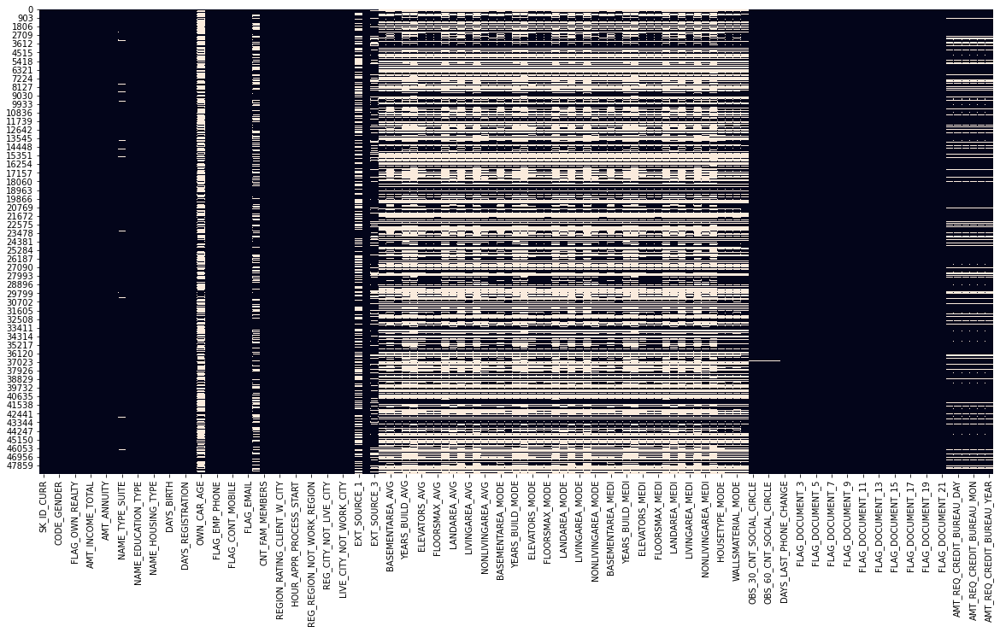

In [13]:
# Valeurs manquantes du dataframe
outils_data.get_missing_values(application_test, True, True)

Nombre de variables avec valeurs manquantes : 64


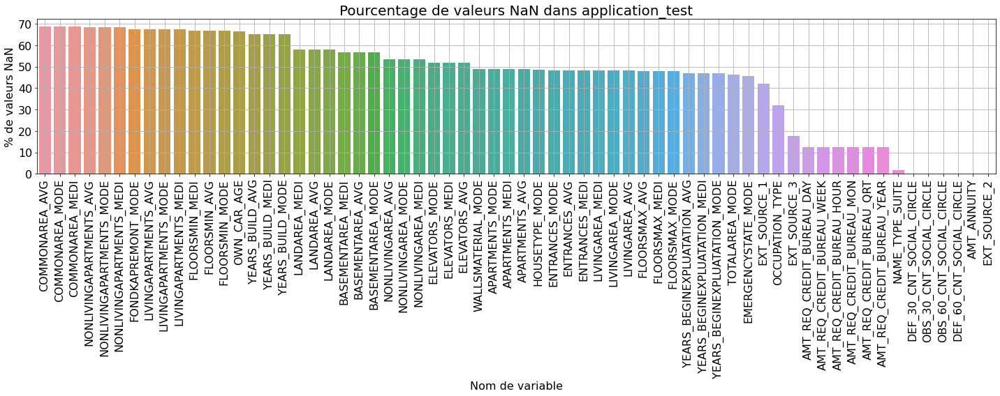

In [14]:
# Réprésentation visuelle des valeurs manquantes
df_nan_test = eda_kernel_fonctions.nan_df_create(application_test)
eda_kernel_fonctions.plot_nan_percent(df_nan_test, 'application_test',
                                      grid=True)

**Bilan** :
***
- Le nombre de variables avec des valeurs NaN est très similaire (64) à celui de l'application_train.
- Les pourcentages de valeurs NaN sont également assez similaires à ceux présents dans le jeu de données d'entraînement (train set). Cela signifie que les ensembles d'entraînement (train set) et de test (test set) ont une distribution assez similaire.

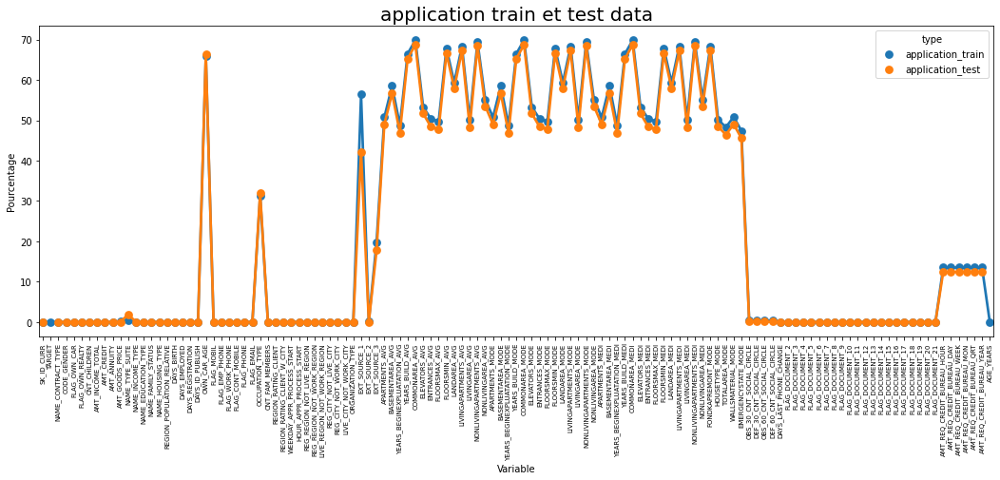

In [14]:
# Comparaison des pourcentages de NaN pour les application_train
# et application_test
fig = plt.figure(figsize=(18, 6))

miss_train = pd.DataFrame((application_train.isnull().sum()) * 100 /
                          application_train.shape[0]).reset_index()
miss_test = pd.DataFrame((application_test.isnull().sum()) * 100 /
                         application_test.shape[0]).reset_index()
miss_train['type'] = 'application_train'
miss_test['type'] = 'application_test'
missing = pd.concat([miss_train, miss_test], axis=0)
ax = sns.pointplot('index', 0, data=missing, hue='type')
plt.xticks(rotation=90, fontsize=7)
var = 'Pourcentage de valeurs manquantes dans '
plt.title('application train et test data', fontsize=20)
plt.ylabel('Pourcentage')
plt.xlabel('Variable')
plt.show()

[Source](https://www.kaggle.com/ozericyer/homecreditdefaultrisk-test-train-eda-1)

***
Suite de l'analyse pour les autres fichiers dans** P7_01_02_notebook_EDA-PART_2.ipynb**.
***